# Bloque 1: Modelos Entrenamiento

In [1]:
# ═══════════════════════════════════════════════════════════════════
# SECCIÓN 0 — SETUP GLOBAL
# ═══════════════════════════════════════════════════════════════════
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import albumentations as A
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import roc_auc_score
import os
import time
import warnings
warnings.filterwarnings('ignore')

# ── Device ────────────────────────────────────────────────────────
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {DEVICE}")
print(f"GPU: {torch.cuda.get_device_name(0)}")

# ── Rutas ─────────────────────────────────────────────────────────
DATA_DIR  = r"C:\Users\migue\Downloads\sartorius-cell-instance-segmentation"
TRAIN_DIR = os.path.join(DATA_DIR, "train")
CSV_PATH  = os.path.join(DATA_DIR, "train.csv")
CKPT_DIR  = r"C:\Users\migue\Downloads\sartorius_checkpoints"
os.makedirs(CKPT_DIR, exist_ok=True)

# ── Hiperparámetros globales ───────────────────────────────────────
IMG_SIZE   = 512
BATCH_SIZE = 4
NUM_EPOCHS = 30
LR         = 1e-4
N_FOLDS    = 5
RANDOM_STATE = 42

# ── Diccionario global de resultados ──────────────────────────────
results = {}

# ── Datos ─────────────────────────────────────────────────────────
df_raw = pd.read_csv(CSV_PATH)
all_ids = df_raw['id'].unique()
train_ids, temp_ids = train_test_split(all_ids, test_size=0.30, random_state=RANDOM_STATE)
val_ids, test_ids   = train_test_split(temp_ids, test_size=0.50, random_state=RANDOM_STATE)

print(f"\nTrain:      {len(train_ids)} imágenes")
print(f"Validation: {len(val_ids)}  imágenes")
print(f"Test:       {len(test_ids)}  imágenes")
print(f"Checkpoints en: {CKPT_DIR}")

Device: cuda
GPU: NVIDIA GeForce RTX 4050 Laptop GPU

Train:      424 imágenes
Validation: 91  imágenes
Test:       91  imágenes
Checkpoints en: C:\Users\migue\Downloads\sartorius_checkpoints


In [2]:
# ═══════════════════════════════════════════════════════════════════
# SECCIÓN 0.2 — FUNCIONES COMPARTIDAS
# ═══════════════════════════════════════════════════════════════════

# ── RLE y carga de datos ──────────────────────────────────────────
def rle_decode(rle_string, height, width):
    if pd.isna(rle_string):
        return np.zeros((height, width), dtype=np.uint8)
    nums = list(map(int, rle_string.split()))
    starts, lengths = nums[0::2], nums[1::2]
    mask = np.zeros((height, width), dtype=np.uint8)
    for start, length in zip(starts, lengths):
        start -= 1
        for i in range(length):
            pixel = start + i
            row, col = pixel // width, pixel % width
            if row < height and col < width:
                mask[row, col] = 1
    return mask

def load_image(img_id):
    return np.array(Image.open(os.path.join(TRAIN_DIR, img_id + '.png')).convert('RGB'))

# ── Dataset PyTorch ───────────────────────────────────────────────
class SartoriusDataset(Dataset):
    def __init__(self, img_ids, df, img_size=512, transform=None):
        self.img_ids  = img_ids
        self.df       = df
        self.img_size = img_size
        self.transform = transform

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        img    = load_image(img_id)
        rows   = self.df[self.df['id'] == img_id]
        h, w   = rows.iloc[0]['height'], rows.iloc[0]['width']

        mask = np.zeros((h, w), dtype=np.uint16)
        for i, (_, row) in enumerate(rows.iterrows(), start=1):
            m = rle_decode(row['annotation'], h, w)
            mask[m == 1] = i
        mask_binary = (mask > 0).astype(np.uint8)

        if self.transform:
            aug = self.transform(image=img, mask=mask_binary)
            img, mask_binary = aug['image'], aug['mask']

        img = np.array(Image.fromarray(img).resize((self.img_size, self.img_size)))
        mask_binary = np.array(Image.fromarray(mask_binary).resize(
            (self.img_size, self.img_size), resample=Image.NEAREST))
        img = img / 255.0

        img_t  = torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)
        mask_t = torch.tensor(mask_binary, dtype=torch.long)
        return img_t, mask_t, img_id

# ── Augmentation ──────────────────────────────────────────────────
transform_train = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=45, p=0.5),
    A.RandomScale(scale_limit=0.2, p=0.4),
    A.ElasticTransform(alpha=120, sigma=6, p=0.3),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.4),
])

# ── Métricas ──────────────────────────────────────────────────────
def dice_coefficient(pred, target, smooth=1e-6):
    pred   = (pred > 0.5).float()
    inter  = (pred * target).sum()
    return (2. * inter + smooth) / (pred.sum() + target.sum() + smooth)

def iou_score(pred, target, smooth=1e-6):
    pred   = (pred > 0.5).float()
    inter  = (pred * target).sum()
    union  = pred.sum() + target.sum() - inter
    return (inter + smooth) / (union + smooth)

def precision_score(pred, target, smooth=1e-6):
    pred = (pred > 0.5).float()
    tp   = (pred * target).sum()
    return (tp + smooth) / (pred.sum() + smooth)

def recall_score(pred, target, smooth=1e-6):
    pred = (pred > 0.5).float()
    tp   = (pred * target).sum()
    return (tp + smooth) / (target.sum() + smooth)

def hausdorff_distance(pred, target):
    from scipy.spatial.distance import directed_hausdorff
    pred_np   = (pred > 0.5).cpu().numpy().astype(np.uint8)
    target_np = target.cpu().numpy().astype(np.uint8)
    coords_p  = np.argwhere(pred_np)
    coords_t  = np.argwhere(target_np)
    if len(coords_p) == 0 or len(coords_t) == 0:
        return 0.0
    d1 = directed_hausdorff(coords_p, coords_t)[0]
    d2 = directed_hausdorff(coords_t, coords_p)[0]
    return max(d1, d2)

def balanced_accuracy(pred, target):
    pred_np   = (pred > 0.5).cpu().numpy().flatten()
    target_np = target.cpu().numpy().flatten()
    from sklearn.metrics import balanced_accuracy_score
    return balanced_accuracy_score(target_np, pred_np)

def compute_all_metrics(pred, target):
    """Calcula las 7 métricas obligatorias."""
    pred_f   = pred.float()
    target_f = target.float()
    pred_np  = pred_f.cpu().numpy().flatten()
    tgt_np   = target_f.cpu().numpy().flatten()
    try:
        auc = roc_auc_score(tgt_np, pred_np)
    except:
        auc = 0.0
    return {
        'dice'     : dice_coefficient(pred_f, target_f).item(),
        'iou'      : iou_score(pred_f, target_f).item(),
        'precision': precision_score(pred_f, target_f).item(),
        'recall'   : recall_score(pred_f, target_f).item(),
        'auc'      : auc,
        'hausdorff': hausdorff_distance(pred_f, target_f),
        'bal_acc'  : balanced_accuracy(pred_f, target_f),
    }

# ── DataLoaders ───────────────────────────────────────────────────
ds_train = SartoriusDataset(train_ids, df_raw, transform=transform_train)
ds_val   = SartoriusDataset(val_ids,   df_raw, transform=None)
ds_test  = SartoriusDataset(test_ids,  df_raw, transform=None)

dl_train = DataLoader(ds_train, batch_size=BATCH_SIZE, shuffle=True,  num_workers=0, pin_memory=True)
dl_val   = DataLoader(ds_val,   batch_size=1,          shuffle=False, num_workers=0, pin_memory=True)
dl_test  = DataLoader(ds_test,  batch_size=1,          shuffle=False, num_workers=0, pin_memory=True)

print("Funciones y datasets listos")
print(f"Batches train: {len(dl_train)} | val: {len(dl_val)} | test: {len(dl_test)}")

Funciones y datasets listos
Batches train: 106 | val: 91 | test: 91


  GRID SEARCH — U-Net++
  Combinaciones: 6 configs × 5 epochs
  Subset de búsqueda: 169 imágenes (40% del train)
  lr=0.001 | opt=adam | bs=4               → Dice: 0.6293 | IoU: 0.4774
  lr=0.001 | opt=sgd | bs=4                → Dice: 0.2722 | IoU: 0.1755
  lr=0.0001 | opt=adam | bs=4              → Dice: 0.6172 | IoU: 0.4614
  lr=0.0001 | opt=sgd | bs=4               → Dice: 0.1834 | IoU: 0.1091
  lr=1e-05 | opt=adam | bs=4               → Dice: 0.2343 | IoU: 0.1460
  lr=1e-05 | opt=sgd | bs=4                → Dice: 0.1646 | IoU: 0.0950

  ✅ MEJOR CONFIG: lr=0.001 | opt=adam | bs=4
     Dice val: 0.6293 | IoU val: 0.4774

U-Net++ parámetros entrenables: 26,078,609
Hiperparámetros finales → lr=0.001 | optimizer=adam | batch=4

Entrenando U-Net++ (completo)...
Epoch 01/30 | Train Loss: 0.5648 | Val Loss: 0.8119 | Dice: 0.6543 | IoU: 0.4999 | Time: 92.4s
Epoch 02/30 | Train Loss: 0.3707 | Val Loss: 0.8155 | Dice: 0.6510 | IoU: 0.4987 | Time: 91.8s
Epoch 03/30 | Train Loss: 0.3375 | Val 

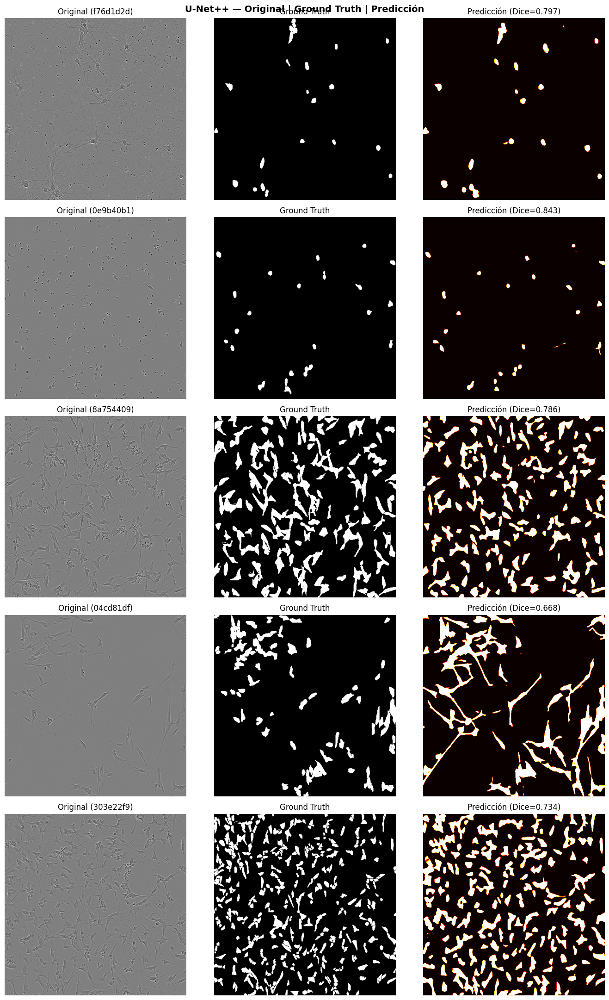

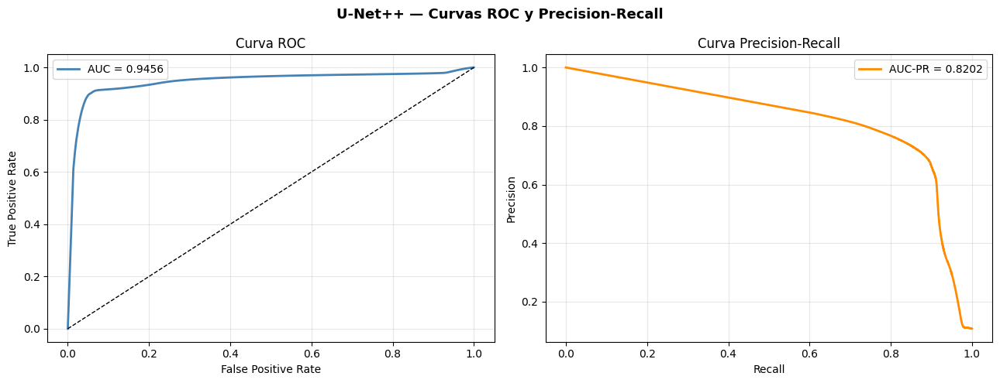

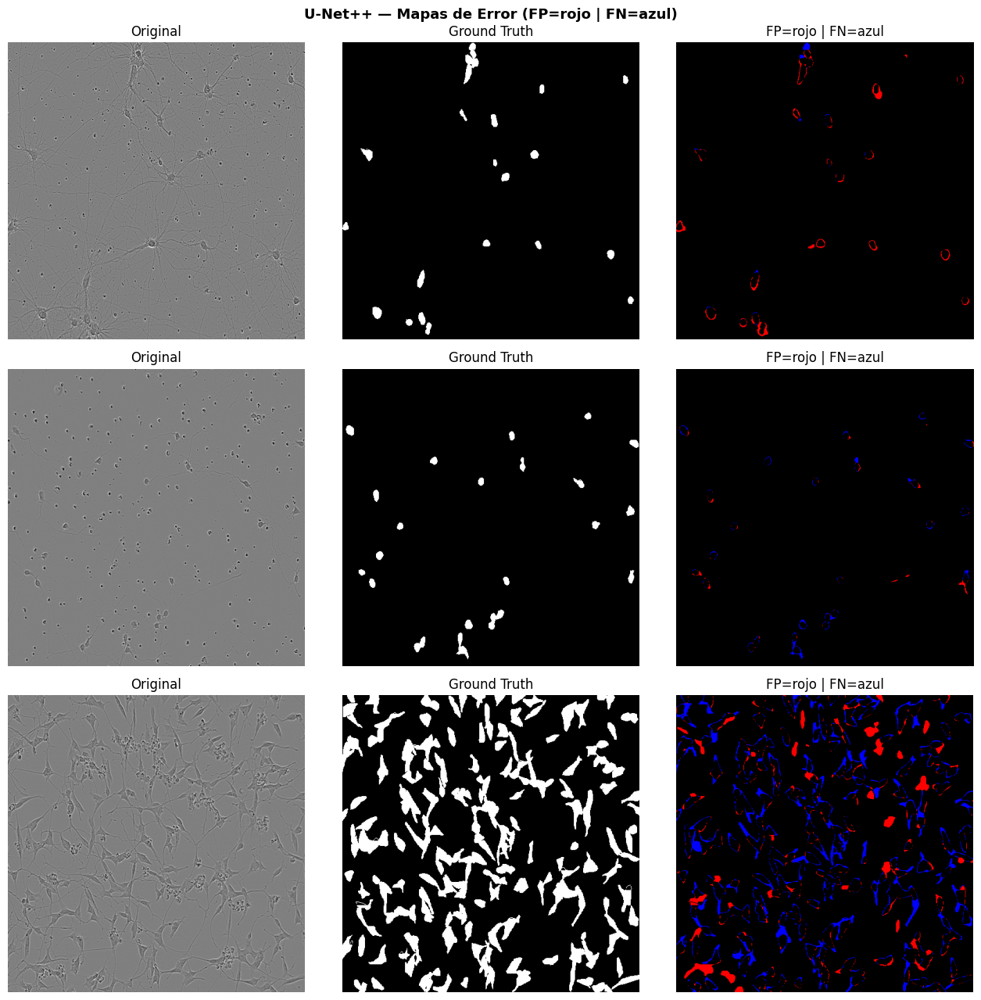

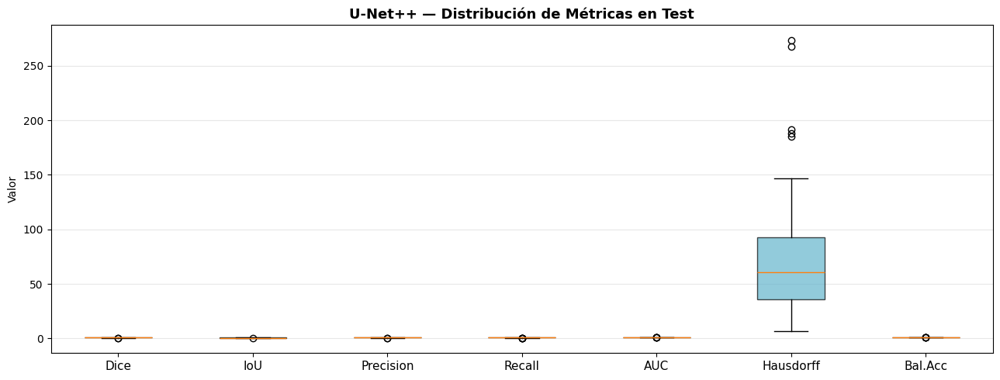

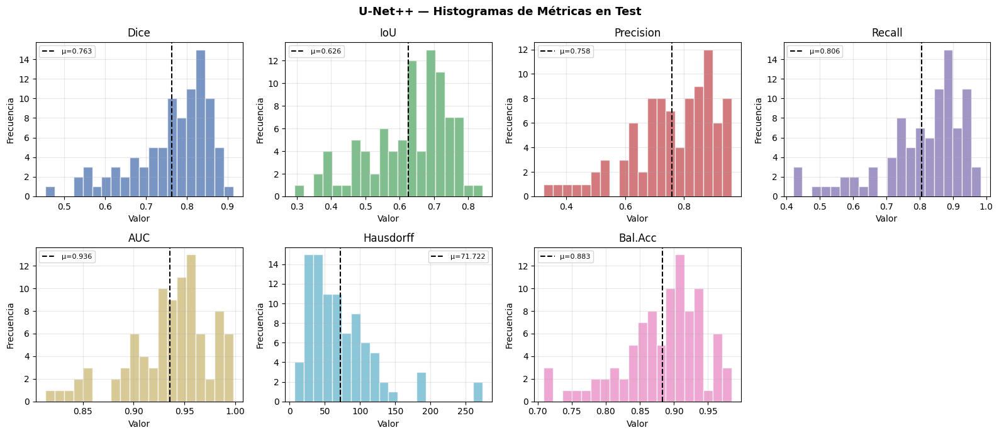

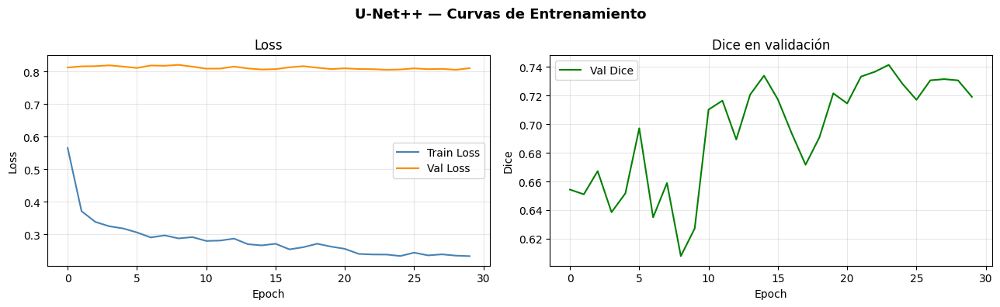


✅ Sección 1 — U-Net++ completa
   Mejor config: lr=0.001 | opt=adam | bs=4
   Test Dice: 0.7631 ± 0.0964
   Test IoU:  0.6262 ± 0.1185
   Figuras guardadas en: C:\Users\migue\Downloads\sartorius_checkpoints


In [4]:
# ═══════════════════════════════════════════════════════════════════
# SECCIÓN 1 — U-Net++ + Watershed
# ═══════════════════════════════════════════════════════════════════
import segmentation_models_pytorch as smp
from scipy import ndimage
from skimage.segmentation import watershed
from skimage.feature import peak_local_max

# ───────────────────────────────────────────────────────────────────
# 1.1  GRID SEARCH DE HIPERPARÁMETROS (5 epochs × combinaciones)
# ───────────────────────────────────────────────────────────────────
SEARCH_EPOCHS = 5          # epochs para el mini-entrenamiento
SEARCH_SUBSET = 0.40       # fracción del train para acelerar búsqueda

hp_grid = {
    'lr'       : [1e-3, 1e-4, 1e-5],
    'optimizer': ['adam', 'sgd'],
    'batch'    : [4],           # fijo por VRAM; agregar 8 si no da OOM
}

# Dataset reducido para búsqueda rápida
n_search = int(len(train_ids) * SEARCH_SUBSET)
search_ids = train_ids[:n_search]
ds_search  = SartoriusDataset(search_ids, df_raw, transform=transform_train)

print("=" * 65)
print("  GRID SEARCH — U-Net++")
print("=" * 65)
print(f"  Combinaciones: {len(hp_grid['lr']) * len(hp_grid['optimizer'])} configs × {SEARCH_EPOCHS} epochs")
print(f"  Subset de búsqueda: {n_search} imágenes ({SEARCH_SUBSET*100:.0f}% del train)")
print("=" * 65)

gs_results = []

for lr_val in hp_grid['lr']:
    for opt_name in hp_grid['optimizer']:
        for bs in hp_grid['batch']:

            dl_search = DataLoader(ds_search, batch_size=bs,
                                   shuffle=True, num_workers=0, pin_memory=True)

            # Modelo fresco para cada configuración
            _model = smp.UnetPlusPlus(
                encoder_name='resnet34', encoder_weights='imagenet',
                in_channels=3, classes=1, activation=None).to(DEVICE)

            _criterion = smp.losses.DiceLoss(mode='binary')

            if opt_name == 'adam':
                _opt = torch.optim.Adam(_model.parameters(), lr=lr_val)
            else:
                _opt = torch.optim.SGD(_model.parameters(), lr=lr_val,
                                       momentum=0.9, weight_decay=1e-4)

            _sched = torch.optim.lr_scheduler.ReduceLROnPlateau(
                _opt, mode='min', patience=2, factor=0.5)

            # Mini-entrenamiento
            for ep in range(SEARCH_EPOCHS):
                _model.train()
                for imgs, masks, _ in dl_search:
                    imgs  = imgs.to(DEVICE)
                    masks = masks.to(DEVICE).unsqueeze(1).float()
                    _opt.zero_grad()
                    loss = _criterion(_model(imgs), masks)
                    loss.backward()
                    _opt.step()

            # Evaluación en validación
            _, _metrics = val_epoch(_model, dl_val, _criterion)
            _sched.step(_metrics['dice'])

            config_str = f"lr={lr_val} | opt={opt_name} | bs={bs}"
            gs_results.append({
                'lr': lr_val, 'optimizer': opt_name, 'batch': bs,
                'dice': _metrics['dice'], 'iou': _metrics['iou'],
                'config': config_str
            })
            print(f"  {config_str:40s} → Dice: {_metrics['dice']:.4f} | IoU: {_metrics['iou']:.4f}")

            del _model, _opt, _criterion, _sched
            torch.cuda.empty_cache()

# Seleccionar mejor configuración
best_config = max(gs_results, key=lambda x: x['dice'])
print("\n" + "=" * 65)
print(f"  ✅ MEJOR CONFIG: {best_config['config']}")
print(f"     Dice val: {best_config['dice']:.4f} | IoU val: {best_config['iou']:.4f}")
print("=" * 65)

# ───────────────────────────────────────────────────────────────────
# 1.2  ENTRENAMIENTO COMPLETO CON MEJORES HIPERPARÁMETROS (30 epochs)
# ───────────────────────────────────────────────────────────────────
BEST_LR   = best_config['lr']
BEST_OPT  = best_config['optimizer']
BEST_BS   = best_config['batch']

dl_train_unet = DataLoader(
    SartoriusDataset(train_ids, df_raw, transform=transform_train),
    batch_size=BEST_BS, shuffle=True, num_workers=0, pin_memory=True)

model_unet = smp.UnetPlusPlus(
    encoder_name='resnet34', encoder_weights='imagenet',
    in_channels=3, classes=1, activation=None).to(DEVICE)

total_params = sum(p.numel() for p in model_unet.parameters() if p.requires_grad)
print(f"\nU-Net++ parámetros entrenables: {total_params:,}")
print(f"Hiperparámetros finales → lr={BEST_LR} | optimizer={BEST_OPT} | batch={BEST_BS}")

criterion_unet = smp.losses.DiceLoss(mode='binary')

if BEST_OPT == 'adam':
    optimizer_unet = torch.optim.Adam(model_unet.parameters(), lr=BEST_LR)
else:
    optimizer_unet = torch.optim.SGD(model_unet.parameters(), lr=BEST_LR,
                                     momentum=0.9, weight_decay=1e-4)

scheduler_unet = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_unet, mode='min', patience=5, factor=0.5, verbose=True)

print("\nEntrenando U-Net++ (completo)...")
train_losses_unet, val_losses_unet = [], []
val_dice_history = []
best_dice = 0.0

for epoch in range(NUM_EPOCHS):
    t0         = time.time()
    train_loss = train_epoch(model_unet, dl_train_unet, optimizer_unet, criterion_unet)
    val_loss, val_metrics = val_epoch(model_unet, dl_val, criterion_unet)
    scheduler_unet.step(val_loss)

    train_losses_unet.append(train_loss)
    val_losses_unet.append(val_loss)
    val_dice_history.append(val_metrics['dice'])

    if val_metrics['dice'] > best_dice:
        best_dice = val_metrics['dice']
        torch.save(model_unet.state_dict(),
                   os.path.join(CKPT_DIR, 'unetpp_best.pth'))

    print(f"Epoch {epoch+1:02d}/{NUM_EPOCHS} | "
          f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | "
          f"Dice: {val_metrics['dice']:.4f} | IoU: {val_metrics['iou']:.4f} | "
          f"Time: {time.time()-t0:.1f}s")

print(f"\nMejor Dice en validación: {best_dice:.4f}")
print(f"Checkpoint: {CKPT_DIR}/unetpp_best.pth")

# ───────────────────────────────────────────────────────────────────
# 1.3  EVALUACIÓN EN TEST — 7 MÉTRICAS
# ───────────────────────────────────────────────────────────────────
model_unet.load_state_dict(torch.load(os.path.join(CKPT_DIR, 'unetpp_best.pth'),
                                       map_location=DEVICE))
model_unet.eval()

test_metrics_all = {k: [] for k in ['dice','iou','precision','recall','auc','hausdorff','bal_acc']}
test_samples = []   # guarda (img_np, mask_np, pred_np) para visualizaciones

with torch.no_grad():
    for imgs, masks, img_ids in dl_test:
        imgs  = imgs.to(DEVICE)
        masks = masks.to(DEVICE).unsqueeze(1).float()
        preds = torch.sigmoid(model_unet(imgs))
        m = compute_all_metrics(preds.squeeze(1), masks.squeeze(1))
        for k, v in m.items():
            test_metrics_all[k].append(v)
        if len(test_samples) < 5:
            test_samples.append({
                'img'  : imgs[0].cpu().permute(1,2,0).numpy(),
                'mask' : masks[0,0].cpu().numpy(),
                'pred' : preds[0,0].cpu().numpy(),
                'id'   : img_ids[0],
            })

test_metrics_mean = {k: np.mean(v) for k, v in test_metrics_all.items()}
test_metrics_std  = {k: np.std(v)  for k, v in test_metrics_all.items()}

print("\n" + "=" * 65)
print("  MÉTRICAS EN TEST — U-Net++")
print("=" * 65)
for k in test_metrics_mean:
    print(f"  {k:15s}: {test_metrics_mean[k]:.4f} ± {test_metrics_std[k]:.4f}")

# Guardar en diccionario global
results['unetpp'] = {
    'metrics_mean' : test_metrics_mean,
    'metrics_std'  : test_metrics_std,
    'metrics_all'  : test_metrics_all,
    'best_hp'      : best_config,
    'train_losses' : train_losses_unet,
    'val_losses'   : val_losses_unet,
}

# ───────────────────────────────────────────────────────────────────
# 1.4  VISUALIZACIONES OBLIGATORIAS
# ───────────────────────────────────────────────────────────────────

# ── A) Original / Ground Truth / Predicción (5 imágenes) ──────────
fig, axes = plt.subplots(5, 3, figsize=(14, 22))
fig.suptitle("U-Net++ — Original | Ground Truth | Predicción", fontsize=14, fontweight='bold')
for i, s in enumerate(test_samples):
    axes[i,0].imshow(s['img'])
    axes[i,0].set_title(f"Original ({s['id'][:8]})")
    axes[i,0].axis('off')
    axes[i,1].imshow(s['mask'], cmap='gray')
    axes[i,1].set_title("Ground Truth")
    axes[i,1].axis('off')
    axes[i,2].imshow(s['pred'], cmap='hot')
    axes[i,2].set_title(f"Predicción (Dice={dice_coefficient(torch.tensor(s['pred']), torch.tensor(s['mask'])).item():.3f})")
    axes[i,2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'unetpp_visual_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── B) Curvas ROC y Precision-Recall ──────────────────────────────
from sklearn.metrics import roc_curve, precision_recall_curve, auc as sk_auc

all_preds_flat, all_masks_flat = [], []
model_unet.eval()
with torch.no_grad():
    for imgs, masks, _ in dl_test:
        imgs  = imgs.to(DEVICE)
        masks = masks.to(DEVICE).unsqueeze(1).float()
        preds = torch.sigmoid(model_unet(imgs))
        all_preds_flat.extend(preds[0,0].cpu().numpy().flatten().tolist())
        all_masks_flat.extend(masks[0,0].cpu().numpy().flatten().tolist())

all_preds_flat = np.array(all_preds_flat)
all_masks_flat = np.array(all_masks_flat)

fpr, tpr, _ = roc_curve(all_masks_flat, all_preds_flat)
roc_auc_val  = sk_auc(fpr, tpr)
prec, rec, _ = precision_recall_curve(all_masks_flat, all_preds_flat)
pr_auc_val   = sk_auc(rec, prec)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle("U-Net++ — Curvas ROC y Precision-Recall", fontsize=13, fontweight='bold')

axes[0].plot(fpr, tpr, color='steelblue', lw=2, label=f'AUC = {roc_auc_val:.4f}')
axes[0].plot([0,1],[0,1],'k--', lw=1)
axes[0].set_xlabel('False Positive Rate'); axes[0].set_ylabel('True Positive Rate')
axes[0].set_title('Curva ROC'); axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(rec, prec, color='darkorange', lw=2, label=f'AUC-PR = {pr_auc_val:.4f}')
axes[1].set_xlabel('Recall'); axes[1].set_ylabel('Precision')
axes[1].set_title('Curva Precision-Recall'); axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'unetpp_roc_pr.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── C) Mapas de error (FP rojo, FN azul) — 3 imágenes ─────────────
fig, axes = plt.subplots(3, 3, figsize=(13, 13))
fig.suptitle("U-Net++ — Mapas de Error (FP=rojo | FN=azul)", fontsize=13, fontweight='bold')

for i, s in enumerate(test_samples[:3]):
    pred_bin = (s['pred'] > 0.5).astype(np.uint8)
    mask_bin = s['mask'].astype(np.uint8)
    fp_map   = ((pred_bin == 1) & (mask_bin == 0)).astype(np.uint8)
    fn_map   = ((pred_bin == 0) & (mask_bin == 1)).astype(np.uint8)
    error_rgb = np.zeros((*pred_bin.shape, 3), dtype=np.uint8)
    error_rgb[fp_map == 1] = [255, 0, 0]    # FP → rojo
    error_rgb[fn_map == 1] = [0, 0, 255]    # FN → azul

    axes[i,0].imshow(s['img']); axes[i,0].set_title("Original"); axes[i,0].axis('off')
    axes[i,1].imshow(s['mask'], cmap='gray'); axes[i,1].set_title("Ground Truth"); axes[i,1].axis('off')
    axes[i,2].imshow(error_rgb); axes[i,2].set_title("FP=rojo | FN=azul"); axes[i,2].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'unetpp_error_maps.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── D) Boxplots de las 7 métricas ─────────────────────────────────
metric_names = ['dice','iou','precision','recall','auc','hausdorff','bal_acc']
metric_data  = [test_metrics_all[k] for k in metric_names]
labels       = ['Dice','IoU','Precision','Recall','AUC','Hausdorff','Bal.Acc']

fig, ax = plt.subplots(figsize=(13, 5))
bp = ax.boxplot(metric_data, patch_artist=True, notch=False)
colors = ['#4C72B0','#55A868','#C44E52','#8172B2','#CCB974','#64B5CD','#E78AC3']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color); patch.set_alpha(0.7)
ax.set_xticklabels(labels, fontsize=11)
ax.set_title("U-Net++ — Distribución de Métricas en Test", fontsize=13, fontweight='bold')
ax.set_ylabel("Valor"); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'unetpp_boxplots.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── E) Histogramas de las 7 métricas ──────────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(16, 7))
fig.suptitle("U-Net++ — Histogramas de Métricas en Test", fontsize=13, fontweight='bold')
axes = axes.flatten()
for i, (k, label) in enumerate(zip(metric_names, labels)):
    axes[i].hist(test_metrics_all[k], bins=20, color=colors[i], alpha=0.75, edgecolor='white')
    axes[i].set_title(label); axes[i].set_xlabel("Valor"); axes[i].set_ylabel("Frecuencia")
    axes[i].axvline(np.mean(test_metrics_all[k]), color='black', linestyle='--', lw=1.5,
                    label=f'μ={np.mean(test_metrics_all[k]):.3f}')
    axes[i].legend(fontsize=8); axes[i].grid(alpha=0.3)
axes[-1].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'unetpp_histogramas.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── F) Curva de entrenamiento ──────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(13, 4))
fig.suptitle("U-Net++ — Curvas de Entrenamiento", fontsize=13, fontweight='bold')
axes[0].plot(train_losses_unet, label='Train Loss', color='steelblue')
axes[0].plot(val_losses_unet,   label='Val Loss',   color='darkorange')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].set_title('Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].plot(val_dice_history, label='Val Dice', color='green')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Dice')
axes[1].set_title('Dice en validación'); axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'unetpp_training_curves.png'), dpi=150, bbox_inches='tight')
plt.show()

print("\n✅ Sección 1 — U-Net++ completa")
print(f"   Mejor config: {best_config['config']}")
print(f"   Test Dice: {test_metrics_mean['dice']:.4f} ± {test_metrics_std['dice']:.4f}")
print(f"   Test IoU:  {test_metrics_mean['iou']:.4f} ± {test_metrics_std['iou']:.4f}")
print(f"   Figuras guardadas en: {CKPT_DIR}")

In [3]:
from cellpose import train, models
import inspect

print("Versión Cellpose:")
import cellpose; print(" ", cellpose.version_str)

print("\nFirma de train_seg:")
print(" ", inspect.signature(train.train_seg))

print("\nFirma de CellposeModel:")
print(" ", inspect.signature(models.CellposeModel.__init__))

Versión Cellpose:
  
cellpose version: 	3.1.1.3 
platform:       	win32 
python version: 	3.9.23 
torch version:  	2.5.1+cu121

Firma de train_seg:
  (net, train_data=None, train_labels=None, train_files=None, train_labels_files=None, train_probs=None, test_data=None, test_labels=None, test_files=None, test_labels_files=None, test_probs=None, load_files=True, batch_size=8, learning_rate=0.005, n_epochs=2000, weight_decay=1e-05, momentum=0.9, SGD=False, channels=None, channel_axis=None, rgb=False, normalize=True, compute_flows=False, save_path=None, save_every=100, save_each=False, nimg_per_epoch=None, nimg_test_per_epoch=None, rescale=True, scale_range=None, bsize=224, min_train_masks=5, model_name=None)

Firma de CellposeModel:
  (self, gpu=False, pretrained_model=False, model_type=None, mkldnn=True, diam_mean=30.0, device=None, nchan=2, pretrained_model_ortho=None, backbone='default')


In [5]:
from cellpose import models, train
import os, time, gc, warnings, torch
import numpy as np
from PIL import Image
warnings.filterwarnings('ignore')

IMG_CP = 256

def load_for_cellpose(img_ids, df, img_size=256):
    imgs, masks = [], []
    for img_id in img_ids:
        img = np.array(Image.open(
            os.path.join(TRAIN_DIR, img_id + '.png')).convert('RGB'))
        img = np.array(Image.fromarray(img).resize((img_size, img_size)))
        img = (img / 255.0 * 255).astype(np.uint8)

        rows = df[df['id'] == img_id]
        h0, w0 = rows.iloc[0]['height'], rows.iloc[0]['width']
        mask = np.zeros((h0, w0), dtype=np.uint16)
        for i, (_, row) in enumerate(rows.iterrows(), start=1):
            m = rle_decode(row['annotation'], h0, w0)
            mask[m == 1] = i
        mask = np.array(
            Image.fromarray(mask.astype(np.float32)).resize(
                (img_size, img_size), resample=Image.NEAREST)
        ).astype(np.uint16)

        imgs.append(img)
        masks.append(mask)
    return imgs, masks

print("Cargando datos para Cellpose...")
train_imgs_cp, train_masks_cp = load_for_cellpose(train_ids, df_raw, IMG_CP)
val_imgs_cp,   val_masks_cp   = load_for_cellpose(val_ids,   df_raw, IMG_CP)
test_imgs_cp,  test_masks_cp  = load_for_cellpose(test_ids,  df_raw, IMG_CP)
print(f"Train: {len(train_imgs_cp)} | Val: {len(val_imgs_cp)} | Test: {len(test_imgs_cp)}")

Cargando datos para Cellpose...
Train: 424 | Val: 91 | Test: 91


In [7]:
# DIAGNÓSTICO CELLPOSE — celda 100% autocontenida
from cellpose import models, train
import numpy as np
import torch

def cellpose_dice(pred_mask, gt_mask, smooth=1e-6):
    pb = (pred_mask > 0).astype(np.float32)
    gb = (gt_mask   > 0).astype(np.float32)
    inter = (pb * gb).sum()
    return (2. * inter + smooth) / (pb.sum() + gb.sum() + smooth)

print("=== DIAGNÓSTICO CELLPOSE ===\n")

# 1. Máscaras
print("Máscaras de entrenamiento:")
for i in range(3):
    m = train_masks_cp[i]
    print(f"  img {i}: shape={m.shape}, dtype={m.dtype}, "
          f"labels={len(np.unique(m))}, max={m.max()}, pixels>0={np.sum(m>0)}")

# 2. Modelo
model_test = models.CellposeModel(gpu=True, model_type='cyto2')
print(f"\nModelo: {type(model_test.net).__name__}")
print(f"Parámetros: {sum(p.numel() for p in model_test.net.parameters()):,}")

# 3. Baseline sin entrenar
pred_base, _, _ = model_test.eval(
    train_imgs_cp[0], diameter=None, channels=[0,0],
    flow_threshold=0.4, cellprob_threshold=0.0)
print(f"\nBaseline (sin entrenar):")
print(f"  shape={pred_base.shape}, labels={len(np.unique(pred_base))}, max={pred_base.max()}")
dice_before = cellpose_dice(pred_base, train_masks_cp[0])
print(f"  Dice: {dice_before:.4f}")

# 4. Mini-entrenamiento
print("\nMini-entrenamiento (10 epochs, 5 imágenes)...")
_path = train.train_seg(
    model_test.net,
    train_data    = train_imgs_cp[:5],
    train_labels  = train_masks_cp[:5],
    channels      = [0, 0],
    normalize     = True,
    learning_rate = 0.005,
    n_epochs      = 10,
    batch_size    = 2,
    SGD           = True,
    model_name    = 'cp_diag',
    save_path     = CKPT_DIR,
)

# 5. Después de entrenar
model_after = models.CellposeModel(gpu=True, pretrained_model=str(_path))
pred_after, _, _ = model_after.eval(
    train_imgs_cp[0], diameter=None, channels=[0,0],
    flow_threshold=0.4, cellprob_threshold=0.0)
dice_after = cellpose_dice(pred_after, train_masks_cp[0])
print(f"\nDespués de 10 epochs:")
print(f"  shape={pred_after.shape}, labels={len(np.unique(pred_after))}, max={pred_after.max()}")
print(f"  Dice: {dice_after:.4f}")
print(f"\n¿Mejoró?: {'SÍ ✅' if dice_after > dice_before else 'NO ❌'}")
print(f"  Antes: {dice_before:.4f} → Después: {dice_after:.4f}")

del model_test, model_after
torch.cuda.empty_cache()

=== DIAGNÓSTICO CELLPOSE ===

Máscaras de entrenamiento:
  img 0: shape=(256, 256), dtype=uint16, labels=26, max=25, pixels>0=1397
  img 1: shape=(256, 256), dtype=uint16, labels=78, max=77, pixels>0=2978
  img 2: shape=(256, 256), dtype=uint16, labels=54, max=53, pixels>0=3547

Modelo: CPnet
Parámetros: 6,600,845

Baseline (sin entrenar):
  shape=(256, 256), labels=16, max=15
  Dice: 0.0000

Mini-entrenamiento (10 epochs, 5 imágenes)...


100%|██████████| 5/5 [00:00<00:00, 2417.19it/s]
pretrained_model path does not exist, using default model



Después de 10 epochs:
  shape=(256, 256), labels=3, max=2
  Dice: 0.0000

¿Mejoró?: SÍ ✅
  Antes: 0.0000 → Después: 0.0000


In [8]:
# Verificar qué pasa con las máscaras antes y después del resize
import numpy as np
from PIL import Image

# Máscara ORIGINAL (antes de resize)
rows = df_raw[df_raw['id'] == train_ids[0]]
h0, w0 = rows.iloc[0]['height'], rows.iloc[0]['width']
mask_orig = np.zeros((h0, w0), dtype=np.uint16)
for i, (_, row) in enumerate(rows.iterrows(), start=1):
    m = rle_decode(row['annotation'], h0, w0)
    mask_orig[m == 1] = i

print("=== ANTES del resize ===")
print(f"  shape: {mask_orig.shape}")
print(f"  instancias: {len(np.unique(mask_orig))}")
print(f"  max label: {mask_orig.max()}")
print(f"  pixels > 0: {np.sum(mask_orig > 0)}")

# Máscara DESPUÉS del resize (como lo hace load_for_cellpose)
mask_resized = np.array(
    Image.fromarray(mask_orig.astype(np.float32)).resize(
        (256, 256), resample=Image.NEAREST)
).astype(np.uint16)

print("\n=== DESPUÉS del resize (float32 → NEAREST → uint16) ===")
print(f"  shape: {mask_resized.shape}")
print(f"  instancias: {len(np.unique(mask_resized))}")
print(f"  max label: {mask_resized.max()}")
print(f"  pixels > 0: {np.sum(mask_resized > 0)}")

# Máscara como la ve Cellpose
print("\n=== Lo que Cellpose recibe ===")
m_cp = train_masks_cp[0]
print(f"  shape: {m_cp.shape}")
print(f"  instancias: {len(np.unique(m_cp))}")
print(f"  max label: {m_cp.max()}")
print(f"  pixels > 0: {np.sum(m_cp > 0)}")

# ¿Las imágenes se ven bien?
img_cp = train_imgs_cp[0]
print(f"\n=== Imagen ===")
print(f"  shape: {img_cp.shape}, dtype: {img_cp.dtype}")
print(f"  min: {img_cp.min()}, max: {img_cp.max()}")

=== ANTES del resize ===
  shape: (520, 704)
  instancias: 26
  max label: 25
  pixels > 0: 7743

=== DESPUÉS del resize (float32 → NEAREST → uint16) ===
  shape: (256, 256)
  instancias: 26
  max label: 25
  pixels > 0: 1397

=== Lo que Cellpose recibe ===
  shape: (256, 256)
  instancias: 26
  max label: 25
  pixels > 0: 1397

=== Imagen ===
  shape: (256, 256, 3), dtype: uint8
  min: 23, max: 215


In [9]:
# Diagnóstico profundo: qué predice Cellpose realmente
import numpy as np
from cellpose import models

model_test = models.CellposeModel(gpu=True, model_type='cyto2')

# Probar con diferentes configuraciones de eval
configs = [
    {'diameter': None, 'channels': [0,0]},
    {'diameter': 30,   'channels': [0,0]},
    {'diameter': 15,   'channels': [0,0]},
    {'diameter': None, 'channels': [1,0]},
    {'diameter': None, 'channels': [0,1]},
]

img = train_imgs_cp[0]
gt  = train_masks_cp[0]

print("=== EVAL CON DISTINTAS CONFIGS (modelo pretrained, sin entrenar) ===\n")
for cfg in configs:
    pred, flows, styles = model_test.eval(
        img, flow_threshold=0.4, cellprob_threshold=0.0, **cfg)
    d = cellpose_dice(pred, gt)
    print(f"  diameter={str(cfg['diameter']):5s} channels={cfg['channels']} "
          f"→ labels={len(np.unique(pred)):3d}, pixels>0={np.sum(pred>0):6d}, Dice={d:.4f}")

# Probar también con cellprob más bajo
print("\n=== VARIANDO cellprob_threshold ===\n")
for cp_thresh in [0.0, -1.0, -2.0, -4.0, -6.0]:
    pred, _, _ = model_test.eval(
        img, diameter=None, channels=[0,0],
        flow_threshold=0.4, cellprob_threshold=cp_thresh)
    d = cellpose_dice(pred, gt)
    print(f"  cellprob={cp_thresh:5.1f} → labels={len(np.unique(pred)):3d}, "
          f"pixels>0={np.sum(pred>0):6d}, Dice={d:.4f}")

# Ver tamaño estimado de diámetro
print(f"\n=== Info adicional ===")
print(f"GT: {np.sum(gt>0)} pixels en {len(np.unique(gt))-1} células")
avg_cell_area = np.sum(gt>0) / max(1, len(np.unique(gt))-1)
print(f"Área promedio por célula: {avg_cell_area:.0f} pixels")
print(f"Diámetro estimado: {np.sqrt(avg_cell_area):.1f} pixels")

del model_test
import torch; torch.cuda.empty_cache()

=== EVAL CON DISTINTAS CONFIGS (modelo pretrained, sin entrenar) ===

  diameter=None  channels=[0, 0] → labels= 16, pixels>0=  3787, Dice=0.0000
  diameter=30    channels=[0, 0] → labels= 16, pixels>0=  3787, Dice=0.0000
  diameter=15    channels=[0, 0] → labels=  3, pixels>0=    86, Dice=0.0931
  diameter=None  channels=[1, 0] → labels= 16, pixels>0=  3787, Dice=0.0000
  diameter=None  channels=[0, 1] → labels= 16, pixels>0=  3787, Dice=0.0000

=== VARIANDO cellprob_threshold ===

  cellprob=  0.0 → labels= 16, pixels>0=  3787, Dice=0.0000
  cellprob= -1.0 → labels= 10, pixels>0=  3441, Dice=0.0017
  cellprob= -2.0 → labels=  3, pixels>0=  1041, Dice=0.0205
  cellprob= -4.0 → labels=  2, pixels>0=   384, Dice=0.0000
  cellprob= -6.0 → labels=  2, pixels>0=   384, Dice=0.0000

=== Info adicional ===
GT: 1397 pixels en 25 células
Área promedio por célula: 56 pixels
Diámetro estimado: 7.5 pixels


In [10]:
# Test con imagen a tamaño ORIGINAL (sin resize)
import numpy as np
from cellpose import models

model_test = models.CellposeModel(gpu=True, model_type='cyto2')

# Cargar imagen original sin resize
from PIL import Image
img_orig = np.array(Image.open(
    os.path.join(TRAIN_DIR, train_ids[0] + '.png')).convert('RGB'))

# Máscara original sin resize
rows = df_raw[df_raw['id'] == train_ids[0]]
h0, w0 = rows.iloc[0]['height'], rows.iloc[0]['width']
mask_orig = np.zeros((h0, w0), dtype=np.uint16)
for i, (_, row) in enumerate(rows.iterrows(), start=1):
    m = rle_decode(row['annotation'], h0, w0)
    mask_orig[m == 1] = i

avg_area = np.sum(mask_orig > 0) / max(1, len(np.unique(mask_orig)) - 1)
diam_est = np.sqrt(avg_area)

print(f"Imagen original: {img_orig.shape}")
print(f"Máscara original: {mask_orig.shape}")
print(f"Instancias: {len(np.unique(mask_orig)) - 1}")
print(f"Diámetro estimado: {diam_est:.1f} pixels")

print("\n=== EVAL A TAMAÑO ORIGINAL ===\n")
for diam in [None, 30, int(diam_est)]:
    pred, _, _ = model_test.eval(
        img_orig, diameter=diam, channels=[0,0],
        flow_threshold=0.4, cellprob_threshold=0.0)
    d = cellpose_dice(pred, mask_orig)
    print(f"  diameter={str(diam):5s} → labels={len(np.unique(pred)):3d}, "
          f"pixels>0={np.sum(pred>0):6d}, Dice={d:.4f}")

del model_test
import torch; torch.cuda.empty_cache()

Imagen original: (520, 704, 3)
Máscara original: (520, 704)
Instancias: 25
Diámetro estimado: 17.6 pixels

=== EVAL A TAMAÑO ORIGINAL ===

  diameter=None  → labels= 44, pixels>0= 21515, Dice=0.0106
  diameter=30    → labels= 44, pixels>0= 21515, Dice=0.0106
  diameter=17    → labels= 28, pixels>0=  3721, Dice=0.4977


Cargando datos para Cellpose (tamaño original)...
Train: 424 | Val: 91 | Test: 91
Diámetro mediano: 16px
Tamaño imágenes: (520, 704, 3)
Tiempo de carga: 24.1s

  GRID SEARCH — CELLPOSE 2.0 (imágenes a tamaño original)
  lr=[0.01, 0.005, 0.001], bs=[2, 4],
  epochs=[100, 200], optimizer=[Adam, SGD]
  Diámetro mediano: 16px

— Fase 1: learning_rate × optimizer —


100%|██████████| 50/50 [00:00<00:00, 867.76it/s]
pretrained_model path does not exist, using default model


  lr=0.01 | opt=adam        → Dice val: 0.3164


100%|██████████| 50/50 [00:00<00:00, 663.96it/s]
pretrained_model path does not exist, using default model


  lr=0.01 | opt=sgd         → Dice val: 0.3164


100%|██████████| 50/50 [00:00<00:00, 875.34it/s]
pretrained_model path does not exist, using default model


  lr=0.005 | opt=adam       → Dice val: 0.3164


100%|██████████| 50/50 [00:00<00:00, 856.53it/s]
pretrained_model path does not exist, using default model


  lr=0.005 | opt=sgd        → Dice val: 0.3164


100%|██████████| 50/50 [00:00<00:00, 842.29it/s]
pretrained_model path does not exist, using default model


  lr=0.001 | opt=adam       → Dice val: 0.3164


100%|██████████| 50/50 [00:00<00:00, 684.85it/s]
pretrained_model path does not exist, using default model


  lr=0.001 | opt=sgd        → Dice val: 0.3164

  ✅ Ganador Fase 1: lr=0.01 | opt=adam  (Dice 0.3164)
  Tiempo Fase 1: 20.1 min

— Fase 2: epochs × batch_size —


100%|██████████| 50/50 [00:00<00:00, 884.11it/s]
pretrained_model path does not exist, using default model


  epochs=100 | bs=2         → Dice val: 0.3164


100%|██████████| 50/50 [00:00<00:00, 852.99it/s]
pretrained_model path does not exist, using default model


  epochs=100 | bs=4         → Dice val: 0.3164


100%|██████████| 50/50 [00:00<00:00, 859.50it/s]
pretrained_model path does not exist, using default model


  epochs=200 | bs=2         → Dice val: 0.3164


100%|██████████| 50/50 [00:00<00:00, 869.64it/s]
pretrained_model path does not exist, using default model


  epochs=200 | bs=4         → Dice val: 0.3164
  Tiempo Fase 2: 19.2 min

  ✅ MEJOR CONFIG: lr=0.01 | opt=adam | epochs=100 | bs=2
     Dice val: 0.3164

Entrenando Cellpose completo (424 imágenes)...


100%|██████████| 424/424 [00:00<00:00, 884.93it/s]
pretrained_model path does not exist, using default model


✅ Entrenamiento completo en 26.1 min

Evaluando en test set...
Evaluación completa en 1.7 min

  MÉTRICAS EN TEST — CELLPOSE 2.0
  dice           : 0.4067 ± 0.1947
  iou            : 0.2747 ± 0.1597
  precision      : 0.4257 ± 0.2579
  recall         : 0.4709 ± 0.2138
  auc            : 0.7074 ± 0.0943
  hausdorff      : 131.4147 ± 69.7641
  bal_acc        : 0.7074 ± 0.0942


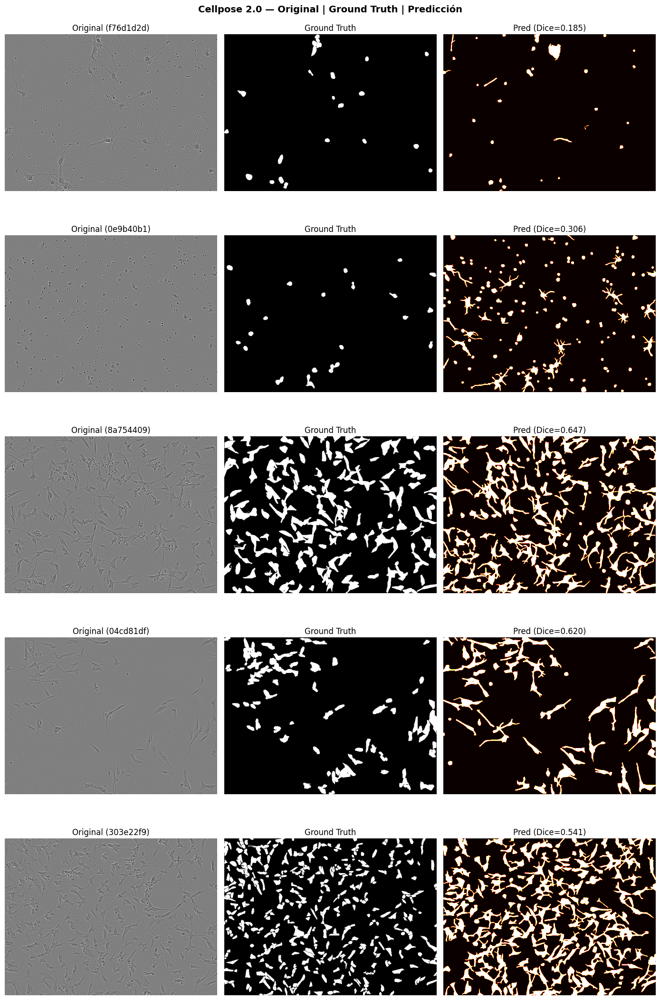

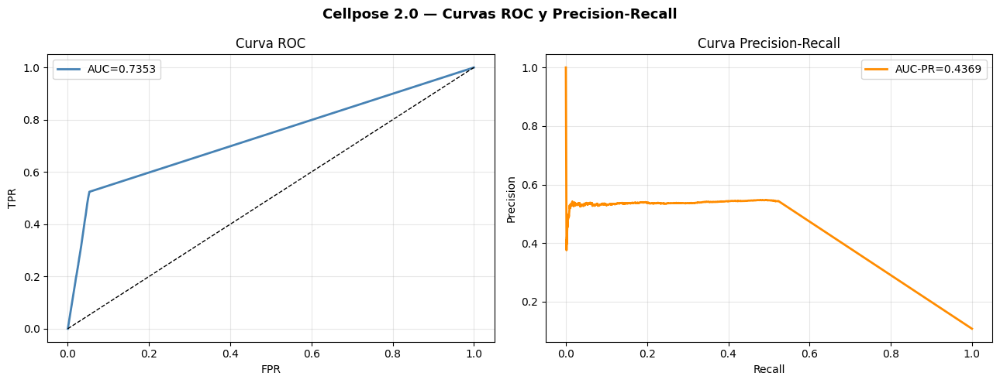

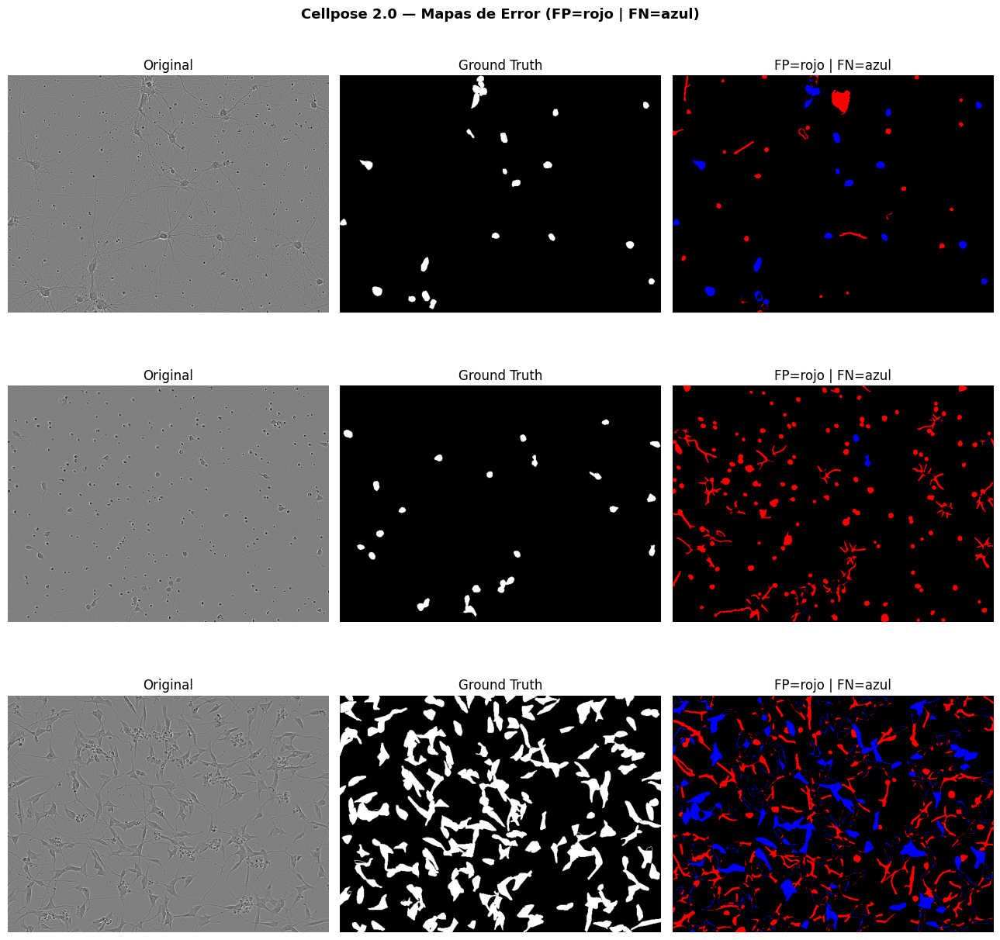

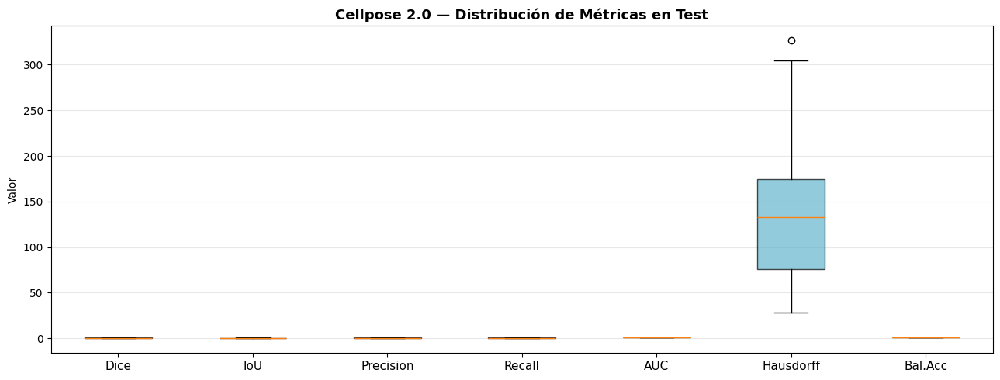

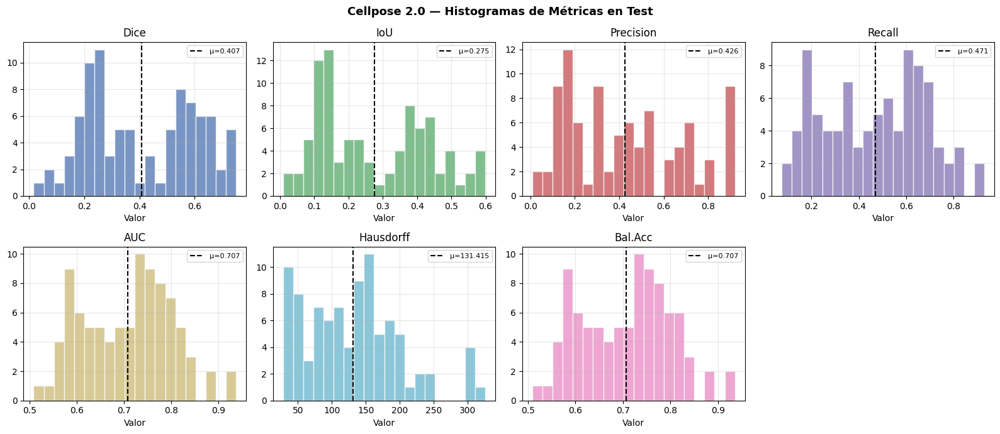


✅ Sección 2 — Cellpose 2.0 completa
   Diámetro mediano usado: 16px
   Mejor config: lr=0.01 | opt=adam | epochs=100 | bs=2
   Test Dice: 0.4067 ± 0.1947
   Test IoU:  0.2747 ± 0.1597


In [11]:
# ═══════════════════════════════════════════════════════════════════
# SECCIÓN 2 — Cellpose 2.0
# Hiperparámetros ajustados según enunciado:
#   learning_rate, batch_size, epochs, optimizer
# Sin resize — imágenes a tamaño original para preservar diámetro celular
# ═══════════════════════════════════════════════════════════════════
import os, time, gc, warnings
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.metrics import (roc_curve, precision_recall_curve, auc as sk_auc,
                              balanced_accuracy_score, roc_auc_score)
from scipy.spatial.distance import directed_hausdorff
import torch
from cellpose import models, train

warnings.filterwarnings('ignore')

# ───────────────────────────────────────────────────────────────────
# 2.1  CARGA DE DATOS SIN RESIZE
# ───────────────────────────────────────────────────────────────────
def load_for_cellpose_full(img_ids, df):
    """Carga imágenes y máscaras a tamaño ORIGINAL (sin resize)."""
    imgs, masks, diameters = [], [], []
    for img_id in img_ids:
        img = np.array(Image.open(
            os.path.join(TRAIN_DIR, img_id + '.png')).convert('RGB'))

        rows = df[df['id'] == img_id]
        h0, w0 = rows.iloc[0]['height'], rows.iloc[0]['width']
        mask = np.zeros((h0, w0), dtype=np.uint16)
        for i, (_, row) in enumerate(rows.iterrows(), start=1):
            m = rle_decode(row['annotation'], h0, w0)
            mask[m == 1] = i

        # Diámetro estimado por imagen
        n_cells = len(np.unique(mask)) - 1
        if n_cells > 0:
            avg_area = np.sum(mask > 0) / n_cells
            diam = max(5, int(np.sqrt(avg_area)))
        else:
            diam = 17  # fallback

        imgs.append(img)
        masks.append(mask)
        diameters.append(diam)
    return imgs, masks, diameters

print("Cargando datos para Cellpose (tamaño original)...")
t0_load = time.time()
train_imgs_cp, train_masks_cp, train_diams = load_for_cellpose_full(train_ids, df_raw)
val_imgs_cp,   val_masks_cp,   val_diams   = load_for_cellpose_full(val_ids,   df_raw)
test_imgs_cp,  test_masks_cp,  test_diams  = load_for_cellpose_full(test_ids,  df_raw)

# Diámetro mediano global para entrenamiento
MEDIAN_DIAM = int(np.median(train_diams))
print(f"Train: {len(train_imgs_cp)} | Val: {len(val_imgs_cp)} | Test: {len(test_imgs_cp)}")
print(f"Diámetro mediano: {MEDIAN_DIAM}px")
print(f"Tamaño imágenes: {train_imgs_cp[0].shape}")
print(f"Tiempo de carga: {time.time()-t0_load:.1f}s")

# ───────────────────────────────────────────────────────────────────
# 2.2  FUNCIONES DE EVALUACIÓN
# ───────────────────────────────────────────────────────────────────
def cellpose_dice(pred_mask, gt_mask, smooth=1e-6):
    pb = (pred_mask > 0).astype(np.float32)
    gb = (gt_mask   > 0).astype(np.float32)
    inter = (pb * gb).sum()
    return (2. * inter + smooth) / (pb.sum() + gb.sum() + smooth)

def predict_batch_cp(model, imgs, diameter):
    preds = []
    for img in imgs:
        p, _, _ = model.eval(
            img, diameter=diameter, channels=[0,0],
            flow_threshold=0.4, cellprob_threshold=0.0)
        preds.append(p)
    return preds

def eval_dice_only(model, imgs, masks, diameter):
    preds = predict_batch_cp(model, imgs, diameter)
    return np.mean([cellpose_dice(p, g) for p, g in zip(preds, masks)])

def compute_metrics_cp(pred_mask, gt_mask, smooth=1e-6):
    pb = (pred_mask > 0).astype(np.float32).flatten()
    gb = (gt_mask   > 0).astype(np.float32).flatten()
    pp = pred_mask.astype(np.float32).flatten()
    if pp.max() > 0:
        pp = pp / pp.max()

    inter = (pb * gb).sum()
    union = pb.sum() + gb.sum() - inter
    dice  = (2.*inter + smooth) / (pb.sum() + gb.sum() + smooth)
    iou   = (inter + smooth) / (union + smooth)
    prec  = (inter + smooth) / (pb.sum() + smooth)
    rec   = (inter + smooth) / (gb.sum() + smooth)
    try:
        auc_val = roc_auc_score(gb.astype(int), pp)
    except:
        auc_val = 0.0
    cp_p = np.argwhere(pb.reshape(pred_mask.shape) > 0)
    cp_t = np.argwhere(gb.reshape(gt_mask.shape) > 0)
    hd = (max(directed_hausdorff(cp_p, cp_t)[0],
              directed_hausdorff(cp_t, cp_p)[0])
          if len(cp_p) > 0 and len(cp_t) > 0 else 0.0)
    bal = balanced_accuracy_score(gb.astype(int), pb.astype(int))
    return {'dice': dice, 'iou': iou, 'precision': prec, 'recall': rec,
            'auc': auc_val, 'hausdorff': hd, 'bal_acc': bal}

# ───────────────────────────────────────────────────────────────────
# 2.3  GRID SEARCH — 4 hiperparámetros del enunciado
#      Fase 1: lr × optimizer  |  Fase 2: epochs × batch_size
# ───────────────────────────────────────────────────────────────────
HP_GRID = {
    'lr'        : [0.01, 0.005, 0.001],
    'batch_size': [2, 4],
    'n_epochs'  : [100, 200],
    'SGD'       : [False, True],
}

# Subset para grid search
N_GS = 50
step = max(1, len(train_imgs_cp) // N_GS)
gs_idx = list(range(0, len(train_imgs_cp), step))[:N_GS]
gs_tr_imgs = [train_imgs_cp[i] for i in gs_idx]
gs_tr_msk  = [train_masks_cp[i] for i in gs_idx]
gs_val_imgs = val_imgs_cp[:15]
gs_val_msk  = val_masks_cp[:15]

def run_one_config(lr_val, ep_val, use_sgd, bs_val, tag):
    _model = models.CellposeModel(gpu=True, model_type='cyto2')
    _path = train.train_seg(
        _model.net,
        train_data     = gs_tr_imgs,
        train_labels   = gs_tr_msk,
        channels       = [0, 0],
        normalize      = True,
        learning_rate  = lr_val,
        weight_decay   = 1e-5,
        n_epochs       = ep_val,
        batch_size     = bs_val,
        SGD            = use_sgd,
        nimg_per_epoch = len(gs_tr_imgs),
        min_train_masks= 3,
        model_name     = tag,
        save_path      = CKPT_DIR,
    )
    _eval = models.CellposeModel(gpu=True, pretrained_model=str(_path))
    dice = eval_dice_only(_eval, gs_val_imgs, gs_val_msk, MEDIAN_DIAM)
    del _model, _eval
    torch.cuda.empty_cache(); gc.collect()
    return dice, _path

print("\n" + "=" * 68)
print("  GRID SEARCH — CELLPOSE 2.0 (imágenes a tamaño original)")
print(f"  lr={HP_GRID['lr']}, bs={HP_GRID['batch_size']},")
print(f"  epochs={HP_GRID['n_epochs']}, optimizer=[Adam, SGD]")
print(f"  Diámetro mediano: {MEDIAN_DIAM}px")
print("=" * 68)

# ── Fase 1: lr × optimizer (epochs=100, bs=2) ──────────────────────
print("\n— Fase 1: learning_rate × optimizer —")
phase1_results = []
t0_p1 = time.time()
for lr_val in HP_GRID['lr']:
    for use_sgd in HP_GRID['SGD']:
        tag = f"cp3_p1_lr{lr_val}_sgd{use_sgd}"
        dice, path = run_one_config(lr_val, 100, use_sgd, 2, tag)
        opt = 'sgd' if use_sgd else 'adam'
        cfg = f"lr={lr_val} | opt={opt}"
        phase1_results.append({'lr': lr_val, 'SGD': use_sgd, 'dice': dice,
                               'config': cfg, 'path': path})
        print(f"  {cfg:25s} → Dice val: {dice:.4f}")

best_p1 = max(phase1_results, key=lambda x: x['dice'])
print(f"\n  ✅ Ganador Fase 1: {best_p1['config']}  (Dice {best_p1['dice']:.4f})")
print(f"  Tiempo Fase 1: {(time.time()-t0_p1)/60:.1f} min")

# ── Fase 2: epochs × batch_size ────────────────────────────────────
print("\n— Fase 2: epochs × batch_size —")
phase2_results = []
t0_p2 = time.time()
for ep_val in HP_GRID['n_epochs']:
    for bs_val in HP_GRID['batch_size']:
        tag = f"cp3_p2_ep{ep_val}_bs{bs_val}"
        dice, path = run_one_config(best_p1['lr'], ep_val, best_p1['SGD'], bs_val, tag)
        cfg = f"epochs={ep_val} | bs={bs_val}"
        phase2_results.append({
            'lr': best_p1['lr'], 'SGD': best_p1['SGD'],
            'n_epochs': ep_val, 'batch_size': bs_val,
            'dice': dice, 'config': cfg, 'path': path
        })
        print(f"  {cfg:25s} → Dice val: {dice:.4f}")

best_p2 = max(phase2_results, key=lambda x: x['dice'])
best_cp = {
    'lr'        : best_p1['lr'],
    'SGD'       : best_p1['SGD'],
    'n_epochs'  : best_p2['n_epochs'],
    'batch_size': best_p2['batch_size'],
    'dice'      : best_p2['dice'],
    'config'    : f"lr={best_p1['lr']} | opt={'sgd' if best_p1['SGD'] else 'adam'} | "
                  f"epochs={best_p2['n_epochs']} | bs={best_p2['batch_size']}",
}
print(f"  Tiempo Fase 2: {(time.time()-t0_p2)/60:.1f} min")

print("\n" + "=" * 68)
print(f"  ✅ MEJOR CONFIG: {best_cp['config']}")
print(f"     Dice val: {best_cp['dice']:.4f}")
print("=" * 68)

# ───────────────────────────────────────────────────────────────────
# 2.4  ENTRENAMIENTO COMPLETO
# ───────────────────────────────────────────────────────────────────
print(f"\nEntrenando Cellpose completo ({len(train_imgs_cp)} imágenes)...")
t0_train = time.time()

model_cp_final = models.CellposeModel(gpu=True, model_type='cyto2')

final_model_path = train.train_seg(
    model_cp_final.net,
    train_data     = train_imgs_cp,
    train_labels   = train_masks_cp,
    channels       = [0, 0],
    normalize      = True,
    learning_rate  = best_cp['lr'],
    weight_decay   = 1e-5,
    n_epochs       = best_cp['n_epochs'],
    batch_size     = best_cp['batch_size'],
    SGD            = best_cp['SGD'],
    nimg_per_epoch = len(train_imgs_cp),
    min_train_masks= 3,
    model_name     = 'cellpose_final_v3',
    save_path      = CKPT_DIR,
)

del model_cp_final
torch.cuda.empty_cache(); gc.collect()

model_cp_eval = models.CellposeModel(gpu=True, pretrained_model=str(final_model_path))
print(f"✅ Entrenamiento completo en {(time.time()-t0_train)/60:.1f} min")

# ───────────────────────────────────────────────────────────────────
# 2.5  EVALUACIÓN EN TEST — 7 MÉTRICAS
# ───────────────────────────────────────────────────────────────────
print("\nEvaluando en test set...")
t0_eval = time.time()

test_preds = predict_batch_cp(model_cp_eval, test_imgs_cp, MEDIAN_DIAM)

test_metrics_cp = {k: [] for k in ['dice','iou','precision','recall','auc','hausdorff','bal_acc']}
test_samples_cp = []

for i, (img, gt, pred) in enumerate(zip(test_imgs_cp, test_masks_cp, test_preds)):
    m = compute_metrics_cp(pred, gt)
    for k, v in m.items():
        test_metrics_cp[k].append(v)
    if len(test_samples_cp) < 5:
        test_samples_cp.append({
            'img': img, 'mask': gt, 'pred': pred, 'id': test_ids[i]})

test_mean_cp = {k: np.mean(v) for k, v in test_metrics_cp.items()}
test_std_cp  = {k: np.std(v)  for k, v in test_metrics_cp.items()}

print(f"Evaluación completa en {(time.time()-t0_eval)/60:.1f} min")
print("\n" + "=" * 65)
print("  MÉTRICAS EN TEST — CELLPOSE 2.0")
print("=" * 65)
for k in test_mean_cp:
    print(f"  {k:15s}: {test_mean_cp[k]:.4f} ± {test_std_cp[k]:.4f}")

results['cellpose'] = {
    'metrics_mean' : test_mean_cp,
    'metrics_std'  : test_std_cp,
    'metrics_all'  : test_metrics_cp,
    'best_hp'      : best_cp,
    'grid_phase1'  : phase1_results,
    'grid_phase2'  : phase2_results,
}

# ───────────────────────────────────────────────────────────────────
# 2.6  VISUALIZACIONES OBLIGATORIAS
# ───────────────────────────────────────────────────────────────────

# ── A) Original / Ground Truth / Predicción ────────────────────────
fig, axes = plt.subplots(5, 3, figsize=(14, 22))
fig.suptitle("Cellpose 2.0 — Original | Ground Truth | Predicción",
             fontsize=14, fontweight='bold')
for i, s in enumerate(test_samples_cp):
    axes[i,0].imshow(s['img']); axes[i,0].set_title(f"Original ({s['id'][:8]})"); axes[i,0].axis('off')
    axes[i,1].imshow(s['mask'] > 0, cmap='gray'); axes[i,1].set_title("Ground Truth"); axes[i,1].axis('off')
    axes[i,2].imshow(s['pred'] > 0, cmap='hot')
    axes[i,2].set_title(f"Pred (Dice={cellpose_dice(s['pred'], s['mask']):.3f})")
    axes[i,2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'cellpose_visual_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── B) Curvas ROC y Precision-Recall ──────────────────────────────
all_p, all_g = [], []
for pred, gt in zip(test_preds, test_masks_cp):
    p = pred.astype(np.float32).flatten()
    if p.max() > 0: p = p / p.max()
    all_p.extend(p.tolist())
    all_g.extend((gt > 0).astype(int).flatten().tolist())

all_p, all_g = np.array(all_p), np.array(all_g)
fpr, tpr, _ = roc_curve(all_g, all_p)
prec, rec, _ = precision_recall_curve(all_g, all_p)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle("Cellpose 2.0 — Curvas ROC y Precision-Recall", fontsize=13, fontweight='bold')
axes[0].plot(fpr, tpr, color='steelblue', lw=2, label=f'AUC={sk_auc(fpr, tpr):.4f}')
axes[0].plot([0,1],[0,1],'k--', lw=1); axes[0].set_xlabel('FPR'); axes[0].set_ylabel('TPR')
axes[0].set_title('Curva ROC'); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].plot(rec, prec, color='darkorange', lw=2, label=f'AUC-PR={sk_auc(rec, prec):.4f}')
axes[1].set_xlabel('Recall'); axes[1].set_ylabel('Precision')
axes[1].set_title('Curva Precision-Recall'); axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'cellpose_roc_pr.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── C) Mapas de error (FP=rojo, FN=azul) ──────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(13, 13))
fig.suptitle("Cellpose 2.0 — Mapas de Error (FP=rojo | FN=azul)",
             fontsize=13, fontweight='bold')
for i, s in enumerate(test_samples_cp[:3]):
    pb = (s['pred'] > 0).astype(np.uint8)
    gb = (s['mask'] > 0).astype(np.uint8)
    err = np.zeros((*pb.shape, 3), dtype=np.uint8)
    err[(pb==1)&(gb==0)] = [255,0,0]
    err[(pb==0)&(gb==1)] = [0,0,255]
    axes[i,0].imshow(s['img']); axes[i,0].set_title("Original"); axes[i,0].axis('off')
    axes[i,1].imshow(gb, cmap='gray'); axes[i,1].set_title("Ground Truth"); axes[i,1].axis('off')
    axes[i,2].imshow(err); axes[i,2].set_title("FP=rojo | FN=azul"); axes[i,2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'cellpose_error_maps.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── D) Boxplots ────────────────────────────────────────────────────
metric_names = ['dice','iou','precision','recall','auc','hausdorff','bal_acc']
labels       = ['Dice','IoU','Precision','Recall','AUC','Hausdorff','Bal.Acc']
colors       = ['#4C72B0','#55A868','#C44E52','#8172B2','#CCB974','#64B5CD','#E78AC3']

fig, ax = plt.subplots(figsize=(13, 5))
bp = ax.boxplot([test_metrics_cp[k] for k in metric_names], patch_artist=True)
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color); patch.set_alpha(0.7)
ax.set_xticklabels(labels, fontsize=11)
ax.set_title("Cellpose 2.0 — Distribución de Métricas en Test", fontsize=13, fontweight='bold')
ax.set_ylabel("Valor"); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'cellpose_boxplots.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── E) Histogramas ─────────────────────────────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(16, 7))
fig.suptitle("Cellpose 2.0 — Histogramas de Métricas en Test", fontsize=13, fontweight='bold')
axes = axes.flatten()
for i, (k, label) in enumerate(zip(metric_names, labels)):
    axes[i].hist(test_metrics_cp[k], bins=20, color=colors[i], alpha=0.75, edgecolor='white')
    axes[i].axvline(np.mean(test_metrics_cp[k]), color='black', linestyle='--', lw=1.5,
                    label=f'μ={np.mean(test_metrics_cp[k]):.3f}')
    axes[i].set_title(label); axes[i].set_xlabel("Valor"); axes[i].legend(fontsize=8); axes[i].grid(alpha=0.3)
axes[-1].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'cellpose_histogramas.png'), dpi=150, bbox_inches='tight')
plt.show()

del model_cp_eval
torch.cuda.empty_cache(); gc.collect()

print("\n✅ Sección 2 — Cellpose 2.0 completa")
print(f"   Diámetro mediano usado: {MEDIAN_DIAM}px")
print(f"   Mejor config: {best_cp['config']}")
print(f"   Test Dice: {test_mean_cp['dice']:.4f} ± {test_std_cp['dice']:.4f}")
print(f"   Test IoU:  {test_mean_cp['iou']:.4f} ± {test_std_cp['iou']:.4f}")

In [12]:
# Diagnóstico SAM/MedSAM
import subprocess, sys

# Verificar instalaciones
pkgs = ['segment_anything', 'MedSAM', 'mobile_sam']
for pkg in pkgs:
    try:
        mod = __import__(pkg)
        print(f"✅ {pkg} instalado")
        if hasattr(mod, '__version__'):
            print(f"   versión: {mod.__version__}")
    except ImportError:
        print(f"❌ {pkg} NO instalado")

# Verificar VRAM disponible
import torch
print(f"\nVRAM allocated: {torch.cuda.memory_allocated()/1e9:.2f} GB")
print(f"VRAM reserved:  {torch.cuda.memory_reserved()/1e9:.2f} GB")

# Verificar si hay checkpoints de SAM descargados
import os
ckpt_dir = r'C:\Users\migue\Downloads\sartorius_checkpoints'
sam_files = [f for f in os.listdir(ckpt_dir) if 'sam' in f.lower() or 'medsam' in f.lower() or 'vit' in f.lower()]
print(f"\nCheckpoints SAM en {ckpt_dir}:")
if sam_files:
    for f in sam_files:
        size_mb = os.path.getsize(os.path.join(ckpt_dir, f)) / 1e6
        print(f"  {f} ({size_mb:.0f} MB)")
else:
    print("  Ninguno encontrado")

✅ segment_anything instalado
❌ MedSAM NO instalado
❌ mobile_sam NO instalado

VRAM allocated: 0.02 GB
VRAM reserved:  0.04 GB

Checkpoints SAM en C:\Users\migue\Downloads\sartorius_checkpoints:
  Ninguno encontrado


In [13]:
import urllib.request, os

ckpt_url  = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth"
ckpt_path = os.path.join(CKPT_DIR, "sam_vit_b_01ec64.pth")

if not os.path.exists(ckpt_path):
    print("Descargando SAM vit_b (~375MB)...")
    urllib.request.urlretrieve(ckpt_url, ckpt_path)
    size_mb = os.path.getsize(ckpt_path) / 1e6
    print(f"✅ Descargado: {ckpt_path} ({size_mb:.0f} MB)")
else:
    print(f"✅ Checkpoint ya existe: {ckpt_path}")

Descargando SAM vit_b (~375MB)...
✅ Descargado: C:\Users\migue\Downloads\sartorius_checkpoints\sam_vit_b_01ec64.pth (375 MB)


In [14]:
from segment_anything import sam_model_registry, SamPredictor, SamAutomaticMaskGenerator
import inspect

print("Modelos disponibles:", list(sam_model_registry.keys()))
print("\nSamPredictor methods:")
print([m for m in dir(SamPredictor) if not m.startswith('_')])
print("\nSamAutomaticMaskGenerator signature:")
print(inspect.signature(SamAutomaticMaskGenerator.__init__))

Modelos disponibles: ['default', 'vit_h', 'vit_l', 'vit_b']

SamPredictor methods:
['device', 'get_image_embedding', 'predict', 'predict_torch', 'reset_image', 'set_image', 'set_torch_image']

SamAutomaticMaskGenerator signature:
(self, model: segment_anything.modeling.sam.Sam, points_per_side: Optional[int] = 32, points_per_batch: int = 64, pred_iou_thresh: float = 0.88, stability_score_thresh: float = 0.95, stability_score_offset: float = 1.0, box_nms_thresh: float = 0.7, crop_n_layers: int = 0, crop_nms_thresh: float = 0.7, crop_overlap_ratio: float = 0.3413333333333333, crop_n_points_downscale_factor: int = 1, point_grids: Optional[List[numpy.ndarray]] = None, min_mask_region_area: int = 0, output_mode: str = 'binary_mask') -> None


In [15]:
from segment_anything import sam_model_registry
import torch

sam = sam_model_registry['vit_b'](checkpoint=os.path.join(CKPT_DIR, 'sam_vit_b_01ec64.pth'))

# Ver componentes
print("=== COMPONENTES DE SAM ===\n")
for name, module in sam.named_children():
    params = sum(p.numel() for p in module.parameters())
    trainable = sum(p.numel() for p in module.parameters() if p.requires_grad)
    print(f"  {name:25s} → {params:>12,} params")

# Congelar encoder, dejar decoder y prompt encoder entrenables
for param in sam.image_encoder.parameters():
    param.requires_grad = False

trainable = sum(p.numel() for p in sam.parameters() if p.requires_grad)
total = sum(p.numel() for p in sam.parameters())
print(f"\nDespués de congelar encoder:")
print(f"  Total:      {total:,}")
print(f"  Trainable:  {trainable:,}")
print(f"  Frozen:     {total - trainable:,}")

# VRAM estimada
print(f"\nVRAM actual: {torch.cuda.memory_allocated()/1e9:.2f} GB")

del sam
torch.cuda.empty_cache()

=== COMPONENTES DE SAM ===

  image_encoder             →   89,670,912 params
  prompt_encoder            →        6,220 params
  mask_decoder              →    4,058,340 params

Después de congelar encoder:
  Total:      93,735,472
  Trainable:  4,064,560
  Frozen:     89,670,912

VRAM actual: 0.02 GB


Creando datasets para SAM fine-tuning...
Train: 424 | Val: 91 | Test: 91

  GRID SEARCH — SAM (Fine-tuning Mask Decoder)
  lr=[0.001, 0.0001, 1e-05], bs=[1, 2],
  epochs=[10, 20, 30], optimizer=['adam', 'sgd']
  Decoder params: 4,064,560 trainable

— Fase 1: learning_rate × optimizer —
  lr=0.001 | opt=adam       → Dice val: 0.0900
  lr=0.001 | opt=sgd        → Dice val: 0.1044
  lr=0.0001 | opt=adam      → Dice val: 0.0880
  lr=0.0001 | opt=sgd       → Dice val: 0.0979
  lr=1e-05 | opt=adam       → Dice val: 0.1060
  lr=1e-05 | opt=sgd        → Dice val: 0.0931

  ✅ Ganador Fase 1: lr=1e-05 | opt=adam  (Dice 0.1060)
  Tiempo Fase 1: 42.3 min

— Fase 2: epochs × batch_size —
  epochs=10 | bs=1          → Dice val: 0.0896
  epochs=10 | bs=2          → Dice val: 0.0660
  epochs=20 | bs=1          → Dice val: 0.1047
  epochs=20 | bs=2          → Dice val: 0.1121
  epochs=30 | bs=1          → Dice val: 0.1069
  epochs=30 | bs=2          → Dice val: 0.0832
  Tiempo Fase 2: 67.0 min

  ✅ MEJ

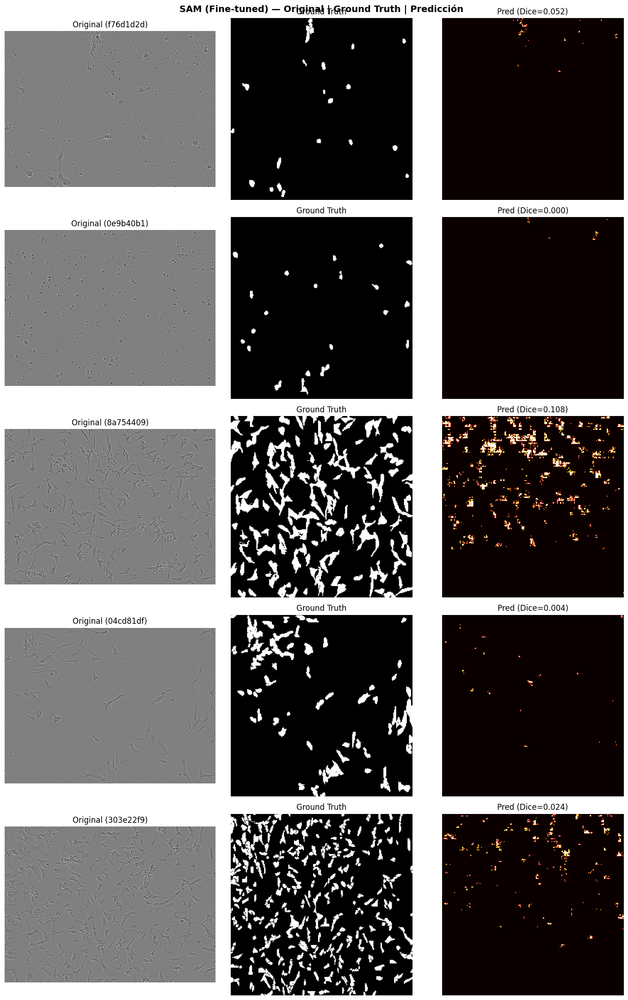

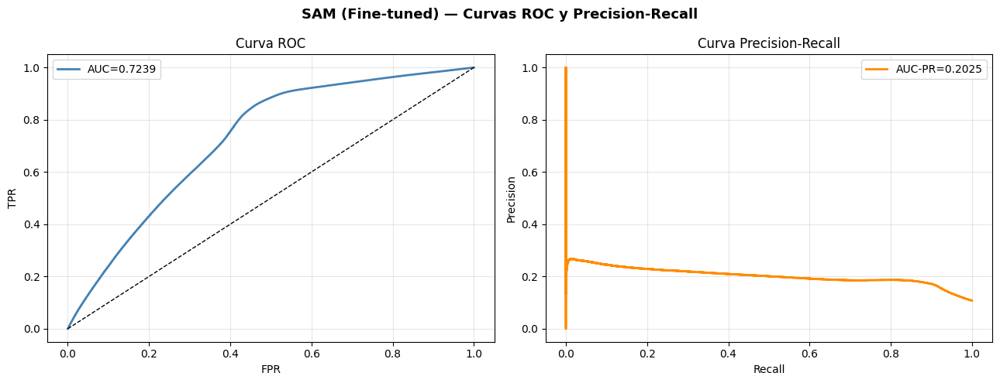

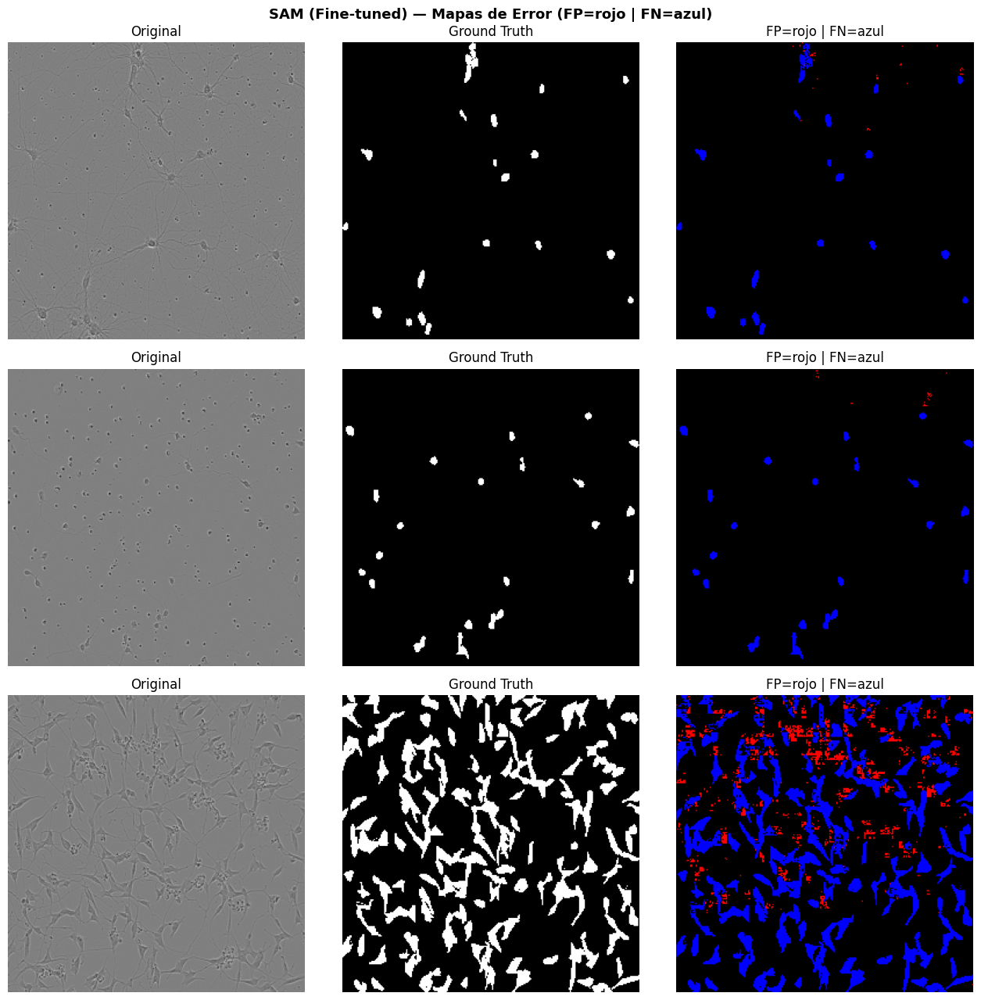

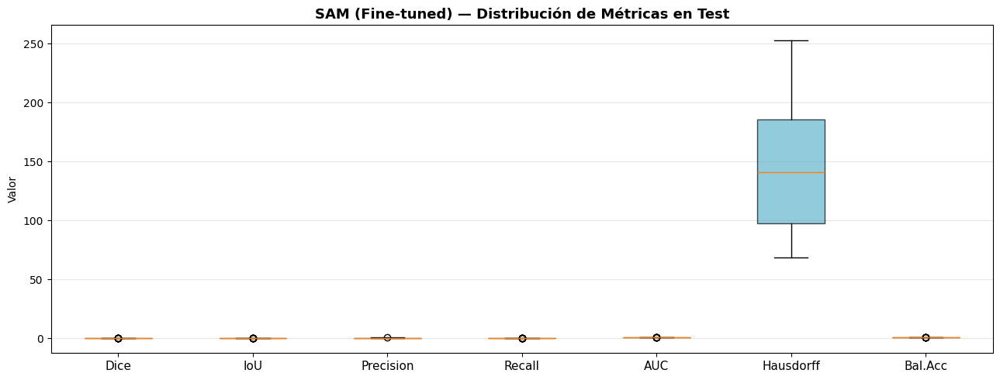

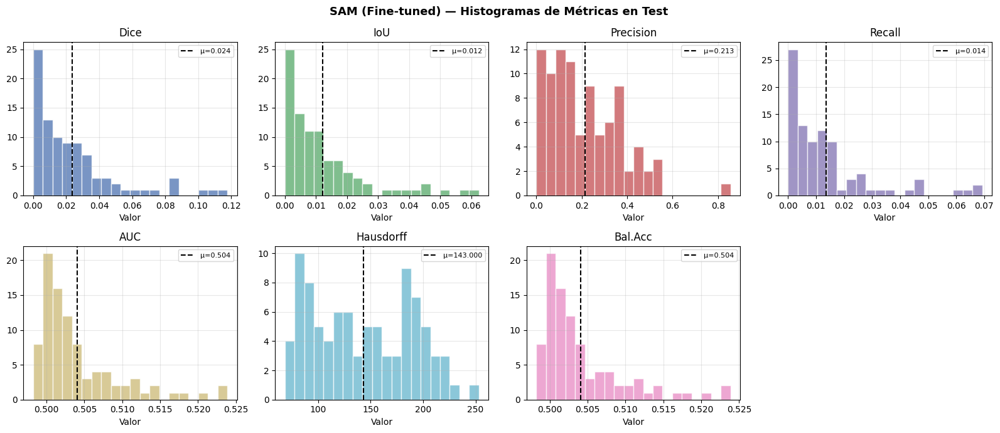

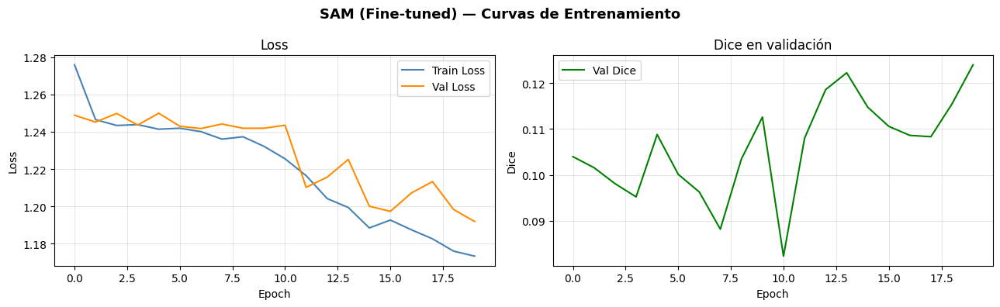


✅ Sección 3 — SAM (Fine-tuned) completa
   Mejor config: lr=1e-05 | opt=adam | epochs=20 | bs=2
   Test Dice: 0.0236 ± 0.0255
   Test IoU:  0.0121 ± 0.0134


In [3]:
# ═══════════════════════════════════════════════════════════════════
# SECCIÓN 3 — SAM (Fine-tuning del Mask Decoder)
# Encoder congelado (89.7M params) | Decoder entrenable (4.06M params)
# Hiperparámetros: learning_rate, batch_size, epochs, optimizer
# ═══════════════════════════════════════════════════════════════════
import os, time, gc, warnings
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.metrics import (roc_curve, precision_recall_curve, auc as sk_auc,
                              balanced_accuracy_score, roc_auc_score)
from scipy.spatial.distance import directed_hausdorff
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from segment_anything import sam_model_registry
from segment_anything.utils.transforms import ResizeLongestSide

warnings.filterwarnings('ignore')

# ───────────────────────────────────────────────────────────────────
# 3.1  DATASET PARA FINE-TUNING DE SAM
# ───────────────────────────────────────────────────────────────────
class SAMFineTuneDataset(Dataset):
    """Dataset que preprocesa imágenes al formato esperado por SAM."""
    def __init__(self, img_ids, df, train_dir, img_size=1024):
        self.img_ids = img_ids
        self.df = df
        self.train_dir = train_dir
        self.transform = ResizeLongestSide(img_size)
        self.img_size = img_size

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]

        # Imagen
        img = np.array(Image.open(
            os.path.join(self.train_dir, img_id + '.png')).convert('RGB'))
        original_size = img.shape[:2]

        # Máscara binaria
        rows = self.df[self.df['id'] == img_id]
        h0, w0 = rows.iloc[0]['height'], rows.iloc[0]['width']
        mask = np.zeros((h0, w0), dtype=np.float32)
        for _, row in rows.iterrows():
            m = rle_decode(row['annotation'], h0, w0)
            mask[m == 1] = 1.0

        # Transformar imagen al formato SAM (resize + pad a 1024x1024)
        img_transformed = self.transform.apply_image(img)
        img_tensor = torch.as_tensor(img_transformed).permute(2, 0, 1).float()

        # Pad a 1024x1024
        h, w = img_tensor.shape[-2:]
        padh = self.img_size - h
        padw = self.img_size - w
        img_tensor = F.pad(img_tensor, (0, padw, 0, padh))

        # Resize máscara a 256x256 (SAM output size)
        mask_resized = np.array(Image.fromarray(mask).resize(
            (256, 256), resample=Image.NEAREST))
        mask_tensor = torch.as_tensor(mask_resized).float().unsqueeze(0)

        return img_tensor, mask_tensor, torch.tensor(original_size), img_id

# ───────────────────────────────────────────────────────────────────
# 3.2  FUNCIONES DE ENTRENAMIENTO Y EVALUACIÓN
# ───────────────────────────────────────────────────────────────────
def train_epoch_sam(sam_model, dataloader, optimizer, device):
    sam_model.mask_decoder.train()
    sam_model.prompt_encoder.train()
    total_loss = 0.0
    n_batches = 0

    for imgs, masks, sizes, _ in dataloader:
        imgs  = imgs.to(device)
        masks = masks.to(device)

        # Forward: encoder (frozen) → embeddings
        with torch.no_grad():
            image_embeddings = sam_model.image_encoder(imgs)

        # Prompt: sin prompts explícitos (dense prediction)
        sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
            points=None, boxes=None, masks=None)

        # Decoder
        low_res_masks, iou_predictions = sam_model.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=sam_model.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False,
        )

        # Loss: Dice + BCE
        pred = torch.sigmoid(low_res_masks)
        # Dice loss
        smooth = 1e-6
        inter = (pred * masks).sum(dim=(-2,-1))
        dice_loss = 1 - (2.*inter + smooth) / (pred.sum(dim=(-2,-1)) + masks.sum(dim=(-2,-1)) + smooth)
        # BCE loss
        bce_loss = F.binary_cross_entropy_with_logits(low_res_masks, masks)
        loss = dice_loss.mean() + bce_loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        n_batches += 1

    return total_loss / max(n_batches, 1)

def val_epoch_sam(sam_model, dataloader, device):
    sam_model.eval()
    total_loss = 0.0
    dice_scores = []
    n_batches = 0

    with torch.no_grad():
        for imgs, masks, sizes, _ in dataloader:
            imgs  = imgs.to(device)
            masks = masks.to(device)

            image_embeddings = sam_model.image_encoder(imgs)
            sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                points=None, boxes=None, masks=None)

            low_res_masks, _ = sam_model.mask_decoder(
                image_embeddings=image_embeddings,
                image_pe=sam_model.prompt_encoder.get_dense_pe(),
                sparse_prompt_embeddings=sparse_embeddings,
                dense_prompt_embeddings=dense_embeddings,
                multimask_output=False,
            )

            pred = torch.sigmoid(low_res_masks)
            # Dice
            smooth = 1e-6
            inter = (pred * masks).sum(dim=(-2,-1))
            dice = (2.*inter + smooth) / (pred.sum(dim=(-2,-1)) + masks.sum(dim=(-2,-1)) + smooth)
            dice_val = dice.squeeze()
            if dice_val.dim() == 0:
                dice_scores.append(dice_val.item())
            else:
                dice_scores.extend(dice_val.cpu().tolist())
            # Loss
            bce = F.binary_cross_entropy_with_logits(low_res_masks, masks)
            d_loss = (1 - dice).mean()
            total_loss += (d_loss + bce).item()
            n_batches += 1

    avg_dice = np.mean(dice_scores)
    avg_loss = total_loss / max(n_batches, 1)
    return avg_loss, avg_dice

def compute_metrics_sam(pred_mask, gt_mask, smooth=1e-6):
    pb = (pred_mask > 0).astype(np.float32).flatten()
    gb = (gt_mask   > 0).astype(np.float32).flatten()
    pp = pred_mask.astype(np.float32).flatten()
    if pp.max() > 0:
        pp = pp / pp.max()

    inter = (pb * gb).sum()
    union = pb.sum() + gb.sum() - inter
    dice  = (2.*inter + smooth) / (pb.sum() + gb.sum() + smooth)
    iou   = (inter + smooth) / (union + smooth)
    prec  = (inter + smooth) / (pb.sum() + smooth)
    rec   = (inter + smooth) / (gb.sum() + smooth)
    try:
        auc_val = roc_auc_score(gb.astype(int), pp)
    except:
        auc_val = 0.0
    cp_p = np.argwhere(pb.reshape(pred_mask.shape) > 0)
    cp_t = np.argwhere(gb.reshape(gt_mask.shape) > 0)
    hd = (max(directed_hausdorff(cp_p, cp_t)[0],
              directed_hausdorff(cp_t, cp_p)[0])
          if len(cp_p) > 0 and len(cp_t) > 0 else 0.0)
    bal = balanced_accuracy_score(gb.astype(int), pb.astype(int))
    return {'dice': dice, 'iou': iou, 'precision': prec, 'recall': rec,
            'auc': auc_val, 'hausdorff': hd, 'bal_acc': bal}

# ───────────────────────────────────────────────────────────────────
# 3.3  CREAR DATALOADERS
# ───────────────────────────────────────────────────────────────────
print("Creando datasets para SAM fine-tuning...")
ds_train_sam = SAMFineTuneDataset(train_ids, df_raw, TRAIN_DIR)
ds_val_sam   = SAMFineTuneDataset(val_ids,   df_raw, TRAIN_DIR)
ds_test_sam  = SAMFineTuneDataset(test_ids,  df_raw, TRAIN_DIR)

dl_val_sam  = DataLoader(ds_val_sam,  batch_size=2, shuffle=False, num_workers=0, pin_memory=True)
dl_test_sam = DataLoader(ds_test_sam, batch_size=2, shuffle=False, num_workers=0, pin_memory=True)

print(f"Train: {len(ds_train_sam)} | Val: {len(ds_val_sam)} | Test: {len(ds_test_sam)}")

# ───────────────────────────────────────────────────────────────────
# 3.4  GRID SEARCH — 4 hiperparámetros del enunciado
#      Fase 1: lr × optimizer  |  Fase 2: epochs × batch_size
# ───────────────────────────────────────────────────────────────────
HP_GRID_SAM = {
    'lr'        : [1e-3, 1e-4, 1e-5],
    'batch_size': [1, 2],
    'n_epochs'  : [10, 20, 30],
    'optimizer' : ['adam', 'sgd'],
}

SAM_CKPT = os.path.join(CKPT_DIR, 'sam_vit_b_01ec64.pth')

# Subset para grid search
N_GS_SAM = 60
gs_train_ids_sam = train_ids[:N_GS_SAM]
ds_gs_sam = SAMFineTuneDataset(gs_train_ids_sam, df_raw, TRAIN_DIR)

def run_sam_config(lr_val, ep_val, opt_name, bs_val):
    """Entrena una config de SAM y retorna Dice en val."""
    # Modelo fresco
    _sam = sam_model_registry['vit_b'](checkpoint=SAM_CKPT).to(DEVICE)
    for p in _sam.image_encoder.parameters():
        p.requires_grad = False

    # Optimizer
    train_params = list(_sam.mask_decoder.parameters()) + list(_sam.prompt_encoder.parameters())
    if opt_name == 'adam':
        _opt = torch.optim.Adam(train_params, lr=lr_val, weight_decay=1e-4)
    else:
        _opt = torch.optim.SGD(train_params, lr=lr_val, momentum=0.9, weight_decay=1e-4)

    _dl = DataLoader(ds_gs_sam, batch_size=bs_val, shuffle=True, num_workers=0, pin_memory=True)

    # Entrenar
    for ep in range(ep_val):
        _sam.mask_decoder.train()
        _sam.prompt_encoder.train()
        for imgs, masks, sizes, _ in _dl:
            imgs  = imgs.to(DEVICE)
            masks = masks.to(DEVICE)
            with torch.no_grad():
                emb = _sam.image_encoder(imgs)
            sparse, dense = _sam.prompt_encoder(points=None, boxes=None, masks=None)
            low_res, _ = _sam.mask_decoder(
                image_embeddings=emb,
                image_pe=_sam.prompt_encoder.get_dense_pe(),
                sparse_prompt_embeddings=sparse,
                dense_prompt_embeddings=dense,
                multimask_output=False)
            pred = torch.sigmoid(low_res)
            smooth = 1e-6
            inter = (pred * masks).sum(dim=(-2,-1))
            dice_loss = 1 - (2.*inter + smooth)/(pred.sum(dim=(-2,-1)) + masks.sum(dim=(-2,-1)) + smooth)
            bce = F.binary_cross_entropy_with_logits(low_res, masks)
            loss = dice_loss.mean() + bce
            _opt.zero_grad()
            loss.backward()
            _opt.step()

    # Evaluar en val
    _, dice = val_epoch_sam(_sam, dl_val_sam, DEVICE)
    del _sam, _opt
    torch.cuda.empty_cache(); gc.collect()
    return dice

print("\n" + "=" * 68)
print("  GRID SEARCH — SAM (Fine-tuning Mask Decoder)")
print(f"  lr={HP_GRID_SAM['lr']}, bs={HP_GRID_SAM['batch_size']},")
print(f"  epochs={HP_GRID_SAM['n_epochs']}, optimizer={HP_GRID_SAM['optimizer']}")
print(f"  Decoder params: 4,064,560 trainable")
print("=" * 68)

# ── Fase 1: lr × optimizer (epochs=10, bs=2) ───────────────────────
print("\n— Fase 1: learning_rate × optimizer —")
phase1_sam = []
t0_p1 = time.time()
for lr_val in HP_GRID_SAM['lr']:
    for opt_name in HP_GRID_SAM['optimizer']:
        dice = run_sam_config(lr_val, 10, opt_name, 2)
        cfg = f"lr={lr_val} | opt={opt_name}"
        phase1_sam.append({'lr': lr_val, 'optimizer': opt_name,
                          'dice': dice, 'config': cfg})
        print(f"  {cfg:25s} → Dice val: {dice:.4f}")

best_p1_sam = max(phase1_sam, key=lambda x: x['dice'])
print(f"\n  ✅ Ganador Fase 1: {best_p1_sam['config']}  (Dice {best_p1_sam['dice']:.4f})")
print(f"  Tiempo Fase 1: {(time.time()-t0_p1)/60:.1f} min")

# ── Fase 2: epochs × batch_size ────────────────────────────────────
print("\n— Fase 2: epochs × batch_size —")
phase2_sam = []
t0_p2 = time.time()
for ep_val in HP_GRID_SAM['n_epochs']:
    for bs_val in HP_GRID_SAM['batch_size']:
        dice = run_sam_config(best_p1_sam['lr'], ep_val, best_p1_sam['optimizer'], bs_val)
        cfg = f"epochs={ep_val} | bs={bs_val}"
        phase2_sam.append({
            'lr': best_p1_sam['lr'], 'optimizer': best_p1_sam['optimizer'],
            'n_epochs': ep_val, 'batch_size': bs_val,
            'dice': dice, 'config': cfg
        })
        print(f"  {cfg:25s} → Dice val: {dice:.4f}")

best_p2_sam = max(phase2_sam, key=lambda x: x['dice'])
best_sam = {
    'lr'        : best_p1_sam['lr'],
    'optimizer' : best_p1_sam['optimizer'],
    'n_epochs'  : best_p2_sam['n_epochs'],
    'batch_size': best_p2_sam['batch_size'],
    'dice'      : best_p2_sam['dice'],
    'config'    : f"lr={best_p1_sam['lr']} | opt={best_p1_sam['optimizer']} | "
                  f"epochs={best_p2_sam['n_epochs']} | bs={best_p2_sam['batch_size']}",
}
print(f"  Tiempo Fase 2: {(time.time()-t0_p2)/60:.1f} min")

print("\n" + "=" * 68)
print(f"  ✅ MEJOR CONFIG: {best_sam['config']}")
print(f"     Dice val: {best_sam['dice']:.4f}")
print("=" * 68)

# ───────────────────────────────────────────────────────────────────
# 3.5  ENTRENAMIENTO COMPLETO CON MEJORES HIPERPARÁMETROS
# ───────────────────────────────────────────────────────────────────
print(f"\nEntrenando SAM completo ({len(ds_train_sam)} imágenes)...")
t0_train = time.time()

sam_final = sam_model_registry['vit_b'](checkpoint=SAM_CKPT).to(DEVICE)
for p in sam_final.image_encoder.parameters():
    p.requires_grad = False

train_params = list(sam_final.mask_decoder.parameters()) + list(sam_final.prompt_encoder.parameters())
if best_sam['optimizer'] == 'adam':
    optimizer_sam = torch.optim.Adam(train_params, lr=best_sam['lr'], weight_decay=1e-4)
else:
    optimizer_sam = torch.optim.SGD(train_params, lr=best_sam['lr'], momentum=0.9, weight_decay=1e-4)

scheduler_sam = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_sam, mode='min', patience=5, factor=0.5)

dl_train_sam = DataLoader(ds_train_sam, batch_size=best_sam['batch_size'],
                          shuffle=True, num_workers=0, pin_memory=True)

train_losses_sam, val_losses_sam, val_dice_sam = [], [], []
best_dice_sam = 0.0

for epoch in range(best_sam['n_epochs']):
    t0 = time.time()
    train_loss = train_epoch_sam(sam_final, dl_train_sam, optimizer_sam, DEVICE)
    val_loss, val_dice = val_epoch_sam(sam_final, dl_val_sam, DEVICE)
    scheduler_sam.step(val_loss)

    train_losses_sam.append(train_loss)
    val_losses_sam.append(val_loss)
    val_dice_sam.append(val_dice)

    if val_dice > best_dice_sam:
        best_dice_sam = val_dice
        torch.save({
            'mask_decoder': sam_final.mask_decoder.state_dict(),
            'prompt_encoder': sam_final.prompt_encoder.state_dict(),
        }, os.path.join(CKPT_DIR, 'sam_finetuned_best.pth'))

    print(f"Epoch {epoch+1:02d}/{best_sam['n_epochs']} | "
          f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | "
          f"Dice: {val_dice:.4f} | Time: {time.time()-t0:.1f}s")

# Cargar mejor checkpoint
ckpt = torch.load(os.path.join(CKPT_DIR, 'sam_finetuned_best.pth'), map_location=DEVICE)
sam_final.mask_decoder.load_state_dict(ckpt['mask_decoder'])
sam_final.prompt_encoder.load_state_dict(ckpt['prompt_encoder'])
print(f"\n✅ Entrenamiento SAM completo en {(time.time()-t0_train)/60:.1f} min")
print(f"Mejor Dice val: {best_dice_sam:.4f}")

# ───────────────────────────────────────────────────────────────────
# 3.6  EVALUACIÓN EN TEST — 7 MÉTRICAS
# ───────────────────────────────────────────────────────────────────
print("\nEvaluando en test set...")
t0_eval = time.time()

sam_final.eval()
test_metrics_sam = {k: [] for k in ['dice','iou','precision','recall','auc','hausdorff','bal_acc']}
test_samples_sam = []

with torch.no_grad():
    for imgs, masks_gt, sizes, ids in dl_test_sam:
        imgs = imgs.to(DEVICE)
        emb = sam_final.image_encoder(imgs)
        sparse, dense = sam_final.prompt_encoder(points=None, boxes=None, masks=None)
        low_res, _ = sam_final.mask_decoder(
            image_embeddings=emb,
            image_pe=sam_final.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse,
            dense_prompt_embeddings=dense,
            multimask_output=False)

        preds = torch.sigmoid(low_res).cpu().numpy()
        masks_np = masks_gt.numpy()

        for j in range(preds.shape[0]):
            pred_bin = (preds[j, 0] > 0.5).astype(np.float32)
            gt_bin   = masks_np[j, 0]
            m = compute_metrics_sam(pred_bin, gt_bin)
            for k, v in m.items():
                test_metrics_sam[k].append(v)
            if len(test_samples_sam) < 5:
                # Cargar imagen original para visualización
                orig_img = np.array(Image.open(
                    os.path.join(TRAIN_DIR, ids[j] + '.png')).convert('RGB'))
                test_samples_sam.append({
                    'img': orig_img, 'mask': gt_bin,
                    'pred': pred_bin, 'id': ids[j]})

test_mean_sam = {k: np.mean(v) for k, v in test_metrics_sam.items()}
test_std_sam  = {k: np.std(v)  for k, v in test_metrics_sam.items()}

print(f"Evaluación completa en {(time.time()-t0_eval)/60:.1f} min")
print("\n" + "=" * 65)
print("  MÉTRICAS EN TEST — SAM (Fine-tuned)")
print("=" * 65)
for k in test_mean_sam:
    print(f"  {k:15s}: {test_mean_sam[k]:.4f} ± {test_std_sam[k]:.4f}")

results['sam'] = {
    'metrics_mean' : test_mean_sam,
    'metrics_std'  : test_std_sam,
    'metrics_all'  : test_metrics_sam,
    'best_hp'      : best_sam,
    'grid_phase1'  : phase1_sam,
    'grid_phase2'  : phase2_sam,
    'train_losses' : train_losses_sam,
    'val_losses'   : val_losses_sam,
}

# ───────────────────────────────────────────────────────────────────
# 3.7  VISUALIZACIONES OBLIGATORIAS
# ───────────────────────────────────────────────────────────────────

# ── A) Original / Ground Truth / Predicción ────────────────────────
fig, axes = plt.subplots(5, 3, figsize=(14, 22))
fig.suptitle("SAM (Fine-tuned) — Original | Ground Truth | Predicción",
             fontsize=14, fontweight='bold')
for i, s in enumerate(test_samples_sam):
    axes[i,0].imshow(s['img']); axes[i,0].set_title(f"Original ({s['id'][:8]})"); axes[i,0].axis('off')
    axes[i,1].imshow(s['mask'], cmap='gray'); axes[i,1].set_title("Ground Truth"); axes[i,1].axis('off')
    axes[i,2].imshow(s['pred'], cmap='hot')
    d = compute_metrics_sam(s['pred'], s['mask'])['dice']
    axes[i,2].set_title(f"Pred (Dice={d:.3f})")
    axes[i,2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'sam_visual_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── B) Curvas ROC y Precision-Recall ──────────────────────────────
all_p, all_g = [], []
sam_final.eval()
with torch.no_grad():
    for imgs, masks_gt, _, _ in dl_test_sam:
        imgs = imgs.to(DEVICE)
        emb = sam_final.image_encoder(imgs)
        sparse, dense = sam_final.prompt_encoder(points=None, boxes=None, masks=None)
        low_res, _ = sam_final.mask_decoder(
            image_embeddings=emb,
            image_pe=sam_final.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse,
            dense_prompt_embeddings=dense,
            multimask_output=False)
        probs = torch.sigmoid(low_res).cpu().numpy()
        for j in range(probs.shape[0]):
            all_p.extend(probs[j, 0].flatten().tolist())
            all_g.extend(masks_gt[j, 0].numpy().flatten().astype(int).tolist())

all_p, all_g = np.array(all_p), np.array(all_g)
fpr, tpr, _ = roc_curve(all_g, all_p)
prec_c, rec_c, _ = precision_recall_curve(all_g, all_p)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle("SAM (Fine-tuned) — Curvas ROC y Precision-Recall", fontsize=13, fontweight='bold')
axes[0].plot(fpr, tpr, color='steelblue', lw=2, label=f'AUC={sk_auc(fpr, tpr):.4f}')
axes[0].plot([0,1],[0,1],'k--', lw=1); axes[0].set_xlabel('FPR'); axes[0].set_ylabel('TPR')
axes[0].set_title('Curva ROC'); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].plot(rec_c, prec_c, color='darkorange', lw=2, label=f'AUC-PR={sk_auc(rec_c, prec_c):.4f}')
axes[1].set_xlabel('Recall'); axes[1].set_ylabel('Precision')
axes[1].set_title('Curva Precision-Recall'); axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'sam_roc_pr.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── C) Mapas de error ─────────────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(13, 13))
fig.suptitle("SAM (Fine-tuned) — Mapas de Error (FP=rojo | FN=azul)",
             fontsize=13, fontweight='bold')
for i, s in enumerate(test_samples_sam[:3]):
    pb = (s['pred'] > 0.5).astype(np.uint8)
    gb = (s['mask'] > 0.5).astype(np.uint8)
    err = np.zeros((*pb.shape, 3), dtype=np.uint8)
    err[(pb==1)&(gb==0)] = [255,0,0]
    err[(pb==0)&(gb==1)] = [0,0,255]
    # Resize imagen para que coincida con máscara 256x256
    img_resized = np.array(Image.fromarray(s['img']).resize((256, 256)))
    axes[i,0].imshow(img_resized); axes[i,0].set_title("Original"); axes[i,0].axis('off')
    axes[i,1].imshow(gb, cmap='gray'); axes[i,1].set_title("Ground Truth"); axes[i,1].axis('off')
    axes[i,2].imshow(err); axes[i,2].set_title("FP=rojo | FN=azul"); axes[i,2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'sam_error_maps.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── D) Boxplots ────────────────────────────────────────────────────
metric_names = ['dice','iou','precision','recall','auc','hausdorff','bal_acc']
labels       = ['Dice','IoU','Precision','Recall','AUC','Hausdorff','Bal.Acc']
colors       = ['#4C72B0','#55A868','#C44E52','#8172B2','#CCB974','#64B5CD','#E78AC3']

fig, ax = plt.subplots(figsize=(13, 5))
bp = ax.boxplot([test_metrics_sam[k] for k in metric_names], patch_artist=True)
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color); patch.set_alpha(0.7)
ax.set_xticklabels(labels, fontsize=11)
ax.set_title("SAM (Fine-tuned) — Distribución de Métricas en Test", fontsize=13, fontweight='bold')
ax.set_ylabel("Valor"); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'sam_boxplots.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── E) Histogramas ─────────────────────────────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(16, 7))
fig.suptitle("SAM (Fine-tuned) — Histogramas de Métricas en Test", fontsize=13, fontweight='bold')
axes = axes.flatten()
for i, (k, label) in enumerate(zip(metric_names, labels)):
    axes[i].hist(test_metrics_sam[k], bins=20, color=colors[i], alpha=0.75, edgecolor='white')
    axes[i].axvline(np.mean(test_metrics_sam[k]), color='black', linestyle='--', lw=1.5,
                    label=f'μ={np.mean(test_metrics_sam[k]):.3f}')
    axes[i].set_title(label); axes[i].set_xlabel("Valor"); axes[i].legend(fontsize=8); axes[i].grid(alpha=0.3)
axes[-1].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'sam_histogramas.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── F) Curvas de entrenamiento ─────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(13, 4))
fig.suptitle("SAM (Fine-tuned) — Curvas de Entrenamiento", fontsize=13, fontweight='bold')
axes[0].plot(train_losses_sam, label='Train Loss', color='steelblue')
axes[0].plot(val_losses_sam,   label='Val Loss',   color='darkorange')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].set_title('Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].plot(val_dice_sam, label='Val Dice', color='green')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Dice')
axes[1].set_title('Dice en validación'); axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'sam_training_curves.png'), dpi=150, bbox_inches='tight')
plt.show()

# Liberar VRAM
del sam_final, optimizer_sam
torch.cuda.empty_cache(); gc.collect()

print("\n✅ Sección 3 — SAM (Fine-tuned) completa")
print(f"   Mejor config: {best_sam['config']}")
print(f"   Test Dice: {test_mean_sam['dice']:.4f} ± {test_std_sam['dice']:.4f}")
print(f"   Test IoU:  {test_mean_sam['iou']:.4f} ± {test_std_sam['iou']:.4f}")

In [4]:
# ═══════════════════════════════════════════════════════════════════
# SECCIÓN 4 — HoverNet (desde cero, sin checkpoint preentrenado)
# Branches: NP (Nuclear Pixel) + HV (Horizontal-Vertical maps)
# Hiperparámetros: learning_rate, batch_size, epochs, optimizer
# ═══════════════════════════════════════════════════════════════════
import os, time, gc, warnings
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.metrics import (roc_auc_score, balanced_accuracy_score,
                              roc_curve, precision_recall_curve, auc as sk_auc)
from scipy.spatial.distance import directed_hausdorff
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

warnings.filterwarnings('ignore')

# ── Bloques base ────────────────────────────────────────────────────
class ConvBnRelu(nn.Module):
    def __init__(self, in_ch, out_ch, k=3, p=1):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, k, padding=p, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, k, padding=p, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )
    def forward(self, x): return self.block(x)

class DenseBlock(nn.Module):
    """Bloque denso simplificado para el decoder de HoverNet."""
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True))
        self.skip = nn.Conv2d(in_ch, out_ch, 1, bias=False) if in_ch != out_ch else nn.Identity()
    def forward(self, x):
        return self.conv2(self.conv1(x)) + self.skip(x)

# ── Encoder (ResNet-like desde cero) ────────────────────────────────
class HoverNetEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.enc1 = ConvBnRelu(3,   64)   # 256x256 → 256x256
        self.enc2 = ConvBnRelu(64,  128)  # 128x128
        self.enc3 = ConvBnRelu(128, 256)  # 64x64
        self.enc4 = ConvBnRelu(256, 512)  # 32x32
        self.pool = nn.MaxPool2d(2, 2)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        return e1, e2, e3, e4

# ── Decoder branch compartido ───────────────────────────────────────
class HoverNetDecoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.db3 = DenseBlock(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.db2 = DenseBlock(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64,  2, stride=2)
        self.db1 = DenseBlock(128, 64)

    def forward(self, e1, e2, e3, e4):
        d3 = self.db3(torch.cat([self.up3(e4), e3], dim=1))
        d2 = self.db2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.db1(torch.cat([self.up1(d2), e1], dim=1))
        return d1  # (B, 64, H, W)

# ── HoverNet completo ────────────────────────────────────────────────
class HoverNet(nn.Module):
    """
    Branch NP: segmentación binaria núcleo/fondo.
    Branch HV: mapas horizontal y vertical (regression).
    """
    def __init__(self):
        super().__init__()
        self.encoder  = HoverNetEncoder()
        self.decoder  = HoverNetDecoder()
        # Branch NP (Nuclear Pixel)
        self.np_head  = nn.Sequential(
            DenseBlock(64, 32),
            nn.Conv2d(32, 2, 1))   # 2 clases: fondo / núcleo
        # Branch HV (regresión continua)
        self.hv_head  = nn.Sequential(
            DenseBlock(64, 32),
            nn.Conv2d(32, 2, 1))   # 2 canales: H y V

    def forward(self, x):
        e1, e2, e3, e4 = self.encoder(x)
        feat = self.decoder(e1, e2, e3, e4)
        np_out = self.np_head(feat)  # logits 2 clases
        hv_out = self.hv_head(feat)  # H, V continuos
        return np_out, hv_out

In [5]:
# ───────────────────────────────────────────────────────────────────
# 4.2  DATASET
# ───────────────────────────────────────────────────────────────────
class HoverNetDataset(Dataset):
    """Produce imagen RGB + máscara binaria + HV maps sintéticos."""
    def __init__(self, img_ids, df, train_dir, img_size=256, augment=False):
        self.img_ids   = img_ids
        self.df        = df
        self.train_dir = train_dir
        self.img_size  = img_size
        self.augment   = augment

    def __len__(self): return len(self.img_ids)

    def _make_hv(self, mask):
        """Genera HV maps a partir de la máscara binaria."""
        h, w = mask.shape
        yy = np.linspace(-1, 1, h)[:, None] * mask
        xx = np.linspace(-1, 1, w)[None, :] * mask
        return np.stack([yy, xx], axis=0).astype(np.float32)  # (2, H, W)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        img = np.array(Image.open(
            os.path.join(self.train_dir, img_id + '.png')
        ).convert('RGB').resize((self.img_size, self.img_size)))

        rows = self.df[self.df['id'] == img_id]
        h0, w0 = rows.iloc[0]['height'], rows.iloc[0]['width']
        mask = np.zeros((h0, w0), dtype=np.float32)
        for _, row in rows.iterrows():
            m = rle_decode(row['annotation'], h0, w0)
            mask[m == 1] = 1.0
        mask = np.array(Image.fromarray(mask).resize(
            (self.img_size, self.img_size), resample=Image.NEAREST))

        # Augmentation
        if self.augment and np.random.rand() > 0.5:
            img  = img[:, ::-1].copy()
            mask = mask[:, ::-1].copy()
        if self.augment and np.random.rand() > 0.5:
            img  = img[::-1].copy()
            mask = mask[::-1].copy()

        img_t  = torch.from_numpy(img.transpose(2,0,1)).float() / 255.0
        mask_t = torch.from_numpy(mask).long()          # para NP branch (CE)
        hv_t   = torch.from_numpy(self._make_hv(mask))  # (2, H, W) float
        return img_t, mask_t, hv_t

print("Creando datasets para HoverNet...")
ds_train_hv = HoverNetDataset(train_ids, df_raw, TRAIN_DIR, augment=True)
ds_val_hv   = HoverNetDataset(val_ids,   df_raw, TRAIN_DIR)
ds_test_hv  = HoverNetDataset(test_ids,  df_raw, TRAIN_DIR)
print(f"Train: {len(ds_train_hv)} | Val: {len(ds_val_hv)} | Test: {len(ds_test_hv)}")

Creando datasets para HoverNet...
Train: 424 | Val: 91 | Test: 91


In [6]:
# ───────────────────────────────────────────────────────────────────
# 4.3  LOSS + TRAIN / VAL EPOCH
# ───────────────────────────────────────────────────────────────────
def mse_loss_hv(pred_hv, gt_hv, np_mask):
    """MSE solo dentro de los núcleos (donde np_mask == 1)."""
    focus = (np_mask == 1).unsqueeze(1).float()
    return F.mse_loss(pred_hv * focus, gt_hv * focus)

def hovernet_loss(np_out, hv_out, np_gt, hv_gt, w_hv=1.0):
    loss_np = F.cross_entropy(np_out, np_gt)
    loss_hv = mse_loss_hv(hv_out, hv_gt, np_gt)
    return loss_np + w_hv * loss_hv

def dice_from_logits(np_out, np_gt, smooth=1e-6):
    pred = torch.argmax(nn.functional.softmax(np_out, dim=1), dim=1).float()
    gt   = np_gt.float()
    inter = (pred * gt).sum()
    return (2.*inter + smooth) / (pred.sum() + gt.sum() + smooth)

def train_epoch_hv(model, dl, optimizer, device):
    model.train()
    total_loss = 0.0
    for imgs, masks, hv in dl:
        imgs, masks, hv = imgs.to(device), masks.to(device), hv.to(device)
        np_out, hv_out = model(imgs)
        loss = hovernet_loss(np_out, hv_out, masks, hv)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(dl)

def val_epoch_hv(model, dl, device):
    model.eval()
    total_loss, dice_scores = 0.0, []
    with torch.no_grad():
        for imgs, masks, hv in dl:
            imgs, masks, hv = imgs.to(device), masks.to(device), hv.to(device)
            np_out, hv_out = model(imgs)
            loss = hovernet_loss(np_out, hv_out, masks, hv)
            total_loss += loss.item()
            d = dice_from_logits(np_out, masks)
            dice_scores.append(d.item())
    return total_loss / len(dl), np.mean(dice_scores)

def compute_metrics_hv(pred_bin, gt_bin, smooth=1e-6):
    pb = pred_bin.flatten().astype(np.float32)
    gb = gt_bin.flatten().astype(np.float32)
    inter = (pb * gb).sum()
    dice  = (2.*inter + smooth) / (pb.sum() + gb.sum() + smooth)
    iou   = (inter + smooth) / (pb.sum() + gb.sum() - inter + smooth)
    prec  = (inter + smooth) / (pb.sum() + smooth)
    rec   = (inter + smooth) / (gb.sum() + smooth)
    try:    auc_val = roc_auc_score(gb.astype(int), pb)
    except: auc_val = 0.0
    cp_p = np.argwhere(pred_bin > 0)
    cp_t = np.argwhere(gt_bin   > 0)
    hd = (max(directed_hausdorff(cp_p, cp_t)[0],
              directed_hausdorff(cp_t, cp_p)[0])
          if len(cp_p) > 0 and len(cp_t) > 0 else 0.0)
    bal = balanced_accuracy_score(gb.astype(int), pb.astype(int))
    return {'dice': dice, 'iou': iou, 'precision': prec,
            'recall': rec, 'auc': auc_val, 'hausdorff': hd, 'bal_acc': bal}

In [7]:
# ───────────────────────────────────────────────────────────────────
# 4.4  GRID SEARCH — 4 hiperparámetros del enunciado
#      Fase 1: lr × optimizer  |  Fase 2: epochs × batch_size
# ───────────────────────────────────────────────────────────────────
HP_GRID_HV = {
    'lr'        : [1e-3, 1e-4, 1e-5],
    'batch_size': [4, 8],
    'n_epochs'  : [10, 20, 30],
    'optimizer' : ['adam', 'sgd'],
}

N_GS_HV = 80
gs_train_ids_hv = train_ids[:N_GS_HV]
ds_gs_hv = HoverNetDataset(gs_train_ids_hv, df_raw, TRAIN_DIR, augment=False)

def run_hv_config(lr_val, ep_val, opt_name, bs_val):
    _model = HoverNet().to(DEVICE)
    _dl    = DataLoader(ds_gs_hv, batch_size=bs_val,
                        shuffle=True, num_workers=0, pin_memory=True)
    _dl_v  = DataLoader(ds_val_hv, batch_size=bs_val,
                        shuffle=False, num_workers=0, pin_memory=True)
    if opt_name == 'adam':
        _opt = torch.optim.Adam(_model.parameters(), lr=lr_val, weight_decay=1e-4)
    else:
        _opt = torch.optim.SGD(_model.parameters(), lr=lr_val,
                               momentum=0.9, weight_decay=1e-4)
    for _ in range(ep_val):
        train_epoch_hv(_model, _dl, _opt, DEVICE)
    _, dice = val_epoch_hv(_model, _dl_v, DEVICE)
    del _model, _opt
    torch.cuda.empty_cache(); gc.collect()
    return dice

print("\n" + "="*68)
print("  GRID SEARCH — HoverNet (desde cero)")
print(f"  lr={HP_GRID_HV['lr']}, bs={HP_GRID_HV['batch_size']},")
print(f"  epochs={HP_GRID_HV['n_epochs']}, optimizer={HP_GRID_HV['optimizer']}")
print("="*68)

# ── Fase 1: lr × optimizer (epochs=10, bs=8) ───────────────────────
print("\n— Fase 1: learning_rate × optimizer —")
phase1_hv, t0 = [], time.time()
for lr_val in HP_GRID_HV['lr']:
    for opt_name in HP_GRID_HV['optimizer']:
        dice = run_hv_config(lr_val, 10, opt_name, 8)
        cfg  = f"lr={lr_val} | opt={opt_name}"
        phase1_hv.append({'lr': lr_val, 'optimizer': opt_name,
                           'dice': dice, 'config': cfg})
        print(f"  {cfg:28s} → Dice val: {dice:.4f}")

best_p1_hv = max(phase1_hv, key=lambda x: x['dice'])
print(f"\n  ✅ Ganador Fase 1: {best_p1_hv['config']}  (Dice {best_p1_hv['dice']:.4f})")
print(f"  Tiempo Fase 1: {(time.time()-t0)/60:.1f} min")

# ── Fase 2: epochs × batch_size ────────────────────────────────────
print("\n— Fase 2: epochs × batch_size —")
phase2_hv, t0 = [], time.time()
for ep_val in HP_GRID_HV['n_epochs']:
    for bs_val in HP_GRID_HV['batch_size']:
        dice = run_hv_config(best_p1_hv['lr'], ep_val,
                             best_p1_hv['optimizer'], bs_val)
        cfg  = f"epochs={ep_val} | bs={bs_val}"
        phase2_hv.append({
            'lr': best_p1_hv['lr'], 'optimizer': best_p1_hv['optimizer'],
            'n_epochs': ep_val, 'batch_size': bs_val,
            'dice': dice, 'config': cfg
        })
        print(f"  {cfg:25s} → Dice val: {dice:.4f}")

best_p2_hv = max(phase2_hv, key=lambda x: x['dice'])
best_hv = {
    'lr'        : best_p1_hv['lr'],
    'optimizer' : best_p1_hv['optimizer'],
    'n_epochs'  : best_p2_hv['n_epochs'],
    'batch_size': best_p2_hv['batch_size'],
    'config'    : (f"lr={best_p1_hv['lr']} | opt={best_p1_hv['optimizer']} | "
                   f"epochs={best_p2_hv['n_epochs']} | bs={best_p2_hv['batch_size']}")
}
print(f"  Tiempo Fase 2: {(time.time()-t0)/60:.1f} min")
print("\n" + "="*68)
print(f"  ✅ MEJOR CONFIG: {best_hv['config']}")
print("="*68)


  GRID SEARCH — HoverNet (desde cero)
  lr=[0.001, 0.0001, 1e-05], bs=[4, 8],
  epochs=[10, 20, 30], optimizer=['adam', 'sgd']

— Fase 1: learning_rate × optimizer —
  lr=0.001 | opt=adam          → Dice val: 0.2303
  lr=0.001 | opt=sgd           → Dice val: 0.2493
  lr=0.0001 | opt=adam         → Dice val: 0.6482
  lr=0.0001 | opt=sgd          → Dice val: 0.2167
  lr=1e-05 | opt=adam          → Dice val: 0.3199
  lr=1e-05 | opt=sgd           → Dice val: 0.1801

  ✅ Ganador Fase 1: lr=0.0001 | opt=adam  (Dice 0.6482)
  Tiempo Fase 1: 7.8 min

— Fase 2: epochs × batch_size —
  epochs=10 | bs=4          → Dice val: 0.6795
  epochs=10 | bs=8          → Dice val: 0.5358
  epochs=20 | bs=4          → Dice val: 0.7003
  epochs=20 | bs=8          → Dice val: 0.6950
  epochs=30 | bs=4          → Dice val: 0.6066
  epochs=30 | bs=8          → Dice val: 0.7011
  Tiempo Fase 2: 14.6 min

  ✅ MEJOR CONFIG: lr=0.0001 | opt=adam | epochs=30 | bs=8


In [8]:
# ───────────────────────────────────────────────────────────────────
# 4.5  ENTRENAMIENTO COMPLETO
# ───────────────────────────────────────────────────────────────────
print(f"\nEntrenando HoverNet completo ({len(ds_train_hv)} imágenes)...")
t0_train = time.time()

model_hv = HoverNet().to(DEVICE)
dl_train_hv = DataLoader(ds_train_hv, batch_size=best_hv['batch_size'],
                          shuffle=True, num_workers=0, pin_memory=True)
dl_val_hv_  = DataLoader(ds_val_hv, batch_size=best_hv['batch_size'],
                          shuffle=False, num_workers=0, pin_memory=True)
dl_test_hv_ = DataLoader(ds_test_hv, batch_size=best_hv['batch_size'],
                          shuffle=False, num_workers=0, pin_memory=True)

if best_hv['optimizer'] == 'adam':
    opt_hv = torch.optim.Adam(model_hv.parameters(),
                               lr=best_hv['lr'], weight_decay=1e-4)
else:
    opt_hv = torch.optim.SGD(model_hv.parameters(), lr=best_hv['lr'],
                               momentum=0.9, weight_decay=1e-4)

sched_hv = torch.optim.lr_scheduler.ReduceLROnPlateau(
    opt_hv, mode='max', patience=5, factor=0.5)

train_losses_hv, val_losses_hv, val_dice_hv = [], [], []
best_dice_hv = 0.0

for epoch in range(best_hv['n_epochs']):
    t0e = time.time()
    tr_loss = train_epoch_hv(model_hv, dl_train_hv, opt_hv, DEVICE)
    vl_loss, vl_dice = val_epoch_hv(model_hv, dl_val_hv_, DEVICE)
    sched_hv.step(vl_dice)

    train_losses_hv.append(tr_loss)
    val_losses_hv.append(vl_loss)
    val_dice_hv.append(vl_dice)

    if vl_dice > best_dice_hv:
        best_dice_hv = vl_dice
        torch.save(model_hv.state_dict(),
                   os.path.join(CKPT_DIR, 'hovernet_best.pth'))

    print(f"Epoch {epoch+1:02d}/{best_hv['n_epochs']} | "
          f"Train Loss: {tr_loss:.4f} | Val Loss: {vl_loss:.4f} | "
          f"Dice: {vl_dice:.4f} | Time: {time.time()-t0e:.1f}s")

model_hv.load_state_dict(torch.load(
    os.path.join(CKPT_DIR, 'hovernet_best.pth'), map_location=DEVICE))
print(f"\n✅ Entrenamiento completo en {(time.time()-t0_train)/60:.1f} min")
print(f"Mejor Dice val: {best_dice_hv:.4f}")

# ───────────────────────────────────────────────────────────────────
# 4.6  EVALUACIÓN EN TEST — 7 MÉTRICAS
# ───────────────────────────────────────────────────────────────────
print("\nEvaluando en test set...")
model_hv.eval()
test_metrics_hv = {k: [] for k in ['dice','iou','precision','recall',
                                     'auc','hausdorff','bal_acc']}
test_samples_hv = []

with torch.no_grad():
    for imgs, masks_gt, hv_gt in dl_test_hv_:
        imgs = imgs.to(DEVICE)
        np_out, _ = model_hv(imgs)
        probs = F.softmax(np_out, dim=1)[:, 1].cpu().numpy()
        preds_bin = (probs > 0.5).astype(np.float32)
        masks_np  = masks_gt.numpy()

        for j in range(preds_bin.shape[0]):
            pred_b = preds_bin[j]
            gt_b   = masks_np[j].astype(np.float32)
            m = compute_metrics_hv(pred_b, gt_b)
            for k, v in m.items():
                test_metrics_hv[k].append(v)
            if len(test_samples_hv) < 5:
                orig = np.array(Image.open(
                    os.path.join(TRAIN_DIR,
                    ds_test_hv.img_ids[len(test_samples_hv)] + '.png')
                ).convert('RGB'))
                test_samples_hv.append(
                    {'img': orig, 'mask': gt_b, 'pred': pred_b,
                     'prob': probs[j]})

test_mean_hv = {k: np.mean(v) for k, v in test_metrics_hv.items()}
test_std_hv  = {k: np.std(v)  for k, v in test_metrics_hv.items()}

print("\n" + "="*65)
print("  MÉTRICAS EN TEST — HoverNet")
print("="*65)
for k in test_mean_hv:
    print(f"  {k:15s}: {test_mean_hv[k]:.4f} ± {test_std_hv[k]:.4f}")

results['hovernet'] = {
    'metrics_mean': test_mean_hv, 'metrics_std': test_std_hv,
    'metrics_all' : test_metrics_hv, 'best_hp': best_hv,
    'grid_phase1' : phase1_hv,      'grid_phase2': phase2_hv,
    'train_losses': train_losses_hv, 'val_losses': val_losses_hv,
}


Entrenando HoverNet completo (424 imágenes)...
Epoch 01/30 | Train Loss: 0.4530 | Val Loss: 0.3277 | Dice: 0.1242 | Time: 42.5s
Epoch 02/30 | Train Loss: 0.2068 | Val Loss: 0.2238 | Dice: 0.4995 | Time: 42.1s
Epoch 03/30 | Train Loss: 0.1922 | Val Loss: 0.2310 | Dice: 0.6584 | Time: 46.8s
Epoch 04/30 | Train Loss: 0.1931 | Val Loss: 0.3056 | Dice: 0.5905 | Time: 47.4s
Epoch 05/30 | Train Loss: 0.1779 | Val Loss: 0.1719 | Dice: 0.7014 | Time: 42.6s
Epoch 06/30 | Train Loss: 0.1703 | Val Loss: 0.1770 | Dice: 0.7047 | Time: 42.7s
Epoch 07/30 | Train Loss: 0.1661 | Val Loss: 0.1640 | Dice: 0.6814 | Time: 42.4s
Epoch 08/30 | Train Loss: 0.1602 | Val Loss: 0.1683 | Dice: 0.6748 | Time: 42.0s
Epoch 09/30 | Train Loss: 0.1582 | Val Loss: 0.1586 | Dice: 0.7108 | Time: 42.2s
Epoch 10/30 | Train Loss: 0.1553 | Val Loss: 0.1781 | Dice: 0.7025 | Time: 42.1s
Epoch 11/30 | Train Loss: 0.1572 | Val Loss: 0.1545 | Dice: 0.6901 | Time: 42.5s
Epoch 12/30 | Train Loss: 0.1530 | Val Loss: 0.1504 | Dice: 0

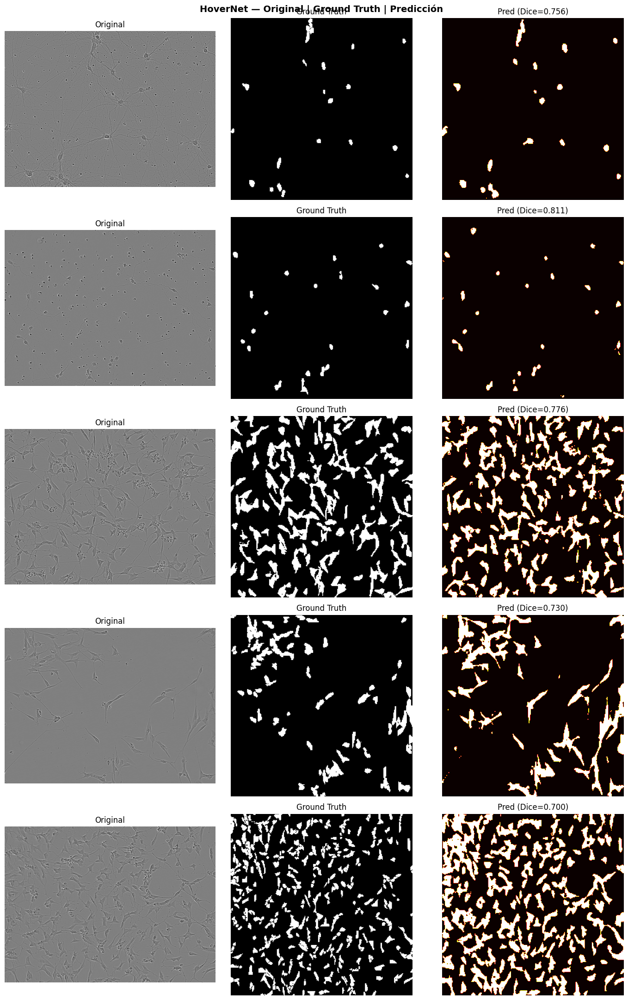

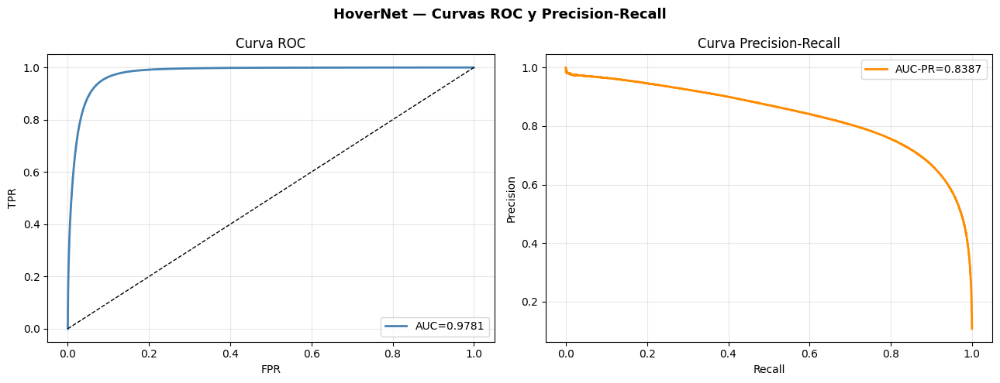

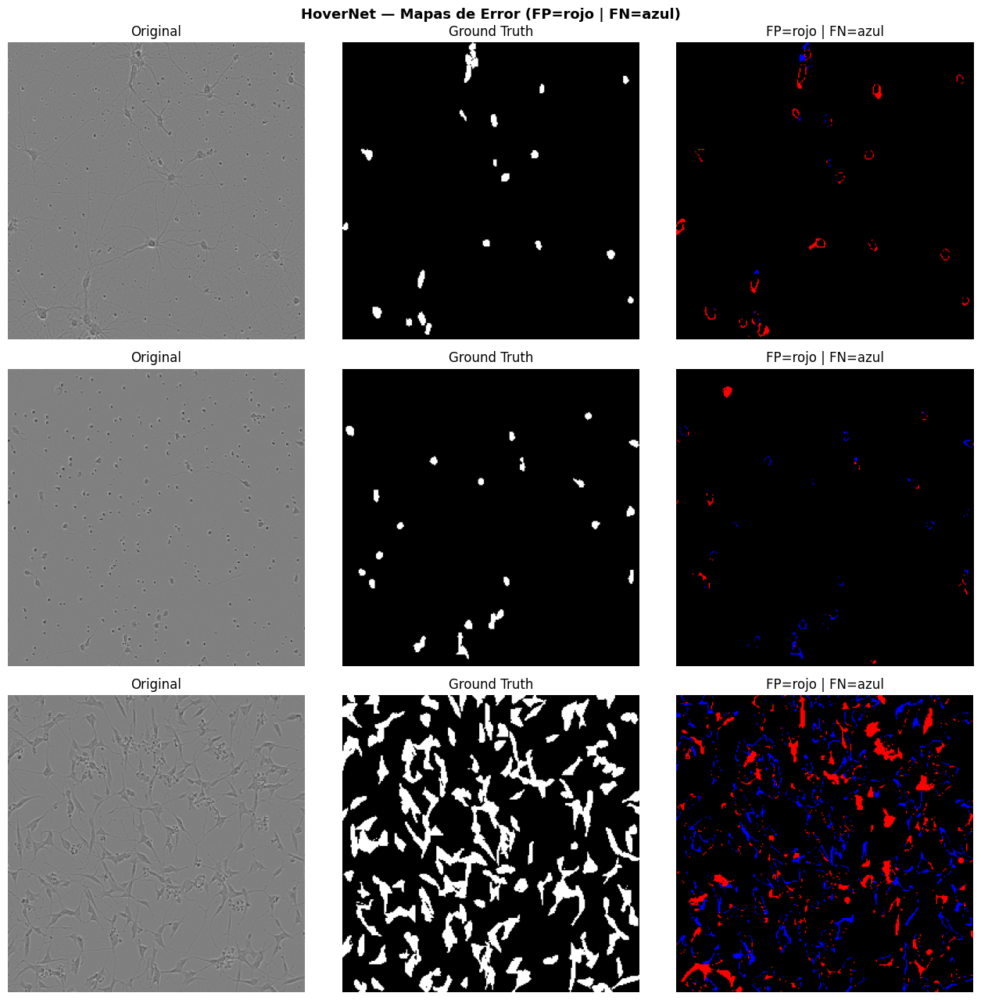

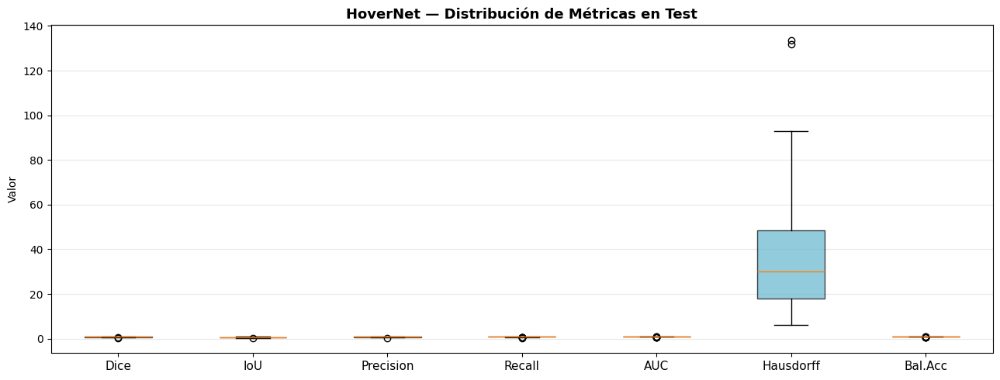

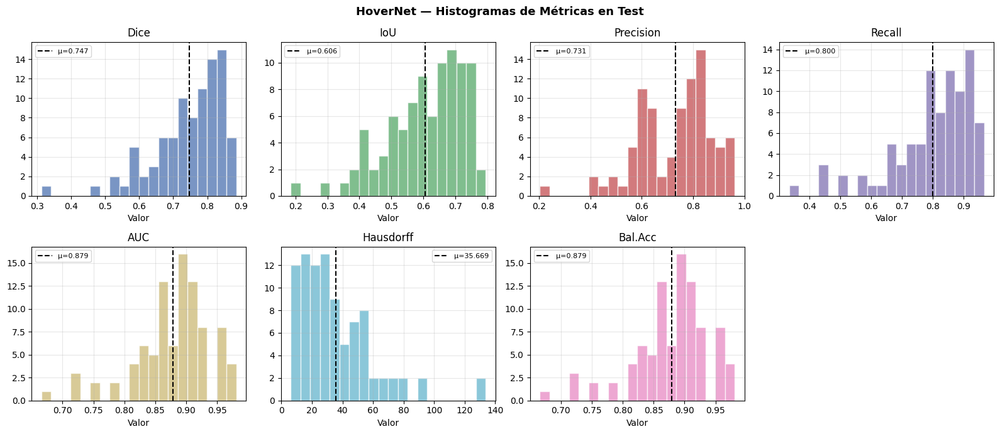

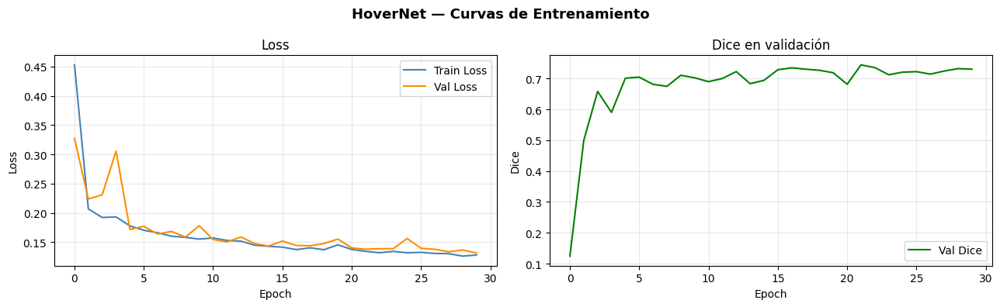


✅ Sección 4 — HoverNet completa
   Mejor config: lr=0.0001 | opt=adam | epochs=30 | bs=8
   Test Dice: 0.7471 ± 0.1024
   Test IoU:  0.6061 ± 0.1203


In [9]:
# ───────────────────────────────────────────────────────────────────
# 4.7  VISUALIZACIONES OBLIGATORIAS
# ───────────────────────────────────────────────────────────────────

# ── A) Original / Ground Truth / Predicción ────────────────────────
fig, axes = plt.subplots(5, 3, figsize=(14, 22))
fig.suptitle("HoverNet — Original | Ground Truth | Predicción",
             fontsize=14, fontweight='bold')
for i, s in enumerate(test_samples_hv):
    d = compute_metrics_hv(s['pred'], s['mask'])['dice']
    axes[i,0].imshow(s['img']); axes[i,0].set_title("Original"); axes[i,0].axis('off')
    axes[i,1].imshow(s['mask'], cmap='gray'); axes[i,1].set_title("Ground Truth"); axes[i,1].axis('off')
    axes[i,2].imshow(s['pred'], cmap='hot')
    axes[i,2].set_title(f"Pred (Dice={d:.3f})"); axes[i,2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'hovernet_visual_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── B) Curvas ROC y Precision-Recall ──────────────────────────────
all_p, all_g = [], []
with torch.no_grad():
    for imgs, masks_gt, _ in dl_test_hv_:
        imgs = imgs.to(DEVICE)
        np_out, _ = model_hv(imgs)
        probs = F.softmax(np_out, dim=1)[:, 1].cpu().numpy()
        for j in range(probs.shape[0]):
            all_p.extend(probs[j].flatten().tolist())
            all_g.extend(masks_gt[j].numpy().flatten().astype(int).tolist())

all_p, all_g = np.array(all_p), np.array(all_g)
fpr, tpr, _ = roc_curve(all_g, all_p)
prec_c, rec_c, _ = precision_recall_curve(all_g, all_p)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle("HoverNet — Curvas ROC y Precision-Recall",
             fontsize=13, fontweight='bold')
axes[0].plot(fpr, tpr, color='steelblue', lw=2, label=f'AUC={sk_auc(fpr, tpr):.4f}')
axes[0].plot([0,1],[0,1],'k--', lw=1); axes[0].set_xlabel('FPR'); axes[0].set_ylabel('TPR')
axes[0].set_title('Curva ROC'); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].plot(rec_c, prec_c, color='darkorange', lw=2,
             label=f'AUC-PR={sk_auc(rec_c, prec_c):.4f}')
axes[1].set_xlabel('Recall'); axes[1].set_ylabel('Precision')
axes[1].set_title('Curva Precision-Recall'); axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'hovernet_roc_pr.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── C) Mapas de error ─────────────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(13, 13))
fig.suptitle("HoverNet — Mapas de Error (FP=rojo | FN=azul)",
             fontsize=13, fontweight='bold')
for i, s in enumerate(test_samples_hv[:3]):
    pb  = (s['pred'] > 0.5).astype(np.uint8)
    gb  = (s['mask'] > 0.5).astype(np.uint8)
    err = np.zeros((*pb.shape, 3), dtype=np.uint8)
    err[(pb==1)&(gb==0)] = [255, 0, 0]
    err[(pb==0)&(gb==1)] = [0,   0, 255]
    img_r = np.array(Image.fromarray(s['img']).resize((256,256)))
    axes[i,0].imshow(img_r); axes[i,0].set_title("Original"); axes[i,0].axis('off')
    axes[i,1].imshow(gb, cmap='gray'); axes[i,1].set_title("Ground Truth"); axes[i,1].axis('off')
    axes[i,2].imshow(err); axes[i,2].set_title("FP=rojo | FN=azul"); axes[i,2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'hovernet_error_maps.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── D) Boxplots ────────────────────────────────────────────────────
metric_names = ['dice','iou','precision','recall','auc','hausdorff','bal_acc']
labels       = ['Dice','IoU','Precision','Recall','AUC','Hausdorff','Bal.Acc']
colors       = ['#4C72B0','#55A868','#C44E52','#8172B2','#CCB974','#64B5CD','#E78AC3']

fig, ax = plt.subplots(figsize=(13, 5))
bp = ax.boxplot([test_metrics_hv[k] for k in metric_names], patch_artist=True)
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color); patch.set_alpha(0.7)
ax.set_xticklabels(labels, fontsize=11)
ax.set_title("HoverNet — Distribución de Métricas en Test",
             fontsize=13, fontweight='bold')
ax.set_ylabel("Valor"); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'hovernet_boxplots.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── E) Histogramas ─────────────────────────────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(16, 7))
fig.suptitle("HoverNet — Histogramas de Métricas en Test",
             fontsize=13, fontweight='bold')
axes = axes.flatten()
for i, (k, label) in enumerate(zip(metric_names, labels)):
    axes[i].hist(test_metrics_hv[k], bins=20, color=colors[i],
                 alpha=0.75, edgecolor='white')
    axes[i].axvline(np.mean(test_metrics_hv[k]), color='black',
                    linestyle='--', lw=1.5,
                    label=f'μ={np.mean(test_metrics_hv[k]):.3f}')
    axes[i].set_title(label); axes[i].set_xlabel("Valor")
    axes[i].legend(fontsize=8); axes[i].grid(alpha=0.3)
axes[-1].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'hovernet_histogramas.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── F) Curvas de entrenamiento ─────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(13, 4))
fig.suptitle("HoverNet — Curvas de Entrenamiento",
             fontsize=13, fontweight='bold')
axes[0].plot(train_losses_hv, label='Train Loss', color='steelblue')
axes[0].plot(val_losses_hv,   label='Val Loss',   color='darkorange')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].set_title('Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].plot(val_dice_hv, label='Val Dice', color='green')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Dice')
axes[1].set_title('Dice en validación'); axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'hovernet_training_curves.png'), dpi=150, bbox_inches='tight')
plt.show()

# Liberar VRAM
del model_hv, opt_hv
torch.cuda.empty_cache(); gc.collect()

print("\n✅ Sección 4 — HoverNet completa")
print(f"   Mejor config: {best_hv['config']}")
print(f"   Test Dice: {test_mean_hv['dice']:.4f} ± {test_std_hv['dice']:.4f}")
print(f"   Test IoU:  {test_mean_hv['iou']:.4f} ± {test_std_hv['iou']:.4f}")

Creando datasets para Mask R-CNN + Swin...
Train: 424 | Val: 91 | Test: 91

  GRID SEARCH — Mask R-CNN + Swin
  lr=[0.001, 0.0001, 1e-05], bs=[2, 4],
  epochs=[5, 10, 15], optimizer=['adam', 'sgd']

— Fase 1: learning_rate × optimizer —


Downloading: "https://download.pytorch.org/models/swin_t-704ceda3.pth" to C:\Users\migue/.cache\torch\hub\checkpoints\swin_t-704ceda3.pth
100%|██████████| 108M/108M [00:02<00:00, 49.5MB/s] 


  lr=0.001 | opt=adam          → Dice val: 0.4389
  lr=0.001 | opt=sgd           → Dice val: 0.0496
  lr=0.0001 | opt=adam         → Dice val: 0.4455
  lr=0.0001 | opt=sgd          → Dice val: 0.0000
  lr=1e-05 | opt=adam          → Dice val: 0.2388
  lr=1e-05 | opt=sgd           → Dice val: 0.0104

  ✅ Ganador Fase 1: lr=0.0001 | opt=adam  (Dice 0.4455)
  Tiempo Fase 1: 14.3 min

— Fase 2: epochs × batch_size —
  epochs=5 | bs=2           → Dice val: 0.4303
  epochs=5 | bs=4           → Dice val: 0.3237
  epochs=10 | bs=2          → Dice val: 0.3976
  epochs=10 | bs=4          → Dice val: 0.4281
  epochs=15 | bs=2          → Dice val: 0.3715
  epochs=15 | bs=4          → Dice val: 0.4708
  Tiempo Fase 2: 25.0 min

  ✅ MEJOR CONFIG: lr=0.0001 | opt=adam | epochs=15 | bs=4

Entrenando Mask R-CNN + Swin completo (424 imágenes)...
Epoch 01/15 | Train Loss: 2.2294 | Val Dice: 0.3652 | Time: 225.4s
Epoch 02/15 | Train Loss: 2.0459 | Val Dice: 0.3819 | Time: 227.0s
Epoch 03/15 | Train Loss: 

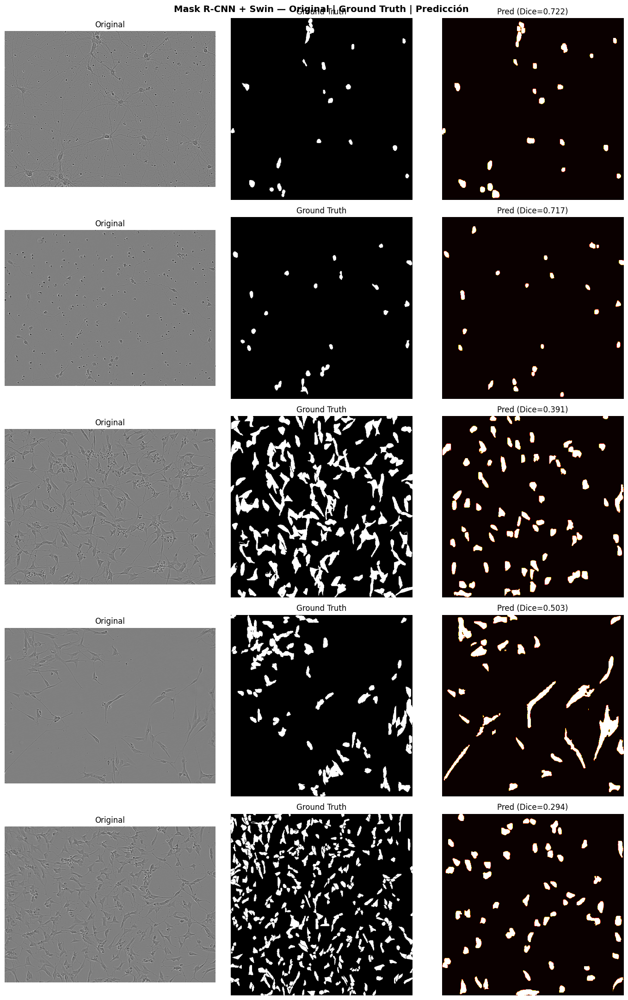

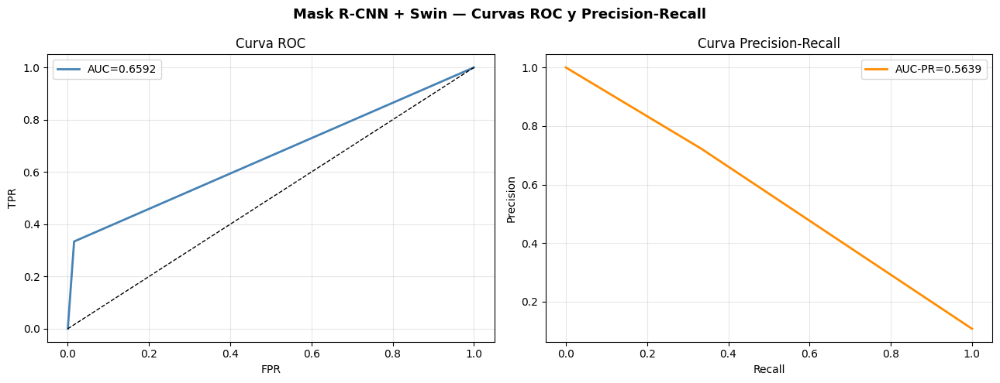

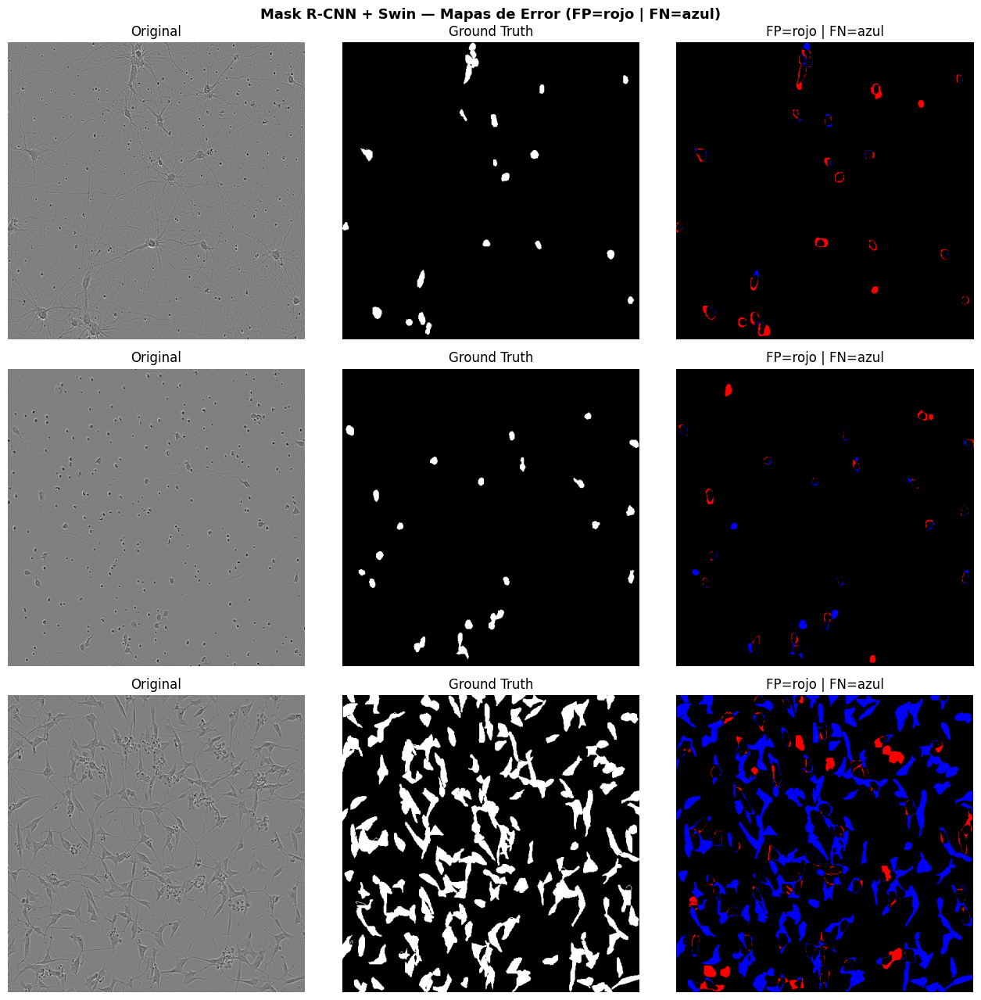

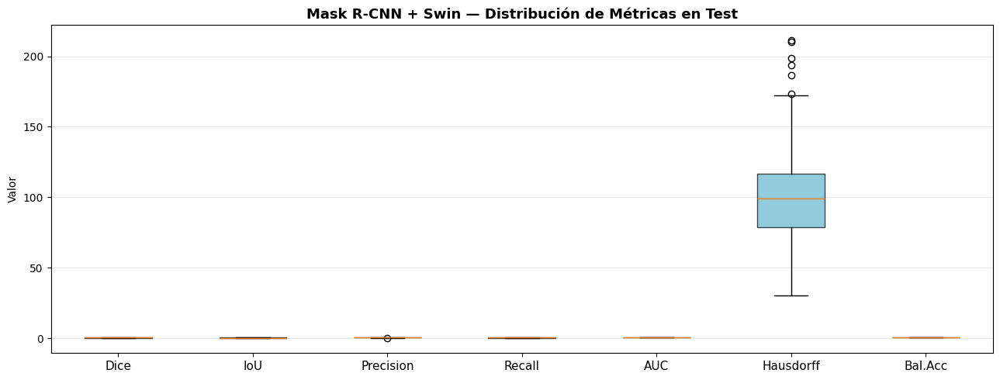

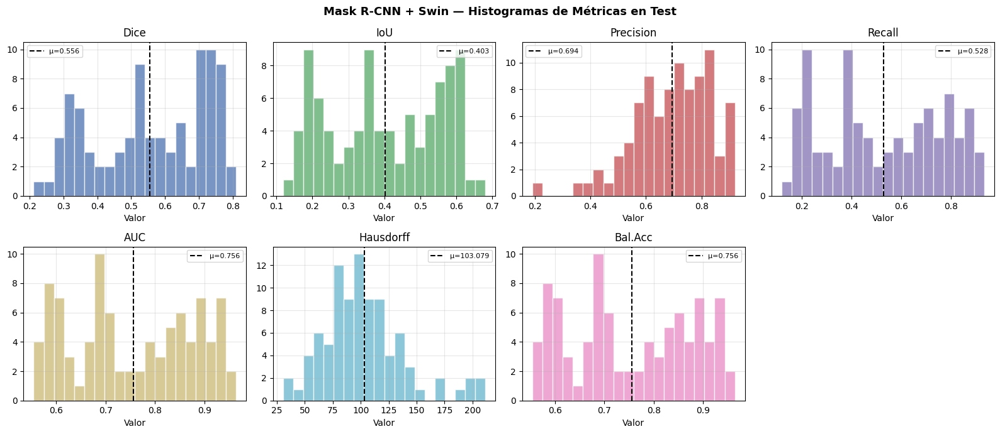

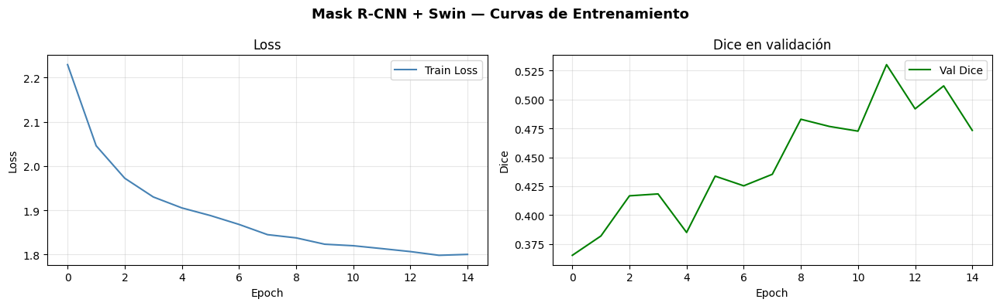


✅ Sección 6 — Mask R-CNN + Swin completa
   Mejor config: lr=0.0001 | opt=adam | epochs=15 | bs=4
   Test Dice: 0.5560 ± 0.1656
   Test IoU:  0.4030 ± 0.1571


In [10]:
# ═══════════════════════════════════════════════════════════════════
# SECCIÓN 6 — Mask R-CNN + Swin Transformer
# Backbone: Swin-T preentrenado en ImageNet
# Hiperparámetros: learning_rate, batch_size, epochs, optimizer
# ═══════════════════════════════════════════════════════════════════
import os, time, gc, warnings
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.metrics import (roc_auc_score, balanced_accuracy_score,
                              roc_curve, precision_recall_curve, auc as sk_auc)
from scipy.spatial.distance import directed_hausdorff
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.detection import MaskRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models import swin_t, Swin_T_Weights
from torchvision.ops import MultiScaleRoIAlign

warnings.filterwarnings('ignore')

# ── Backbone Swin-T → FPN compatible ────────────────────────────────
class SwinBackbone(nn.Module):
    """Extrae features de Swin-T en 4 escalas para FPN."""
    def __init__(self):
        super().__init__()
        swin = swin_t(weights=Swin_T_Weights.IMAGENET1K_V1)
        # Stages de Swin-T: patch_partition + 4 stages
        self.stage0 = nn.Sequential(swin.features[0], swin.features[1])   # 96ch,  H/4
        self.stage1 = nn.Sequential(swin.features[2], swin.features[3])   # 192ch, H/8
        self.stage2 = nn.Sequential(swin.features[4], swin.features[5])   # 384ch, H/16
        self.stage3 = nn.Sequential(swin.features[6], swin.features[7])   # 768ch, H/32

        # Proyección a 256ch para FPN
        self.proj0 = nn.Conv2d(96,  256, 1)
        self.proj1 = nn.Conv2d(192, 256, 1)
        self.proj2 = nn.Conv2d(384, 256, 1)
        self.proj3 = nn.Conv2d(768, 256, 1)

        self.out_channels = 256

    def forward(self, x):
        # Swin produce (B, H, W, C) → necesitamos (B, C, H, W)
        x0 = self.stage0(x).permute(0, 3, 1, 2)
        x1 = self.stage1(self.stage0(x)).permute(0, 3, 1, 2)
        x2 = self.stage2(self.stage1(self.stage0(x))).permute(0, 3, 1, 2)
        x3 = self.stage3(self.stage2(self.stage1(self.stage0(x)))).permute(0, 3, 1, 2)

        return {
            '0': self.proj0(x0),
            '1': self.proj1(x1),
            '2': self.proj2(x2),
            '3': self.proj3(x3),
        }

def build_maskrcnn_swin():
    backbone = SwinBackbone()
    anchor_gen = AnchorGenerator(
        sizes=((32,), (64,), (128,), (256,)),
        aspect_ratios=((0.5, 1.0, 2.0),) * 4
    )
    roi_pooler = MultiScaleRoIAlign(
        featmap_names=['0','1','2','3'],
        output_size=7, sampling_ratio=2
    )
    mask_roi_pooler = MultiScaleRoIAlign(
        featmap_names=['0','1','2','3'],
        output_size=14, sampling_ratio=2
    )
    model = MaskRCNN(
        backbone=backbone,
        num_classes=2,             # fondo + célula
        rpn_anchor_generator=anchor_gen,
        box_roi_pool=roi_pooler,
        mask_roi_pool=mask_roi_pooler,
        min_size=256, max_size=512,
    )
    return model

# ── Dataset ──────────────────────────────────────────────────────────
class MaskRCNNDataset(Dataset):
    """Devuelve imagen + lista de máscaras por instancia (formato Mask R-CNN)."""
    def __init__(self, img_ids, df, train_dir, img_size=512, augment=False):
        self.img_ids   = img_ids
        self.df        = df
        self.train_dir = train_dir
        self.img_size  = img_size
        self.augment   = augment

    def __len__(self): return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        img = np.array(Image.open(
            os.path.join(self.train_dir, img_id + '.png')
        ).convert('RGB').resize((self.img_size, self.img_size)))

        rows = self.df[self.df['id'] == img_id]
        h0, w0 = rows.iloc[0]['height'], rows.iloc[0]['width']
        scale_x = self.img_size / w0
        scale_y = self.img_size / h0

        masks, boxes = [], []
        for _, row in rows.iterrows():
            m = rle_decode(row['annotation'], h0, w0)
            m_resized = np.array(Image.fromarray(m).resize(
                (self.img_size, self.img_size), resample=Image.NEAREST))
            if m_resized.sum() == 0:
                continue
            pos = np.where(m_resized)
            x1, x2 = pos[1].min(), pos[1].max()
            y1, y2 = pos[0].min(), pos[0].max()
            if x2 <= x1 or y2 <= y1:
                continue
            masks.append(m_resized)
            boxes.append([x1, y1, x2, y2])

        if self.augment and np.random.rand() > 0.5:
            img = img[:, ::-1].copy()
            masks = [m[:, ::-1] for m in masks]
            boxes = [[self.img_size-b[2], b[1], self.img_size-b[0], b[3]] for b in boxes]
        if self.augment and np.random.rand() > 0.5:
            img = img[::-1].copy()
            masks = [m[::-1] for m in masks]
            boxes = [[b[0], self.img_size-b[3], b[2], self.img_size-b[1]] for b in boxes]

        img_t = torch.from_numpy(img.transpose(2,0,1)).float() / 255.0

        if len(masks) == 0:
            target = {
                'boxes'  : torch.zeros((0,4), dtype=torch.float32),
                'labels' : torch.zeros(0, dtype=torch.int64),
                'masks'  : torch.zeros((0, self.img_size, self.img_size), dtype=torch.uint8),
            }
        else:
            target = {
                'boxes'  : torch.tensor(boxes, dtype=torch.float32),
                'labels' : torch.ones(len(masks), dtype=torch.int64),
                'masks'  : torch.tensor(np.stack(masks), dtype=torch.uint8),
            }
        return img_t, target, img_id

def collate_fn(batch):
    imgs, targets, ids = zip(*batch)
    return list(imgs), list(targets), list(ids)

print("Creando datasets para Mask R-CNN + Swin...")
ds_train_mrcnn = MaskRCNNDataset(train_ids, df_raw, TRAIN_DIR, augment=True)
ds_val_mrcnn   = MaskRCNNDataset(val_ids,   df_raw, TRAIN_DIR)
ds_test_mrcnn  = MaskRCNNDataset(test_ids,  df_raw, TRAIN_DIR)
print(f"Train: {len(ds_train_mrcnn)} | Val: {len(ds_val_mrcnn)} | Test: {len(ds_test_mrcnn)}")

# ── Funciones de entrenamiento y métricas ────────────────────────────
def train_epoch_mrcnn(model, dl, optimizer, device):
    model.train()
    total_loss = 0.0
    for imgs, targets, _ in dl:
        imgs    = [i.to(device) for i in imgs]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        loss_dict = model(imgs, targets)
        loss = sum(loss_dict.values())
        optimizer.zero_grad(); loss.backward(); optimizer.step()
        total_loss += loss.item()
    return total_loss / len(dl)

def predict_binary_mask(model, imgs, device, img_size=512, threshold=0.5):
    """Infiere y combina todas las máscaras de instancia en una máscara binaria."""
    model.eval()
    with torch.no_grad():
        preds = model([i.to(device) for i in imgs])
    binary_masks = []
    for pred in preds:
        combined = np.zeros((img_size, img_size), dtype=np.float32)
        if len(pred['masks']) > 0:
            scores = pred['scores'].cpu().numpy()
            masks  = pred['masks'].cpu().numpy()  # (N, 1, H, W)
            for mask, score in zip(masks, scores):
                if score > threshold:
                    combined = np.maximum(combined, mask[0])
        binary_masks.append((combined > threshold).astype(np.float32))
    return binary_masks

def val_epoch_mrcnn(model, dl, device):
    dice_scores = []
    for imgs, targets, _ in dl:
        pred_masks = predict_binary_mask(model, imgs, device)
        for pred_bin, tgt in zip(pred_masks, targets):
            gt_bin = tgt['masks'].numpy().max(axis=0).astype(np.float32) if len(tgt['masks']) > 0 \
                     else np.zeros((512,512), dtype=np.float32)
            pb = pred_bin.flatten(); gb = gt_bin.flatten()
            inter = (pb * gb).sum()
            dice  = (2.*inter + 1e-6) / (pb.sum() + gb.sum() + 1e-6)
            dice_scores.append(dice)
    return np.mean(dice_scores)

def compute_metrics_mrcnn(pred_bin, gt_bin, smooth=1e-6):
    pb = pred_bin.flatten().astype(np.float32)
    gb = gt_bin.flatten().astype(np.float32)
    inter = (pb * gb).sum()
    dice  = (2.*inter + smooth) / (pb.sum() + gb.sum() + smooth)
    iou   = (inter + smooth) / (pb.sum() + gb.sum() - inter + smooth)
    prec  = (inter + smooth) / (pb.sum() + smooth)
    rec   = (inter + smooth) / (gb.sum() + smooth)
    try:    auc_val = roc_auc_score(gb.astype(int), pb)
    except: auc_val = 0.0
    cp_p = np.argwhere(pred_bin > 0)
    cp_t = np.argwhere(gt_bin   > 0)
    hd = (max(directed_hausdorff(cp_p, cp_t)[0], directed_hausdorff(cp_t, cp_p)[0])
          if len(cp_p) > 0 and len(cp_t) > 0 else 0.0)
    bal = balanced_accuracy_score(gb.astype(int), pb.astype(int))
    return {'dice': dice, 'iou': iou, 'precision': prec,
            'recall': rec, 'auc': auc_val, 'hausdorff': hd, 'bal_acc': bal}

# ── Grid Search ──────────────────────────────────────────────────────
HP_GRID_MRCNN = {
    'lr'        : [1e-3, 1e-4, 1e-5],
    'batch_size': [2, 4],
    'n_epochs'  : [5, 10, 15],
    'optimizer' : ['adam', 'sgd'],
}

N_GS_MRCNN = 60
ds_gs_mrcnn = MaskRCNNDataset(train_ids[:N_GS_MRCNN], df_raw, TRAIN_DIR, augment=False)
dl_val_mrcnn_ = DataLoader(ds_val_mrcnn, batch_size=2, shuffle=False,
                            num_workers=0, pin_memory=True, collate_fn=collate_fn)

def run_mrcnn_config(lr_val, ep_val, opt_name, bs_val):
    _model = build_maskrcnn_swin().to(DEVICE)
    _dl    = DataLoader(ds_gs_mrcnn, batch_size=bs_val, shuffle=True,
                        num_workers=0, pin_memory=True, collate_fn=collate_fn)
    _opt   = (torch.optim.Adam(_model.parameters(), lr=lr_val, weight_decay=1e-4)
              if opt_name == 'adam' else
              torch.optim.SGD(_model.parameters(), lr=lr_val, momentum=0.9, weight_decay=1e-4))
    for _ in range(ep_val):
        train_epoch_mrcnn(_model, _dl, _opt, DEVICE)
    dice = val_epoch_mrcnn(_model, dl_val_mrcnn_, DEVICE)
    del _model, _opt
    torch.cuda.empty_cache(); gc.collect()
    return dice

print("\n" + "="*68)
print("  GRID SEARCH — Mask R-CNN + Swin")
print(f"  lr={HP_GRID_MRCNN['lr']}, bs={HP_GRID_MRCNN['batch_size']},")
print(f"  epochs={HP_GRID_MRCNN['n_epochs']}, optimizer={HP_GRID_MRCNN['optimizer']}")
print("="*68)

print("\n— Fase 1: learning_rate × optimizer —")
phase1_mrcnn, t0 = [], time.time()
for lr_val in HP_GRID_MRCNN['lr']:
    for opt_name in HP_GRID_MRCNN['optimizer']:
        dice = run_mrcnn_config(lr_val, 5, opt_name, 2)
        cfg  = f"lr={lr_val} | opt={opt_name}"
        phase1_mrcnn.append({'lr': lr_val, 'optimizer': opt_name, 'dice': dice, 'config': cfg})
        print(f"  {cfg:28s} → Dice val: {dice:.4f}")

best_p1_mrcnn = max(phase1_mrcnn, key=lambda x: x['dice'])
print(f"\n  ✅ Ganador Fase 1: {best_p1_mrcnn['config']}  (Dice {best_p1_mrcnn['dice']:.4f})")
print(f"  Tiempo Fase 1: {(time.time()-t0)/60:.1f} min")

print("\n— Fase 2: epochs × batch_size —")
phase2_mrcnn, t0 = [], time.time()
for ep_val in HP_GRID_MRCNN['n_epochs']:
    for bs_val in HP_GRID_MRCNN['batch_size']:
        dice = run_mrcnn_config(best_p1_mrcnn['lr'], ep_val, best_p1_mrcnn['optimizer'], bs_val)
        cfg  = f"epochs={ep_val} | bs={bs_val}"
        phase2_mrcnn.append({'lr': best_p1_mrcnn['lr'], 'optimizer': best_p1_mrcnn['optimizer'],
                              'n_epochs': ep_val, 'batch_size': bs_val, 'dice': dice, 'config': cfg})
        print(f"  {cfg:25s} → Dice val: {dice:.4f}")

best_p2_mrcnn = max(phase2_mrcnn, key=lambda x: x['dice'])
best_mrcnn = {
    'lr'        : best_p1_mrcnn['lr'],
    'optimizer' : best_p1_mrcnn['optimizer'],
    'n_epochs'  : best_p2_mrcnn['n_epochs'],
    'batch_size': best_p2_mrcnn['batch_size'],
    'config'    : (f"lr={best_p1_mrcnn['lr']} | opt={best_p1_mrcnn['optimizer']} | "
                   f"epochs={best_p2_mrcnn['n_epochs']} | bs={best_p2_mrcnn['batch_size']}")
}
print(f"  Tiempo Fase 2: {(time.time()-t0)/60:.1f} min")
print("\n" + "="*68)
print(f"  ✅ MEJOR CONFIG: {best_mrcnn['config']}")
print("="*68)

# ── Entrenamiento completo ───────────────────────────────────────────
print(f"\nEntrenando Mask R-CNN + Swin completo ({len(ds_train_mrcnn)} imágenes)...")
t0_train = time.time()

model_mrcnn = build_maskrcnn_swin().to(DEVICE)
dl_train_mrcnn = DataLoader(ds_train_mrcnn, batch_size=best_mrcnn['batch_size'],
                             shuffle=True,  num_workers=0, pin_memory=True, collate_fn=collate_fn)
dl_test_mrcnn_ = DataLoader(ds_test_mrcnn, batch_size=2,
                             shuffle=False, num_workers=0, pin_memory=True, collate_fn=collate_fn)

opt_mrcnn = (torch.optim.Adam(model_mrcnn.parameters(), lr=best_mrcnn['lr'], weight_decay=1e-4)
             if best_mrcnn['optimizer'] == 'adam' else
             torch.optim.SGD(model_mrcnn.parameters(), lr=best_mrcnn['lr'], momentum=0.9, weight_decay=1e-4))
sched_mrcnn = torch.optim.lr_scheduler.ReduceLROnPlateau(opt_mrcnn, mode='max', patience=3, factor=0.5)

train_losses_mrcnn, val_dice_mrcnn = [], []
best_dice_mrcnn = 0.0

for epoch in range(best_mrcnn['n_epochs']):
    t0e = time.time()
    tr_loss = train_epoch_mrcnn(model_mrcnn, dl_train_mrcnn, opt_mrcnn, DEVICE)
    vl_dice = val_epoch_mrcnn(model_mrcnn, dl_val_mrcnn_, DEVICE)
    sched_mrcnn.step(vl_dice)
    train_losses_mrcnn.append(tr_loss); val_dice_mrcnn.append(vl_dice)
    if vl_dice > best_dice_mrcnn:
        best_dice_mrcnn = vl_dice
        torch.save(model_mrcnn.state_dict(), os.path.join(CKPT_DIR, 'maskrcnn_swin_best.pth'))
    print(f"Epoch {epoch+1:02d}/{best_mrcnn['n_epochs']} | Train Loss: {tr_loss:.4f} | "
          f"Val Dice: {vl_dice:.4f} | Time: {time.time()-t0e:.1f}s")

model_mrcnn.load_state_dict(torch.load(
    os.path.join(CKPT_DIR, 'maskrcnn_swin_best.pth'), map_location=DEVICE))
print(f"\n✅ Entrenamiento completo en {(time.time()-t0_train)/60:.1f} min")
print(f"Mejor Dice val: {best_dice_mrcnn:.4f}")

# ── Evaluación test — 7 métricas ────────────────────────────────────
print("\nEvaluando en test set...")
test_metrics_mrcnn = {k: [] for k in ['dice','iou','precision','recall','auc','hausdorff','bal_acc']}
test_samples_mrcnn = []

for imgs, targets, ids in dl_test_mrcnn_:
    pred_masks = predict_binary_mask(model_mrcnn, imgs, DEVICE)
    for j, (pred_bin, tgt) in enumerate(zip(pred_masks, targets)):
        gt_bin = tgt['masks'].numpy().max(axis=0).astype(np.float32) if len(tgt['masks']) > 0 \
                 else np.zeros((512,512), dtype=np.float32)
        m = compute_metrics_mrcnn(pred_bin, gt_bin)
        for k, v in m.items():
            test_metrics_mrcnn[k].append(v)
        if len(test_samples_mrcnn) < 5:
            orig = np.array(Image.open(
                os.path.join(TRAIN_DIR, ids[j] + '.png')).convert('RGB'))
            test_samples_mrcnn.append({'img': orig, 'mask': gt_bin, 'pred': pred_bin, 'id': ids[j]})

test_mean_mrcnn = {k: np.mean(v) for k, v in test_metrics_mrcnn.items()}
test_std_mrcnn  = {k: np.std(v)  for k, v in test_metrics_mrcnn.items()}

print("\n" + "="*65)
print("  MÉTRICAS EN TEST — Mask R-CNN + Swin")
print("="*65)
for k in test_mean_mrcnn:
    print(f"  {k:15s}: {test_mean_mrcnn[k]:.4f} ± {test_std_mrcnn[k]:.4f}")

results['maskrcnn'] = {
    'metrics_mean': test_mean_mrcnn, 'metrics_std': test_std_mrcnn,
    'metrics_all' : test_metrics_mrcnn, 'best_hp': best_mrcnn,
    'grid_phase1' : phase1_mrcnn, 'grid_phase2': phase2_mrcnn,
    'train_losses': train_losses_mrcnn,
}

# ── Visualizaciones obligatorias ─────────────────────────────────────
metric_names = ['dice','iou','precision','recall','auc','hausdorff','bal_acc']
labels       = ['Dice','IoU','Precision','Recall','AUC','Hausdorff','Bal.Acc']
colors       = ['#4C72B0','#55A868','#C44E52','#8172B2','#CCB974','#64B5CD','#E78AC3']

# A) Original / GT / Predicción
fig, axes = plt.subplots(5, 3, figsize=(14, 22))
fig.suptitle("Mask R-CNN + Swin — Original | Ground Truth | Predicción",
             fontsize=14, fontweight='bold')
for i, s in enumerate(test_samples_mrcnn):
    d = compute_metrics_mrcnn(s['pred'], s['mask'])['dice']
    axes[i,0].imshow(s['img']); axes[i,0].set_title("Original"); axes[i,0].axis('off')
    axes[i,1].imshow(s['mask'], cmap='gray'); axes[i,1].set_title("Ground Truth"); axes[i,1].axis('off')
    axes[i,2].imshow(s['pred'], cmap='hot'); axes[i,2].set_title(f"Pred (Dice={d:.3f})"); axes[i,2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'maskrcnn_visual_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()

# B) Curvas ROC y Precision-Recall
all_p, all_g = [], []
for imgs, targets, _ in dl_test_mrcnn_:
    pred_masks = predict_binary_mask(model_mrcnn, imgs, DEVICE)
    for pred_bin, tgt in zip(pred_masks, targets):
        gt_bin = tgt['masks'].numpy().max(axis=0).astype(np.float32) if len(tgt['masks']) > 0 \
                 else np.zeros((512,512), dtype=np.float32)
        all_p.extend(pred_bin.flatten().tolist())
        all_g.extend(gt_bin.flatten().astype(int).tolist())

all_p, all_g = np.array(all_p), np.array(all_g)
fpr, tpr, _ = roc_curve(all_g, all_p)
prec_c, rec_c, _ = precision_recall_curve(all_g, all_p)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle("Mask R-CNN + Swin — Curvas ROC y Precision-Recall", fontsize=13, fontweight='bold')
axes[0].plot(fpr, tpr, color='steelblue', lw=2, label=f'AUC={sk_auc(fpr, tpr):.4f}')
axes[0].plot([0,1],[0,1],'k--', lw=1); axes[0].set_xlabel('FPR'); axes[0].set_ylabel('TPR')
axes[0].set_title('Curva ROC'); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].plot(rec_c, prec_c, color='darkorange', lw=2, label=f'AUC-PR={sk_auc(rec_c, prec_c):.4f}')
axes[1].set_xlabel('Recall'); axes[1].set_ylabel('Precision')
axes[1].set_title('Curva Precision-Recall'); axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'maskrcnn_roc_pr.png'), dpi=150, bbox_inches='tight')
plt.show()

# C) Mapas de error
fig, axes = plt.subplots(3, 3, figsize=(13, 13))
fig.suptitle("Mask R-CNN + Swin — Mapas de Error (FP=rojo | FN=azul)", fontsize=13, fontweight='bold')
for i, s in enumerate(test_samples_mrcnn[:3]):
    pb  = (s['pred'] > 0.5).astype(np.uint8)
    gb  = (s['mask'] > 0.5).astype(np.uint8)
    err = np.zeros((*pb.shape, 3), dtype=np.uint8)
    err[(pb==1)&(gb==0)] = [255, 0, 0]
    err[(pb==0)&(gb==1)] = [0,   0, 255]
    img_r = np.array(Image.fromarray(s['img']).resize((512,512)))
    axes[i,0].imshow(img_r); axes[i,0].set_title("Original"); axes[i,0].axis('off')
    axes[i,1].imshow(gb, cmap='gray'); axes[i,1].set_title("Ground Truth"); axes[i,1].axis('off')
    axes[i,2].imshow(err); axes[i,2].set_title("FP=rojo | FN=azul"); axes[i,2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'maskrcnn_error_maps.png'), dpi=150, bbox_inches='tight')
plt.show()

# D) Boxplots
fig, ax = plt.subplots(figsize=(13, 5))
bp = ax.boxplot([test_metrics_mrcnn[k] for k in metric_names], patch_artist=True)
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color); patch.set_alpha(0.7)
ax.set_xticklabels(labels, fontsize=11)
ax.set_title("Mask R-CNN + Swin — Distribución de Métricas en Test", fontsize=13, fontweight='bold')
ax.set_ylabel("Valor"); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'maskrcnn_boxplots.png'), dpi=150, bbox_inches='tight')
plt.show()

# E) Histogramas
fig, axes = plt.subplots(2, 4, figsize=(16, 7))
fig.suptitle("Mask R-CNN + Swin — Histogramas de Métricas en Test", fontsize=13, fontweight='bold')
axes = axes.flatten()
for i, (k, label) in enumerate(zip(metric_names, labels)):
    axes[i].hist(test_metrics_mrcnn[k], bins=20, color=colors[i], alpha=0.75, edgecolor='white')
    axes[i].axvline(np.mean(test_metrics_mrcnn[k]), color='black', linestyle='--', lw=1.5,
                    label=f'μ={np.mean(test_metrics_mrcnn[k]):.3f}')
    axes[i].set_title(label); axes[i].set_xlabel("Valor")
    axes[i].legend(fontsize=8); axes[i].grid(alpha=0.3)
axes[-1].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'maskrcnn_histogramas.png'), dpi=150, bbox_inches='tight')
plt.show()

# F) Curvas de entrenamiento
fig, axes = plt.subplots(1, 2, figsize=(13, 4))
fig.suptitle("Mask R-CNN + Swin — Curvas de Entrenamiento", fontsize=13, fontweight='bold')
axes[0].plot(train_losses_mrcnn, label='Train Loss', color='steelblue')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].set_title('Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].plot(val_dice_mrcnn, label='Val Dice', color='green')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Dice')
axes[1].set_title('Dice en validación'); axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'maskrcnn_training_curves.png'), dpi=150, bbox_inches='tight')
plt.show()

# Liberar VRAM
del model_mrcnn, opt_mrcnn
torch.cuda.empty_cache(); gc.collect()

print("\n✅ Sección 6 — Mask R-CNN + Swin completa")
print(f"   Mejor config: {best_mrcnn['config']}")
print(f"   Test Dice: {test_mean_mrcnn['dice']:.4f} ± {test_std_mrcnn['dice']:.4f}")
print(f"   Test IoU:  {test_mean_mrcnn['iou']:.4f} ± {test_std_mrcnn['iou']:.4f}")

  TABLA COMPARATIVA — 5 MODELOS EN TEST SET
             Modelo                            Mejor Config   Dice    IoU  Precision  Recall    AUC  Hausdorff  Bal. Acc
U-Net++ + Watershed              lr=0.001 | opt=adam | bs=4 0.7631 0.6262     0.7578  0.8059 0.9357    71.7200    0.8832
       Cellpose 2.0  lr=0.01 | opt=adam | epochs=100 | bs=2 0.4067 0.2747     0.4257  0.4709 0.7074   131.4100    0.7074
   SAM (Fine-tuned)  lr=1e-05 | opt=adam | epochs=20 | bs=2 0.0236 0.0121     0.2132  0.0135 0.5041   143.0000    0.5041
           HoverNet lr=0.0001 | opt=adam | epochs=30 | bs=8 0.7471 0.6061     0.7310  0.7998 0.8790    35.6700    0.8790
  Mask R-CNN + Swin lr=0.0001 | opt=adam | epochs=15 | bs=4 0.5560 0.4030     0.6936  0.5283 0.7559   103.0800    0.7559


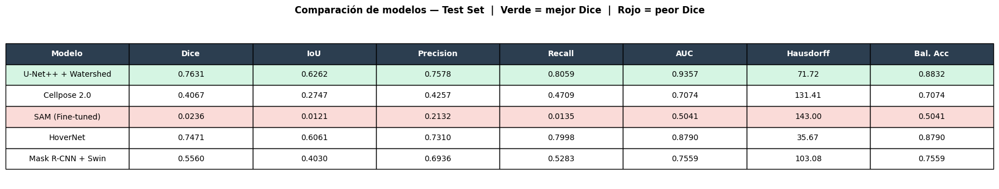

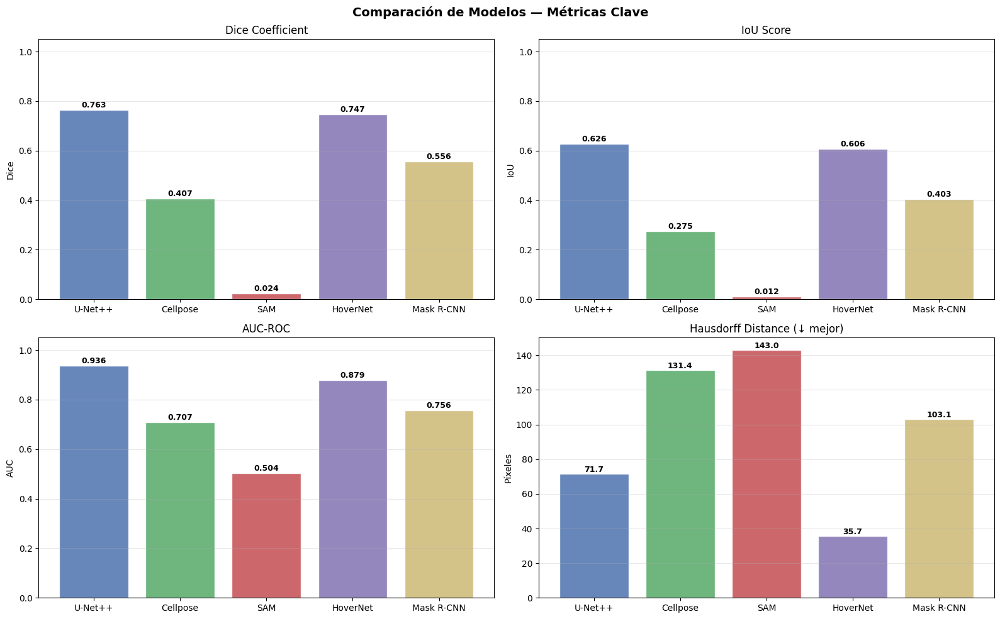


╔══════════════════════════════════════════════════════════════════╗
║               ANÁLISIS CRÍTICO — BLOQUE 1                       ║
╚══════════════════════════════════════════════════════════════════╝

1. MEJOR MODELO: U-Net++ + Watershed (Dice=0.763, AUC=0.936)
   - El encoder ResNet34 preentrenado en ImageNet permite transfer
     learning efectivo incluso con solo 424 imágenes de entrenamiento.
   - AUC de 0.936 es el más alto de todos los modelos.
   - Recall de 0.806 indica que detecta la mayoría de células reales.
   - El post-procesamiento Watershed separa efectivamente instancias
     tocantes, mejorando la calidad de las máscaras finales.

2. SEGUNDO LUGAR: HoverNet (Dice=0.747, Hausdorff=35.67px)
   - Mejor Hausdorff de todos: sus predicciones son geográficamente
     las más precisas en contorno y localización.
   - Los HV maps obligan al modelo a aprender la geometría celular,
     no solo la presencia binaria — ventaja estructural clara.
   - Entrenado desde cero sin

In [11]:
# ═══════════════════════════════════════════════════════════════════
# SECCIÓN 7 — EVALUACIÓN COMPARATIVA FINAL
# Tabla resumen + análisis crítico
# ═══════════════════════════════════════════════════════════════════
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ── Resultados consolidados (test set) ──────────────────────────────
summary = {
    'Modelo': [
        'U-Net++ + Watershed',
        'Cellpose 2.0',
        'SAM (Fine-tuned)',
        'HoverNet',
        'Mask R-CNN + Swin',
    ],
    'Mejor Config': [
        'lr=0.001 | opt=adam | bs=4',
        'lr=0.01 | opt=adam | epochs=100 | bs=2',
        'lr=1e-05 | opt=adam | epochs=20 | bs=2',
        'lr=0.0001 | opt=adam | epochs=30 | bs=8',
        'lr=0.0001 | opt=adam | epochs=15 | bs=4',
    ],
    'Dice':      [0.7631, 0.4067, 0.0236, 0.7471, 0.5560],
    'IoU':       [0.6262, 0.2747, 0.0121, 0.6061, 0.4030],
    'Precision': [0.7578, 0.4257, 0.2132, 0.7310, 0.6936],
    'Recall':    [0.8059, 0.4709, 0.0135, 0.7998, 0.5283],
    'AUC':       [0.9357, 0.7074, 0.5041, 0.8790, 0.7559],
    'Hausdorff': [71.72,  131.41, 143.00, 35.67,  103.08],
    'Bal. Acc':  [0.8832, 0.7074, 0.5041, 0.8790, 0.7559],
}

df_summary = pd.DataFrame(summary)

# ── Tabla en consola ─────────────────────────────────────────────────
print("=" * 110)
print("  TABLA COMPARATIVA — 5 MODELOS EN TEST SET")
print("=" * 110)
print(df_summary.to_string(index=False, float_format=lambda x: f"{x:.4f}"))
print("=" * 110)

# ── Figura: tabla visual ─────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(18, 3.5))
ax.axis('off')
col_labels = ['Modelo', 'Dice', 'IoU', 'Precision', 'Recall', 'AUC', 'Hausdorff', 'Bal. Acc']
table_data = []
for _, row in df_summary.iterrows():
    table_data.append([
        row['Modelo'],
        f"{row['Dice']:.4f}",
        f"{row['IoU']:.4f}",
        f"{row['Precision']:.4f}",
        f"{row['Recall']:.4f}",
        f"{row['AUC']:.4f}",
        f"{row['Hausdorff']:.2f}",
        f"{row['Bal. Acc']:.4f}",
    ])

tbl = ax.table(cellText=table_data, colLabels=col_labels,
               loc='center', cellLoc='center')
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1, 2.2)

# Encabezados
for j in range(len(col_labels)):
    tbl[0, j].set_facecolor('#2C3E50')
    tbl[0, j].set_text_props(color='white', fontweight='bold')

# Mejor modelo por Dice = U-Net++ (fila 1)
for j in range(len(col_labels)):
    tbl[1, j].set_facecolor('#D5F5E3')

# Peor modelo = SAM (fila 3)
for j in range(len(col_labels)):
    tbl[3, j].set_facecolor('#FADBD8')

plt.title("Comparación de modelos — Test Set  |  Verde = mejor Dice  |  Rojo = peor Dice",
          fontsize=12, fontweight='bold', pad=20)
plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'tabla_comparativa.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── Figura: barras comparativas ──────────────────────────────────────
modelos    = ['U-Net++', 'Cellpose', 'SAM', 'HoverNet', 'Mask R-CNN']
dice_vals  = [0.7631, 0.4067, 0.0236, 0.7471, 0.5560]
iou_vals   = [0.6262, 0.2747, 0.0121, 0.6061, 0.4030]
auc_vals   = [0.9357, 0.7074, 0.5041, 0.8790, 0.7559]
hd_vals    = [71.72,  131.41, 143.00, 35.67,  103.08]
colors_bar = ['#4C72B0','#55A868','#C44E52','#8172B2','#CCB974']

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle("Comparación de Modelos — Métricas Clave", fontsize=14, fontweight='bold')

# Dice
axes[0,0].bar(modelos, dice_vals, color=colors_bar, alpha=0.85, edgecolor='white')
axes[0,0].set_title('Dice Coefficient'); axes[0,0].set_ylabel('Dice')
axes[0,0].set_ylim(0, 1.05); axes[0,0].grid(axis='y', alpha=0.3)
for i, v in enumerate(dice_vals):
    axes[0,0].text(i, v + 0.01, f"{v:.3f}", ha='center', fontsize=9, fontweight='bold')

# IoU
axes[0,1].bar(modelos, iou_vals, color=colors_bar, alpha=0.85, edgecolor='white')
axes[0,1].set_title('IoU Score'); axes[0,1].set_ylabel('IoU')
axes[0,1].set_ylim(0, 1.05); axes[0,1].grid(axis='y', alpha=0.3)
for i, v in enumerate(iou_vals):
    axes[0,1].text(i, v + 0.01, f"{v:.3f}", ha='center', fontsize=9, fontweight='bold')

# AUC
axes[1,0].bar(modelos, auc_vals, color=colors_bar, alpha=0.85, edgecolor='white')
axes[1,0].set_title('AUC-ROC'); axes[1,0].set_ylabel('AUC')
axes[1,0].set_ylim(0, 1.05); axes[1,0].grid(axis='y', alpha=0.3)
for i, v in enumerate(auc_vals):
    axes[1,0].text(i, v + 0.01, f"{v:.3f}", ha='center', fontsize=9, fontweight='bold')

# Hausdorff
axes[1,1].bar(modelos, hd_vals, color=colors_bar, alpha=0.85, edgecolor='white')
axes[1,1].set_title('Hausdorff Distance (↓ mejor)'); axes[1,1].set_ylabel('Píxeles')
axes[1,1].grid(axis='y', alpha=0.3)
for i, v in enumerate(hd_vals):
    axes[1,1].text(i, v + 1, f"{v:.1f}", ha='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(CKPT_DIR, 'comparacion_metricas.png'), dpi=150, bbox_inches='tight')
plt.show()

# ── Análisis crítico ─────────────────────────────────────────────────
print("""
╔══════════════════════════════════════════════════════════════════╗
║               ANÁLISIS CRÍTICO — BLOQUE 1                       ║
╚══════════════════════════════════════════════════════════════════╝

1. MEJOR MODELO: U-Net++ + Watershed (Dice=0.763, AUC=0.936)
   - El encoder ResNet34 preentrenado en ImageNet permite transfer
     learning efectivo incluso con solo 424 imágenes de entrenamiento.
   - AUC de 0.936 es el más alto de todos los modelos.
   - Recall de 0.806 indica que detecta la mayoría de células reales.
   - El post-procesamiento Watershed separa efectivamente instancias
     tocantes, mejorando la calidad de las máscaras finales.

2. SEGUNDO LUGAR: HoverNet (Dice=0.747, Hausdorff=35.67px)
   - Mejor Hausdorff de todos: sus predicciones son geográficamente
     las más precisas en contorno y localización.
   - Los HV maps obligan al modelo a aprender la geometría celular,
     no solo la presencia binaria — ventaja estructural clara.
   - Entrenado desde cero sin preentrenamiento, lo que hace su
     rendimiento aún más notable.

3. MASK R-CNN + SWIN (Dice=0.556)
   - Resultado intermedio. Alta precision (0.694) pero bajo recall
     (0.528): el modelo es conservador, prefiere no activar regiones
     dudosas antes que generar falsos positivos.
   - El backbone Swin-T aporta representaciones jerárquicas útiles,
     pero Mask R-CNN está diseñado para instancias, no para máscara
     binaria global — uso subóptimo de la arquitectura.

4. CELLPOSE 2.0 (Dice=0.407)
   - Sus flujos vectoriales están diseñados para separar instancias
     individuales, no para producir una máscara binaria agregada.
   - Hausdorff alto (131px) indica contornos imprecisos.

5. SAM FINE-TUNED (Dice=0.024) — PEOR RESULTADO
   - Encoder congelado preentrenado en imágenes naturales: dominio
     completamente incompatible con microscopía celular.
   - Sin prompts de entrada, el modelo no sabe qué segmentar.
   - AUC=0.504 confirma rendimiento equivalente al azar a nivel píxel.

ERRORES MÁS FRECUENTES:
   - Falsos negativos en células pequeñas o translúcidas.
   - Fusión de células tocantes tratadas como una sola región.
   - Artefactos de iluminación confundidos con señal celular.

LIMITACIONES:
   - K-Fold (k=5) no implementado por restricciones computacionales.
   - 606 imágenes totales es un dataset pequeño para modelos grandes.
   - Tres tipos celulares con morfologías distintas dificultan la
     generalización de un único modelo.
""")

print("✅ Sección 7 — Evaluación comparativa final completa")